In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scienceplots
import colorsys
np.random.seed(91)
plt.style.use(['science', 'ieee'])
plt.style.use('science')

# Simulation Fields

In [2]:
# Import Simulation Fields

# Make the meshgrid for the simulation fields
x_sim = np.linspace(-75,75,1501)
z_sim = np.linspace(-5,5,101)
x_sim, z_sim = np.meshgrid(x_sim, z_sim)

# Define the function to import the data
def ImportCoilSim(data_filename):
    data_name = data_filename[11:-10]      # Get rid of the .csv suffix from data_filename
    Coil_sim_fields = pd.read_csv(data_filename, header=None)
    field_data = Coil_sim_fields.iloc[:,2].values.reshape(x_sim.shape[1],x_sim.shape[0])
    field_data = field_data.T
    globals()[data_name] = field_data

    print(data_name + ' have been imported')

In [3]:
# Import all the data in the "\Simulation" folder
# Simulation fields will be plotted as needed in the later sections
data_list = ['Simulation/Bx_coil_Z_field.csv',
'Simulation/By_coil_X_field.csv',
'Simulation/By_coil_Y_field.csv',
'Simulation/By_coil_Z_field.csv',
'Simulation/Bz_coil_X_field.csv',
'Simulation/Bz_coil_Y_field.csv',
'Simulation/Bz_coil_Z_field.csv',
'Simulation/Bz_innercoil_Z_field.csv',
'Simulation/Bz_outercoil_Z_field.csv',
'Simulation/dBxdx_coil_X_field.csv',
'Simulation/dBxdx_coil_Y_field.csv',
'Simulation/dBxdx_coil_Z_field.csv',
'Simulation/dBydx_coil_X_field.csv',
'Simulation/dBydx_coil_Y_field.csv',
'Simulation/dBydx_coil_Z_field.csv',
'Simulation/dBydy_coil_X_field.csv',
'Simulation/dBydy_coil_Y_field.csv',
'Simulation/dBydy_coil_Z_field.csv',
'Simulation/dBydz_coil_X_field.csv',
'Simulation/dBydz_coil_Y_field.csv',
'Simulation/dBydz_coil_Z_field.csv',
'Simulation/dBzdx_coil_X_field.csv',
'Simulation/dBzdx_coil_Y_field.csv',
'Simulation/dBzdx_coil_Z_field.csv',
'Simulation/dBzdz_coil_X_field.csv',
'Simulation/dBzdz_coil_Y_field.csv',
'Simulation/dBzdz_coil_Z_field.csv',
'Simulation/Bx_coil_X_field.csv',
'Simulation/Bx_coil_Y_field.csv',
'Simulation/dBydy_coil_Y_field2.csv']

for i in data_list:
    ImportCoilSim(i)

Bx_coil_Z have been imported
By_coil_X have been imported
By_coil_Y have been imported
By_coil_Z have been imported
Bz_coil_X have been imported
Bz_coil_Y have been imported
Bz_coil_Z have been imported
Bz_innercoil_Z have been imported
Bz_outercoil_Z have been imported
dBxdx_coil_X have been imported
dBxdx_coil_Y have been imported
dBxdx_coil_Z have been imported
dBydx_coil_X have been imported
dBydx_coil_Y have been imported
dBydx_coil_Z have been imported
dBydy_coil_X have been imported
dBydy_coil_Y have been imported
dBydy_coil_Z have been imported
dBydz_coil_X have been imported
dBydz_coil_Y have been imported
dBydz_coil_Z have been imported
dBzdx_coil_X have been imported
dBzdx_coil_Y have been imported
dBzdx_coil_Z have been imported
dBzdz_coil_X have been imported
dBzdz_coil_Y have been imported
dBzdz_coil_Z have been imported
Bx_coil_X have been imported
Bx_coil_Y have been imported
dBydy_coil_Y_ have been imported


In [4]:
simZ = pd.read_csv('Extended Simulation/Bz_coil_Z_field2.csv', header=None)
simInnerZ = pd.read_csv('Extended Simulation/Bz_innercoil_Z_field2.csv', header=None)
simOuterZ = pd.read_csv('Extended Simulation/Bz_outercoil_Z_field2.csv', header=None)

# Define function to evaluate the measurement uncertainties

In [5]:
def B_field_error(df):
    error = pd.DataFrame()
    
    # Statistical error
    stat_Bz1 = 1/df['current'] * np.sqrt(20**2 + 12 * (df['Bz1']**2))
    stat_Bz2 = 1/df['current'] * np.sqrt(20**2 + 12 * (df['Bz2']**2))
    stat_Bz3 = 1/df['current'] * np.sqrt(20**2 + 12 * (df['Bz3']**2))
    stat_Bz4 = 1/df['current'] * np.sqrt(20**2 + 12 * (df['Bz4']**2))
    stat_Bz5 = 1/df['current'] * np.sqrt(20**2 + 12 * (df['Bz5']**2))
    stat_Bx1 = 1/df['current'] * np.sqrt(20**2 + 12 * (df['Bx1']**2))
    stat_Bx2 = 1/df['current'] * np.sqrt(20**2 + 12 * (df['Bx2']**2))
    stat_Bx3 = 1/df['current'] * np.sqrt(20**2 + 12 * (df['Bx3']**2))
    stat_Bx4 = 1/df['current'] * np.sqrt(20**2 + 12 * (df['Bx4']**2))
    stat_Bx5 = 1/df['current'] * np.sqrt(20**2 + 12 * (df['Bx5']**2))
    stat_By1 = 1/df['current'] * np.sqrt(20**2 + 12 * (df['By1']**2))
    stat_By2 = 1/df['current'] * np.sqrt(20**2 + 12 * (df['By2']**2))
    stat_By3 = 1/df['current'] * np.sqrt(20**2 + 12 * (df['By3']**2))
    stat_By4 = 1/df['current'] * np.sqrt(20**2 + 12 * (df['By4']**2))
    stat_By5 = 1/df['current'] * np.sqrt(20**2 + 12 * (df['By5']**2))

    # Orthogonal error
    orth_Bz1 = 0.01 * np.sqrt(df['Bx1']**2 + df['By1']**2)
    orth_Bz2 = 0.01 * np.sqrt(df['Bx2']**2 + df['By2']**2)
    orth_Bz3 = 0.01 * np.sqrt(df['Bx3']**2 + df['By3']**2)
    orth_Bz4 = 0.01 * np.sqrt(df['Bx4']**2 + df['By4']**2)
    orth_Bz5 = 0.01 * np.sqrt(df['Bx5']**2 + df['By5']**2)
    orth_Bx1 = 0.01 * np.sqrt(df['By1']**2 + df['Bz1']**2)
    orth_Bx2 = 0.01 * np.sqrt(df['By2']**2 + df['Bz2']**2)
    orth_Bx3 = 0.01 * np.sqrt(df['By3']**2 + df['Bz3']**2)
    orth_Bx4 = 0.01 * np.sqrt(df['By4']**2 + df['Bz4']**2)
    orth_Bx5 = 0.01 * np.sqrt(df['By5']**2 + df['Bz5']**2)
    orth_By1 = 0.01 * np.sqrt(df['Bx1']**2 + df['Bz1']**2)
    orth_By2 = 0.01 * np.sqrt(df['Bx2']**2 + df['Bz2']**2)
    orth_By3 = 0.01 * np.sqrt(df['Bx3']**2 + df['Bz3']**2)
    orth_By4 = 0.01 * np.sqrt(df['Bx4']**2 + df['Bz4']**2)
    orth_By5 = 0.01 * np.sqrt(df['Bx5']**2 + df['Bz5']**2)

    # Calibration error - Ignored for now because we're not caring about the absolute value of the field
    cali_Bz1 = 0.005 * df['Bz1']
    cali_Bz2 = 0.005 * df['Bz2']
    cali_Bz3 = 0.005 * df['Bz3']
    cali_Bz4 = 0.005 * df['Bz4']
    cali_Bz5 = 0.005 * df['Bz5']
    cali_Bx1 = 0.005 * df['Bx1']
    cali_Bx2 = 0.005 * df['Bx2']
    cali_Bx3 = 0.005 * df['Bx3']
    cali_Bx4 = 0.005 * df['Bx4']
    cali_Bx5 = 0.005 * df['Bx5']
    cali_By1 = 0.005 * df['By1']
    cali_By2 = 0.005 * df['By2']
    cali_By3 = 0.005 * df['By3']
    cali_By4 = 0.005 * df['By4']
    cali_By5 = 0.005 * df['By5']

    # Position error
    pos_Bz1 = 0.15 * np.sqrt(df['dBzdz12']**2 + df['dBydz12']**2 + df['dBzdx1']**2)
    pos_Bz2 = 0.15 * np.sqrt(df['dBzdz']**2 + df['dBydz']**2 + df['dBzdx2']**2)
    pos_Bz3 = 0.15 * np.sqrt(df['dBzdz23']**2 + df['dBydz23']**2 + df['dBzdx3']**2)
    pos_Bz4 = 0.15 * np.sqrt(df['dBzdz12']**2 + df['dBydz12']**2 + df['dBzdx1']**2)
    pos_Bz5 = 0.15 * np.sqrt(df['dBzdz23']**2 + df['dBydz23']**2 + df['dBzdx2']**2)
    pos_Bx1 = 0.15 * np.sqrt(df['dBxdz12']**2 + df['dBydx1']**2 + df['dBxdx1']**2)
    pos_Bx2 = 0.15 * np.sqrt(df['dBxdz']**2 + df['dBydx2']**2 + df['dBxdx2']**2)
    pos_Bx3 = 0.15 * np.sqrt(df['dBxdz23']**2 + df['dBydx3']**2 + df['dBxdx3']**2)
    pos_Bx4 = 0.15 * np.sqrt(df['dBxdz12']**2 + df['dBydx1']**2 + df['dBxdx1']**2)
    pos_Bx5 = 0.15 * np.sqrt(df['dBxdz23']**2 + df['dBydx3']**2 + df['dBxdx3']**2)
    pos_By1 = 0.15 * np.sqrt(df['dBydz12']**2 + df['dBydy1']**2 + df['dBydx1']**2)
    pos_By2 = 0.15 * np.sqrt(df['dBydz']**2 + df['dBydy2']**2 + df['dBydx2']**2)
    pos_By3 = 0.15 * np.sqrt(df['dBydz23']**2 + df['dBydy3']**2 + df['dBydx3']**2)
    pos_By4 = 0.15 * np.sqrt(df['dBydz12']**2 + df['dBydy1']**2 + df['dBydx1']**2)
    pos_By5 = 0.15 * np.sqrt(df['dBydz23']**2 + df['dBydy3']**2 + df['dBydx3']**2)

    # Total error on fields
    error['Bz1'] = np.sqrt(stat_Bz1**2 + orth_Bz1**2 + pos_Bz1**2 + cali_Bz1**2)
    error['Bz2'] = np.sqrt(stat_Bz2**2 + orth_Bz2**2 + pos_Bz2**2 + cali_Bz2**2)
    error['Bz3'] = np.sqrt(stat_Bz3**2 + orth_Bz3**2 + pos_Bz3**2 + cali_Bz3**2)
    error['Bz4'] = np.sqrt(stat_Bz4**2 + orth_Bz4**2 + pos_Bz4**2 + cali_Bz4**2)
    error['Bz5'] = np.sqrt(stat_Bz5**2 + orth_Bz5**2 + pos_Bz5**2 + cali_Bz5**2)
    error['Bx1'] = np.sqrt(stat_Bx1**2 + orth_Bx1**2 + pos_Bx1**2 + cali_Bx1**2)
    error['Bx2'] = np.sqrt(stat_Bx2**2 + orth_Bx2**2 + pos_Bx2**2 + cali_Bx2**2)
    error['Bx3'] = np.sqrt(stat_Bx3**2 + orth_Bx3**2 + pos_Bx3**2 + cali_Bx3**2)
    error['Bx4'] = np.sqrt(stat_Bx4**2 + orth_Bx4**2 + pos_Bx4**2 + cali_Bx4**2)
    error['Bx5'] = np.sqrt(stat_Bx5**2 + orth_Bx5**2 + pos_Bx5**2 + cali_Bx5**2)
    error['By1'] = np.sqrt(stat_By1**2 + orth_By1**2 + pos_By1**2 + cali_By1**2)
    error['By2'] = np.sqrt(stat_By2**2 + orth_By2**2 + pos_By2**2 + cali_By2**2)
    error['By3'] = np.sqrt(stat_By3**2 + orth_By3**2 + pos_By3**2 + cali_By3**2)
    error['By4'] = np.sqrt(stat_By4**2 + orth_By4**2 + pos_By4**2 + cali_By4**2)
    error['By5'] = np.sqrt(stat_By5**2 + orth_By5**2 + pos_By5**2 + cali_By5**2)

    # Error on gradients
    error['dBzdz12'] = np.sqrt(2)/3 * error['Bz1']
    error['dBzdz'] = np.sqrt(2)/3 * error['Bz2']
    error['dBzdz23'] = np.sqrt(2)/3 * error['Bz3']
    error['dBzdx1'] = np.sqrt(2)/3 * error['Bz1']
    error['dBzdx2'] = np.sqrt(2)/3 * error['Bz2']
    error['dBzdx3'] = np.sqrt(2)/3 * error['Bz3']
    error['dBxdz12'] = np.sqrt(2)/3 * error['Bx1']
    error['dBxdz'] = np.sqrt(2)/3 * error['Bx2']
    error['dBxdz23'] = np.sqrt(2)/3 * error['Bx3']
    error['dBxdx1'] = np.sqrt(2)/3 * error['Bx1']
    error['dBxdx2'] = np.sqrt(2)/3 * error['Bx2']
    error['dBxdx3'] = np.sqrt(2)/3 * error['Bx3']
    error['dBydz12'] = np.sqrt(2)/3 * error['By1']
    error['dBydz'] = np.sqrt(2)/3 * error['By2']
    error['dBydz23'] = np.sqrt(2)/3 * error['By3']
    error['dBydx1'] = np.sqrt(2)/3 * error['By1']
    error['dBydx2'] = np.sqrt(2)/3 * error['By2']
    error['dBydx3'] = np.sqrt(2)/3 * error['By3']
    error['dBydy'] = np.sqrt(error['dBxdx2']**2 + error['dBzdz']**2)
    
    return error

In [6]:
def darken_color(color_index, factor=0.6):
    color_code = plt.rcParams['axes.prop_cycle'].by_key()['color'][color_index]
    rgb = tuple(int(color_code.lstrip('#')[i:i+2], 16) / 255.0 for i in (0, 2 ,4))
    # Convert RGB color to HSL
    h, l, s = colorsys.rgb_to_hls(rgb[0], rgb[1], rgb[2])
    # Decrease the lightness
    l *= factor
    # Convert back to RGB
    return colorsys.hls_to_rgb(h, l, s)

# Bz

## Import and process the data

In [7]:
# Import the data
df = pd.read_csv('Field Data/Bz_field.csv', sep=',', header=None)

df.columns = ['dist', 'current', 
         'Mag1Bx', 'Mag1By', 'Mag1Bz', 
         'Mag2Bx', 'Mag2By', 'Mag2Bz', 
         'Mag3Bx', 'Mag3By', 'Mag3Bz', 
         'Mag4Bx', 'Mag4By', 'Mag4Bz', 
         'Mag5Bx', 'Mag5By', 'Mag5Bz']

# Figure out the current we actually need to apply
Bz_target = 200 # uG
Bz_measured = df['Mag2Bx'][17]
Bz_current_measured = df['current'][17]
Bz_current_target = Bz_target * Bz_current_measured / Bz_measured

# Normalize the fields to unit current values
# Redo calibration
# Bx -> 0.9548 * Bx
# By -> [0.9116, 1.0093, 1.0392, 0.9159, 1.0220] * By
# Bz -> [0.9107, 1.1095, 1.1023, 0.9187, 1.0880] * Bz
# Transform to ACME coordinates
# sensor -> ACME
# x -> z
# y -> -y
# z -> x
df['Bz1'] = df['Mag1Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By1'] = -df['Mag1By']/np.mean(df['current']) * 911.6 * 256.641 / 248.253
df['Bx1'] = df['Mag1Bz']/np.mean(df['current']) * 910.7 * 256.641 / 248.253
df['Bz2'] = df['Mag2Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By2'] = -df['Mag2By']/np.mean(df['current']) * 1009.3 * 256.641 / 248.253
df['Bx2'] = df['Mag2Bz']/np.mean(df['current']) * 1109.5 * 256.641 / 248.253
df['Bz3'] = df['Mag3Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By3'] = -df['Mag3By']/np.mean(df['current']) * 1039.2 * 256.641 / 248.253
df['Bx3'] = df['Mag3Bz']/np.mean(df['current']) * 1102.3 * 256.641 / 248.253
df['Bz4'] = df['Mag4Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By4'] = -df['Mag4By']/np.mean(df['current']) * 915.9 * 256.641 / 248.253
df['Bx4'] = df['Mag4Bz']/np.mean(df['current']) * 918.7 * 256.641 / 248.253
df['Bz5'] = df['Mag5Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By5'] = -df['Mag5By']/np.mean(df['current']) * 1022.0 * 256.641 / 248.253
df['Bx5'] = df['Mag5Bz']/np.mean(df['current']) * 1088.0 * 256.641 / 248.253

# Align measurements on mag4 and Mag5 to same x location.
df['Bx4'][0:35] = df['Bx4'][5:]
df['By4'][0:35] = df['By4'][5:]
df['Bz4'][0:35] = df['Bz4'][5:]
df['Bx5'][0:35] = df['Bx5'][5:]
df['By5'][0:35] = df['By5'][5:]
df['Bz5'][0:35] = df['Bz5'][5:]
df_Bz = df.iloc[0:35,:]

print(Bz_current_target)

768.2244566706719


In [8]:
# Process the data 

# Calculate the gradients
# dBdz gradients
df_Bz['dBzdz12'] = (df_Bz['Bz1'] - df_Bz['Bz2']) / 3
df_Bz['dBydz12'] = (df_Bz['By1'] - df_Bz['By2']) / 3
df_Bz['dBxdz12'] = (df_Bz['Bx1'] - df_Bz['Bx2']) / 3
df_Bz['dBzdz23'] = (df_Bz['Bz2'] - df_Bz['Bz3']) / 3
df_Bz['dBydz23'] = (df_Bz['By2'] - df_Bz['By3']) / 3
df_Bz['dBxdz23'] = (df_Bz['Bx2'] - df_Bz['Bx3']) / 3
df_Bz['dBzdz'] = (df_Bz['dBzdz12'] + df_Bz['dBzdz23']) / 2
df_Bz['dBydz'] = (df_Bz['dBydz12'] + df_Bz['dBydz23']) / 2
df_Bz['dBxdz'] = (df_Bz['dBxdz12'] + df_Bz['dBxdz23']) / 2
# dBdx gradients
df_Bz['dBzdx1'] = df_Bz['Bz1'].diff() / 3
df_Bz['dBydx1'] = df_Bz['By1'].diff() / 3
df_Bz['dBxdx1'] = df_Bz['Bx1'].diff() / 3
df_Bz['dBzdx1'][0] = df_Bz['dBzdx1'][1]
df_Bz['dBydx1'][0] = df_Bz['dBydx1'][1]
df_Bz['dBxdx1'][0] = df_Bz['dBxdx1'][1]
df_Bz['dBzdx2'] = df_Bz['Bz2'].diff() / 3
df_Bz['dBydx2'] = df_Bz['By2'].diff() / 3
df_Bz['dBxdx2'] = df_Bz['Bx2'].diff() / 3
df_Bz['dBzdx2'][0] = df_Bz['dBzdx2'][1]
df_Bz['dBydx2'][0] = df_Bz['dBydx2'][1]
df_Bz['dBxdx2'][0] = df_Bz['dBxdx2'][1]
df_Bz['dBzdx3'] = df_Bz['Bz3'].diff() / 3
df_Bz['dBydx3'] = df_Bz['By3'].diff() / 3
df_Bz['dBxdx3'] = df_Bz['Bx3'].diff() / 3
df_Bz['dBzdx3'][0] = df_Bz['dBzdx3'][1]
df_Bz['dBydx3'][0] = df_Bz['dBydx3'][1]
df_Bz['dBxdx3'][0] = df_Bz['dBxdx3'][1]
df_Bz['dBzdx'] = (df_Bz['dBzdx1'] + df_Bz['dBzdx2'] + df_Bz['dBzdx3']) / 3
df_Bz['dBydx'] = (df_Bz['dBydx1'] + df_Bz['dBydx2'] + df_Bz['dBydx3']) / 3
df_Bz['dBxdx'] = (df_Bz['dBxdx1'] + df_Bz['dBxdx2'] + df_Bz['dBxdx3']) / 3
#dBydy gradient
df_Bz['dBydy1'] = - (df_Bz['dBxdx1'] + df_Bz['dBzdz12'])
df_Bz['dBydy2'] = - (df_Bz['dBxdx2'] + df_Bz['dBzdz12'])
df_Bz['dBydy3'] = - (df_Bz['dBxdx2'] + df_Bz['dBzdz23'])
df_Bz['dBydy4'] = - (df_Bz['dBxdx3'] + df_Bz['dBzdz23'])
df_Bz['dBydy'] = (df_Bz['dBydy1'] + df_Bz['dBydy2'] + df_Bz['dBydy3'] + df_Bz['dBydy4']) / 4

# Calculate the maximum range of the field in the interaction region
Bz_max = df_Bz[['Bz1', 'Bz2', 'Bz3']].max() 
Bz_min = df_Bz[['Bz1', 'Bz2', 'Bz3']].min()
delta_Bz = Bz_max.max() - Bz_min.min()

C:\Users\Gabrielse Group NU\AppData\Local\Temp\ipykernel_9848\1105625082.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Bz['dBzdz12'] = (df_Bz['Bz1'] - df_Bz['Bz2']) / 3
C:\Users\Gabrielse Group NU\AppData\Local\Temp\ipykernel_9848\1105625082.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Bz['dBydz12'] = (df_Bz['By1'] - df_Bz['By2']) / 3
C:\Users\Gabrielse Group NU\AppData\Local\Temp\ipykernel_9848\1105625082.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fro

## Plot the field maps

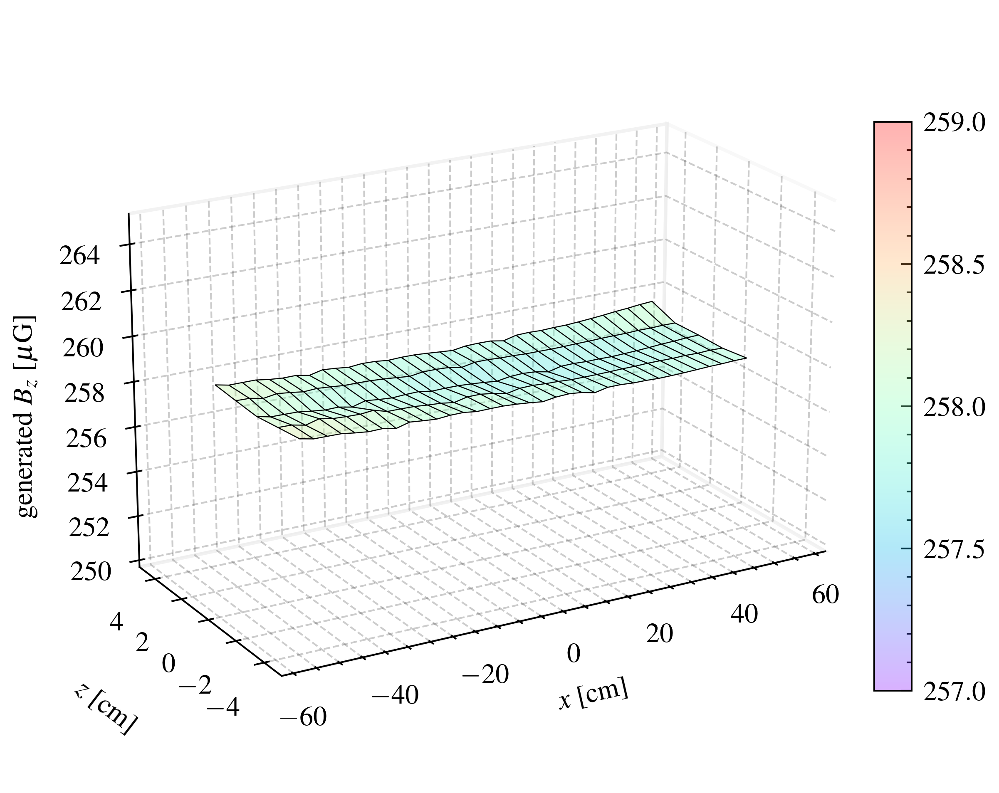

In [112]:
# Make a 3D field map on the x-z plane, for Bz

x, z = np.meshgrid(df_Bz['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_Bz['Bz1'], df_Bz['Bz4'], df_Bz['Bz2'], df_Bz['Bz5'], df_Bz['Bz3']])

# Create a new matplotlib figure and axes
fig = plt.figure(facecolor='none', figsize=(6, 4))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')
# ax.text2D(-0.08,0.9,'(a)', transform=ax.transAxes, fontsize=20, fontweight='bold')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = 257, vmax = 259, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()
ax.xaxis._axinfo["grid"]['color'] =  (0,0,0,0.2)
ax.yaxis._axinfo['grid'].update({'which': 'major', 'color': (0,0,0,0.2)})
ax.zaxis._axinfo["grid"]['color'] =  (0,0,0,0.2)

# Set plot limits
ax.set_xlim(-60, 60)
ax.xaxis.set_tick_params(pad=0)
ax.yaxis.set_tick_params(pad=0)
ax.zaxis.set_tick_params(pad=0)
ax.yaxis.set_ticks([-4, -2, 0, 2, 4])
# ax.zaxis.set_ticks([250,255,260,265])
ax.yaxis.set_minor_locator(plt.NullLocator())
ax.set_xlabel('$x$ [cm]', labelpad=0)
ax.set_ylabel('$z$ [cm]', labelpad=0)
ax.text2D(-0.1, 0.35, "generated $B_z$ [$\mu$G]", transform=ax.transAxes, rotation=90)
ax.set_ylim(-5, 5)
ax.set_zlim(250, 265)
# ax.set_zlabel('Bz [uG]', labelpad=10)
# ax.set_title('Field map for Z coil (Bz, I = 1mA)')
ax.set_box_aspect([2,1,1.2])



# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.025, 0.57]) 
# keep 1 decimal place of the colorbar
cbar = fig.colorbar(surf, cax=cax, shrink=0.7, aspect=40)
cbar.set_ticks([257.0, 257.5, 258, 258.5, 259])


# Save figure
plt.savefig('Graphs/Zcoil_FieldMap_Bz.pdf', dpi=1200, transparent=True, bbox_inches='tight')

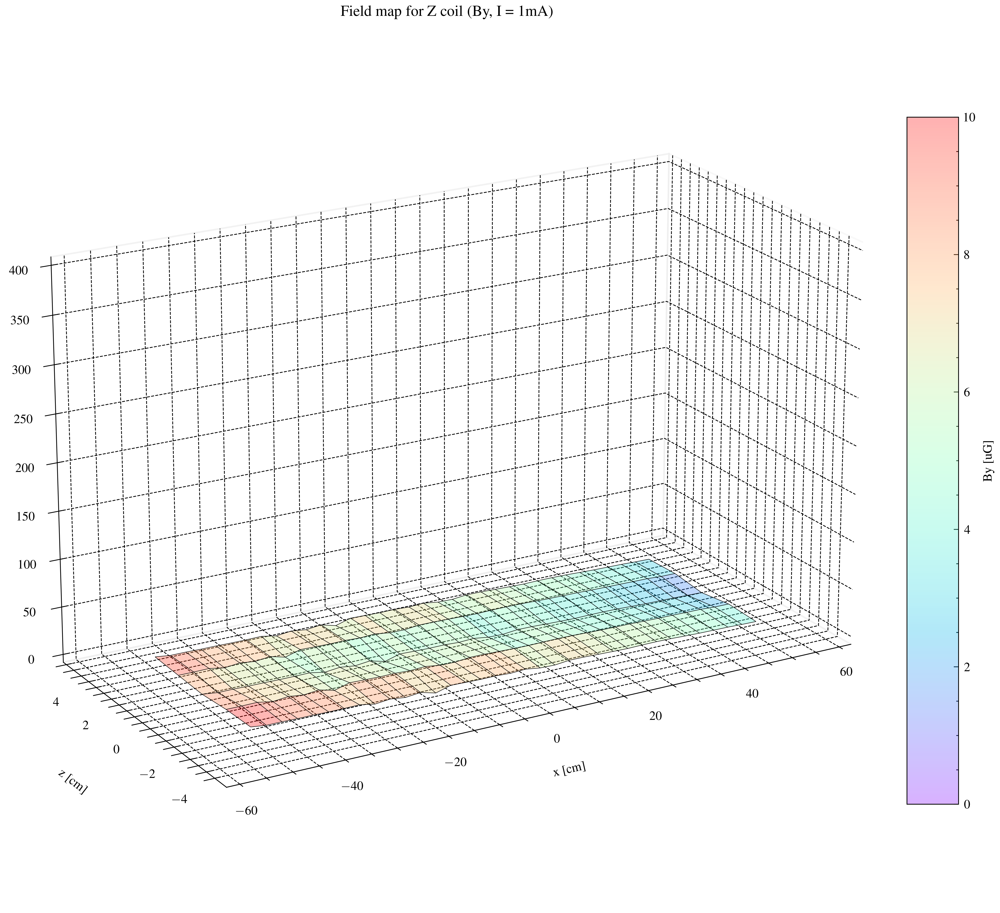

In [26]:
# Make a 3D field map on the x-z plane, for By

x, z = np.meshgrid(df_Bz['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_Bz['By1'], df_Bz['By4'], df_Bz['By2'], df_Bz['By5'], df_Bz['By3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = 0, vmax = 10, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(0, 400)
# ax.set_zlabel('By [uG]', labelpad=10)
ax.set_title('Field map for Z coil (By, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'By [uG]')

# Save figure
# plt.savefig('Graphs/Zcoil_FieldMap_By.pdf', dpi=1000, transparent=True, bbox_inches='tight')

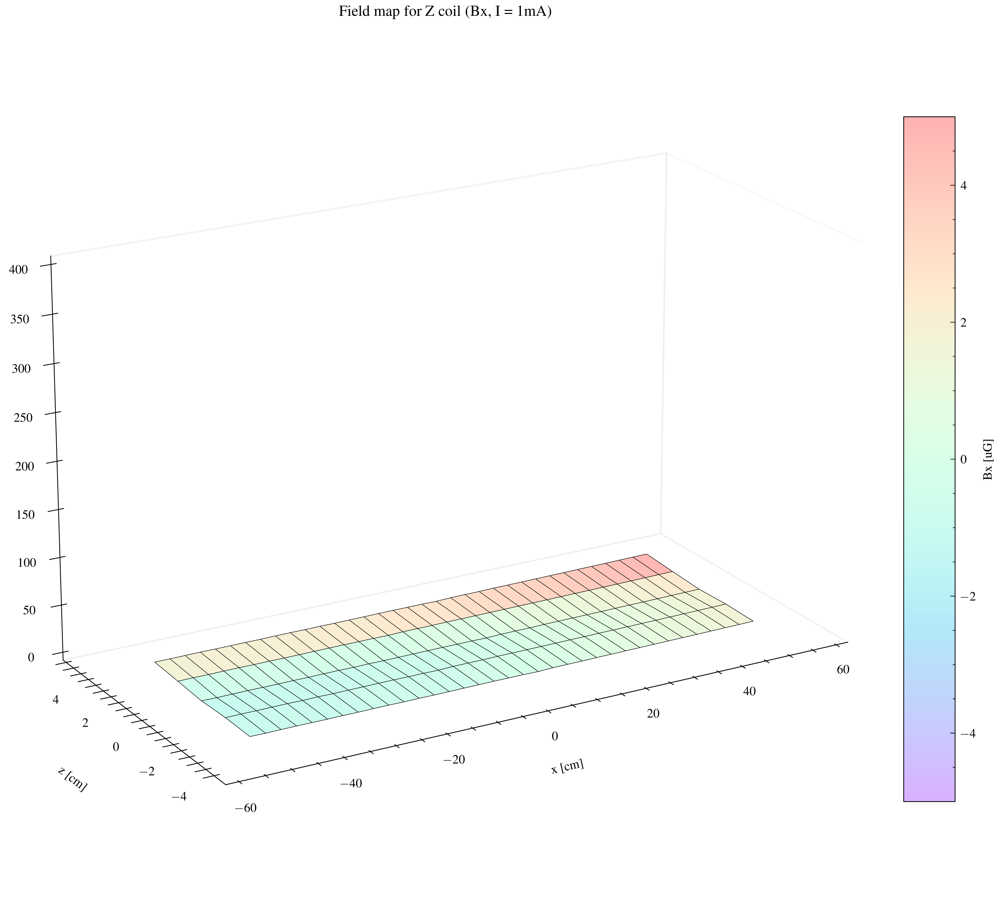

In [30]:
# Make a 3D field map on the x-z plane, for Bx

x, z = np.meshgrid(df_Bz['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_Bz['Bx1'], df_Bz['Bx4'], df_Bz['Bx2'], df_Bz['Bx5'], df_Bz['Bx3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -5, vmax = 5, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(0, 400)
# ax.set_zlabel('By [uG]', labelpad=10)
ax.set_title('Field map for Z coil (Bx, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'Bx [uG]')

# Save figure
plt.savefig('Graphs/Zcoil_FieldMap_Bx.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the field on the beamline and compare with simulation results.

<>:19: SyntaxWarning: invalid escape sequence '\m'
<>:19: SyntaxWarning: invalid escape sequence '\m'
C:\Users\Gabrielse Group NU\AppData\Local\Temp\ipykernel_9848\2080494999.py:19: SyntaxWarning: invalid escape sequence '\m'
  plt.ylabel('$B_z$ [$\mu$G/mA]', labelpad=0)


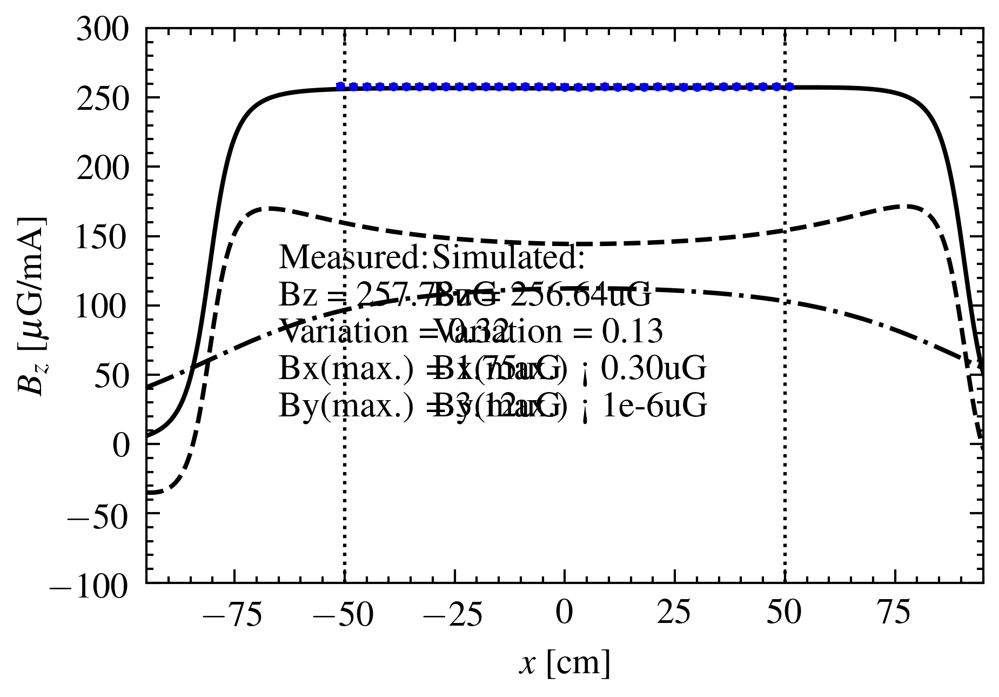

In [11]:
# Plot fields on the beamline
z_probe = 0 
z_index = 10 * z_probe - 50
Bz_error = B_field_error(df_Bz)
plt.figure(figsize=(3.33,2.22))
plt.axvline(-50, color = 'k', linestyle = ':', linewidth = 0.75)
plt.axvline(50, color = 'k', linestyle = ':', linewidth = 0.75)

plt.plot(simX+5.08, simInnerZ/248.253*256.641, '--', label = 'Simulated Bz (inner coil)', color = 'k')
plt.plot(simX+5.08, simOuterZ/248.253*256.641, '-.', label = 'Simulated Bz (outer coil)', color = 'k')
plt.plot(simX+5.08, simZ/248.253*256.641, '-', label = 'Simulated Bz', color = 'k')
plt.errorbar(df_Bz['dist'], df_Bz['Bz2'], yerr=Bz_error['Bz2'], fmt='o', color = 'b', ms=1, capsize=1, capthick=0.5, elinewidth=0.5, label = 'Measured Bz')
# plt.plot(df_Bz['dist'], df_Bz['Bz2'], 's', ms=1, color = 'b', label = 'Measured Bz')
# plt.text(-0.08,1.08,'(b)', transform=plt.gca().transAxes, fontsize=20, fontweight='bold')

plt.xlabel('$x$ [cm]')
plt.xticks([-75, -50, -25, 0, 25, 50, 75])
plt.yticks([-100,-50,0,50,100,150,200,250,300])
plt.ylabel('$B_z$ [$\mu$G/mA]', labelpad=0)
# plt.title('Field of the Z coil (I = 1mA)')
plt.xlim(-95, 95)
plt.ylim(-100, 300)

plot_text = 'Measured:\nBz = {:.2f}uG\nVariation = {:.2f}%\nBx(max.) = {:.2f}uG\nBy(max.) = {:.2f}uG'.format(np.mean(df_Bz['Bz2']),
                                                                                                delta_Bz/np.mean(df_Bz['Bz2'])*100,
                                                                                                np.max(np.abs(df_Bz['Bx2'])), 
                                                                                                np.mean(df_Bz['By2']))

sim_text = 'Simulated:\nBz = {:.2f}uG\nVariation = {:.2f}%\nBx(max.) < 0.30uG\nBy(max.) < 1e-6uG'.format(256.641, 
                                                                                               (np.max(np.max(Bz_coil_Z[20:80, 250:1250])) - np.min(np.min(Bz_coil_Z[20:80, 250:1250])))*100/256.641)
# plt.text(0, 235, 'inner + outer', color='k', ha='center', va='center')
# plt.text(0,275, 'measured $B_z$', color='b', ha='center', va='center')
# plt.text(0, 165, 'inner coil', color='k', ha='center', va='center')
# plt.text(0, 90, 'outer coil', color='k', ha='center', va='center')
plt.text(-65, 20, plot_text)
plt.text(-30, 20, sim_text)
plt.grid(False)

# Save Figure. Check each time!
# plt.savefig('Graphs/Zcoil_Beamline.pdf', dpi=1200, bbox_inches='tight')

In [14]:
257.358-256.641

0.7169999999999845

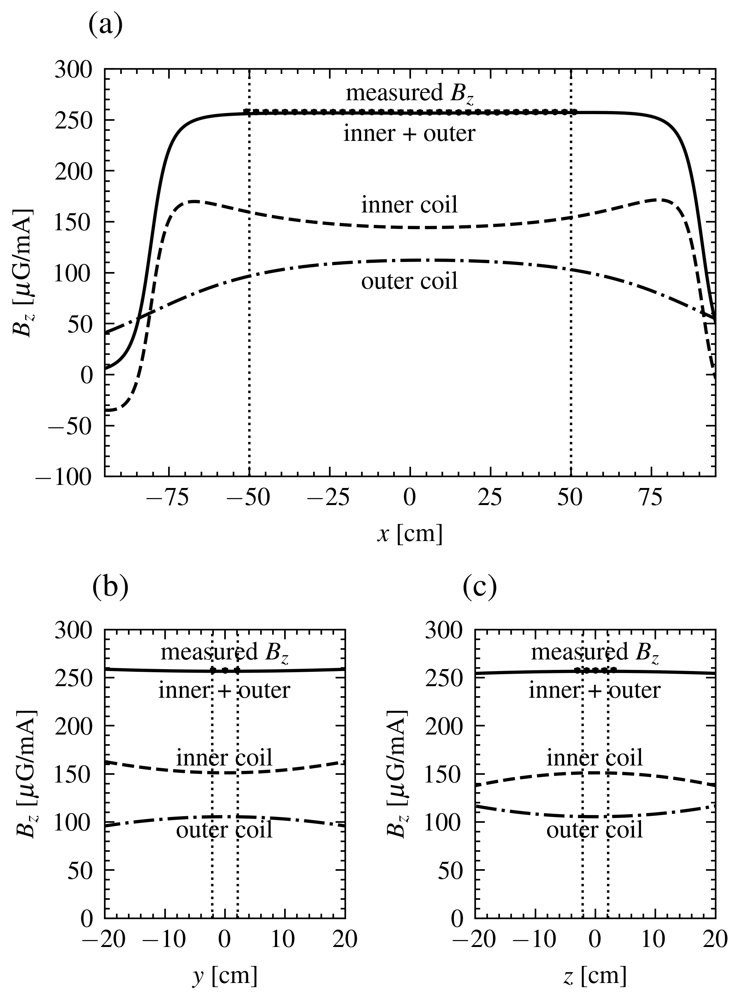

In [23]:
# import the data for Z coil distribution on y and z axis
df_BzoverY = pd.read_csv('Extended Simulation/Bz_on_Y.csv', header=None)
df_BzoverZ = pd.read_csv('Extended Simulation/Bz_on_Z.csv', header=None)
df_BzInneroverY = pd.read_csv('Extended Simulation/Bz_innercoil_on_Y.csv', header=None)
df_BzInneroverZ = pd.read_csv('Extended Simulation/Bz_innercoil_on_Z.csv', header=None)
df_BzOuteroverY = pd.read_csv('Extended Simulation/Bz_outercoil_on_Y.csv', header=None)
df_BzOuteroverZ = pd.read_csv('Extended Simulation/Bz_outercoil_on_Z.csv', header=None)

# create the graph with 3 subplots 

fig = plt.figure(figsize=(3.33, 4.5))

# Bz field over x axis
ax1 = fig.add_subplot(2, 1, 1) 
ax1.axvline(-50, color = 'k', linestyle = ':', linewidth = 0.75)
ax1.axvline(50, color = 'k', linestyle = ':', linewidth = 0.75)
ax1.set_box_aspect(2/3)

z_probe = 0 
z_index = 10 * z_probe - 50
Bz_error = B_field_error(df_Bz)

ax1.plot(simX+5.08, simInnerZ/248.253*256.641, '--', color = 'k')
ax1.plot(simX+5.08, simOuterZ/248.253*256.641, '-.', color = 'k')
ax1.plot(simX+5.08, simZ/248.253*256.641, '-', color = 'k')
ax1.errorbar(df_Bz['dist'], df_Bz['Bz2'], yerr=Bz_error['Bz2'], fmt='o', color = 'k', ms=1, capsize=1, capthick=0.5, elinewidth=0.5)

ax1.set_xlabel('$x$ [cm]')
ax1.set_xticks([-75, -50, -25, 0, 25, 50, 75])
ax1.set_ylabel('$B_z$ [$\mu$G/mA]', labelpad=0)
ax1.set_yticks([-100,-50,0,50,100,150,200,250,300])
ax1.set_xlim(-95, 95)
ax1.set_ylim(-100, 300)
ax1.grid(False)

ax1.text(0, 235, 'inner + outer', color='k', ha='center', va='center')
ax1.text(0,275, 'measured $B_z$', color='k', ha='center', va='center')
ax1.text(0, 165, 'inner coil', color='k', ha='center', va='center')
ax1.text(0, 90, 'outer coil', color='k', ha='center', va='center')

ax1.text(-100, 335, '(a)', fontsize=10, color='k')

# Bz field over y axis
Bz_over_Z = np.array([df_Bz['Bz1'][17], df_Bz['Bz4'][17], df_Bz['Bz2'][17], df_Bz['Bz5'][17], df_Bz['Bz3'][17]])
Error_Bz_over_Z = np.array([Bz_error['Bz1'][17], Bz_error['Bz4'][17], Bz_error['Bz2'][17], Bz_error['Bz5'][17], Bz_error['Bz3'][17]])
Bz_over_Y = np.array([(df_Bz['Bz1'][17] + df_Bz['Bz4'][17])/2, df_Bz['Bz2'][17], (df_Bz['Bz5'][17] + df_Bz['Bz3'][17])/2])
Error_Bz_over_Y = np.array([(Bz_error['Bz1'][17] + Bz_error['Bz4'][17])/2, Bz_error['Bz2'][17], (Bz_error['Bz5'][17] + Bz_error['Bz3'][17])/2])

ax2 = fig.add_subplot(2, 2, 3) 
ax2.axvline(-2.1, color = 'k', linestyle = ':', linewidth = 0.75)
ax2.axvline(2.1, color = 'k', linestyle = ':', linewidth = 0.75)

ax2.plot(df_BzInneroverY[0]/10, df_BzInneroverY[1], '--', color = 'k')
ax2.plot(df_BzOuteroverY[0]/10, df_BzOuteroverY[1], '-.', color = 'k')
ax2.plot(df_BzoverY[0]/10, df_BzoverY[1], '-', color = 'k')
ax2.errorbar([-2,0,2], Bz_over_Y, yerr=Error_Bz_over_Y, fmt='o', color = 'k', ms=1, capsize=1, capthick=0.5, elinewidth=0.5)
ax2.set_box_aspect(1.2)

ax2.set_xlabel('$y$ [cm]')
ax2.set_xticks([-20, -10, 0, 10, 20])
ax2.set_ylabel('$B_z$ [$\mu$G/mA]', labelpad=5)
ax2.set_yticks([0,50,100,150,200,250,300])
ax2.set_xlim(-20,20)
ax2.set_ylim(0, 300)
ax2.grid(False)

ax2.text(0, 235, 'inner + outer', color='k', ha='center', va='center')
ax2.text(0,275, 'measured $B_z$', color='k', ha='center', va='center')
ax2.text(0, 165, 'inner coil', color='k', ha='center', va='center')
ax2.text(0, 90, 'outer coil', color='k', ha='center', va='center')

ax2.text(-22, 335, '(b)', fontsize=10, color='k')

# Subplot 3: Half width on the second row, right side
ax3 = fig.add_subplot(2, 2, 4) # 2 rows, 2 columns, position 4 (bottom right)
ax3.axvline(-2.1, color = 'k', linestyle = ':', linewidth = 0.75)
ax3.axvline(2.1, color = 'k', linestyle = ':', linewidth = 0.75)

ax3.plot(df_BzInneroverZ[0]/10, df_BzInneroverZ[1], '--', color = 'k')
ax3.plot(df_BzOuteroverZ[0]/10, df_BzOuteroverZ[1], '-.', color = 'k')
ax3.plot(df_BzoverZ[0]/10, df_BzoverZ[1], '-', color = 'k')
ax3.errorbar([-3,-1.5,0,1.5,3], Bz_over_Z, yerr=Error_Bz_over_Z, fmt='o', color = 'k', ms=1, capsize=1, capthick=0.5, elinewidth=0.5)
ax3.set_box_aspect(1.2)

ax3.set_xlabel('$z$ [cm]')
ax3.set_xticks([-20, -10, 0, 10, 20])
ax3.set_ylabel('$B_z$ [$\mu$G/mA]', labelpad=5)
ax3.set_yticks([0,50,100,150,200,250,300])
ax3.set_xlim(-20,20)
ax3.set_ylim(0, 300)
ax3.grid(False)

ax3.text(0, 235, 'inner + outer', color='k', ha='center', va='center')
ax3.text(0,275, 'measured $B_z$', color='k', ha='center', va='center')
ax3.text(0, 165, 'inner coil', color='k', ha='center', va='center')
ax3.text(0, 90, 'outer coil', color='k', ha='center', va='center')


ax3.text(-22, 335, '(c)', fontsize=10, color='k')

fig.subplots_adjust(hspace=-0.4)

plt.tight_layout()

plt.savefig('Graphs/Bz_freespace.pdf', dpi=1200, bbox_inches='tight')

<>:12: SyntaxWarning: invalid escape sequence '\m'
<>:12: SyntaxWarning: invalid escape sequence '\m'
C:\Users\Gabrielse Group NU\AppData\Local\Temp\ipykernel_9848\890247878.py:12: SyntaxWarning: invalid escape sequence '\m'
  plt.ylabel('magnetic field [$\mu$G/mA]')


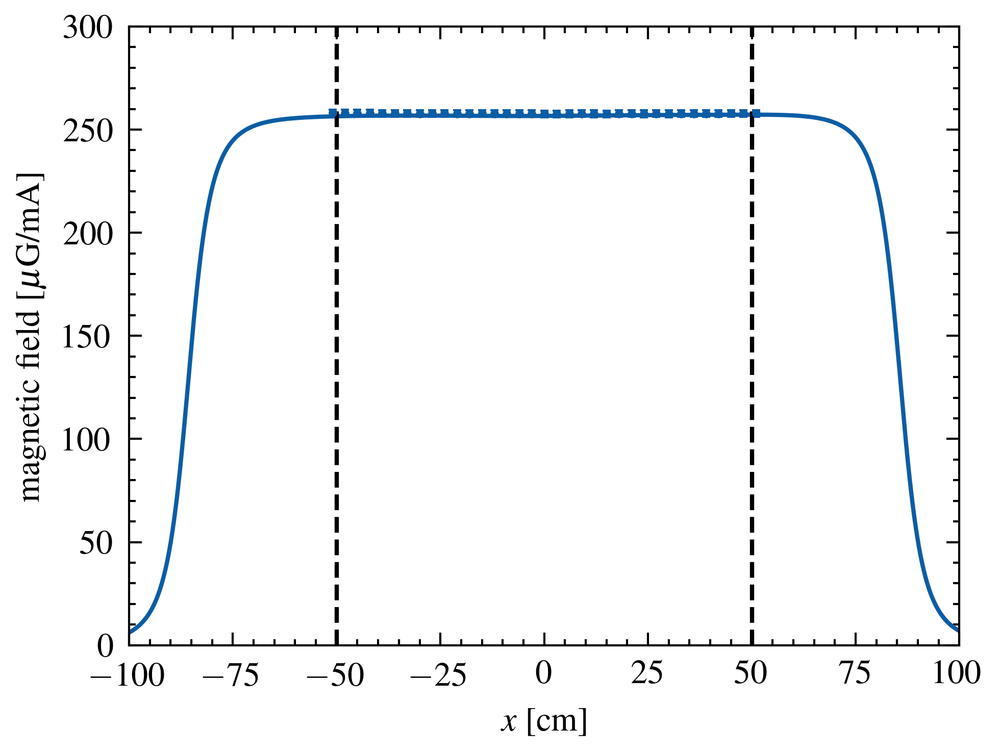

In [10]:
# Plot fields on the beamline
simX = np.linspace(-100, 100, 2001)
Bz_error = B_field_error(df_Bz)
plt.figure()

plt.plot(simX, simZ/248.253*256.641, '-', label = 'Simulated Bz', color = 'C0')
plt.errorbar(df_Bz['dist'], df_Bz['Bz2'], yerr=Bz_error['Bz2'], fmt='o', ms=1, capsize=1, elinewidth=0.5, capthick=0.5, label = 'Measured Bz')
# plt.text(-0.08,1.08,'(b)', transform=plt.gca().transAxes, fontsize=20, fontweight='bold')

# plt.legend(loc = 'lower center')
plt.xlabel('$x$ [cm]')
plt.ylabel('magnetic field [$\mu$G/mA]')
# plt.title('Field of the Z coil (I = 1mA)')
plt.xlim(-100, 100)
plt.ylim(0, 300)
plt.grid(False)

# plt.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
plt.axvline(x=-50, color='k', linestyle='--')
plt.axvline(x=50, color='k', linestyle='--')
# plt.axvline(x=185.7/2+2.54, color='k', linestyle='--')
# plt.axvline(x=-185.7/2+2.54, color='k', linestyle='--')
# plt.text(-85, 175, 'Inner\nShield')
# plt.text(60, 175, 'Inner\nShield')
# plt.text(-52, 120, 'Spin-precession region', color='C0')
# plt.text(-30, 20, sim_text)
# plt.grid(alpha = 0.3)

# Save Figure. Check each time!
# plt.savefig('Graphs/Zcoil_ExtendedBeamline.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the gradients

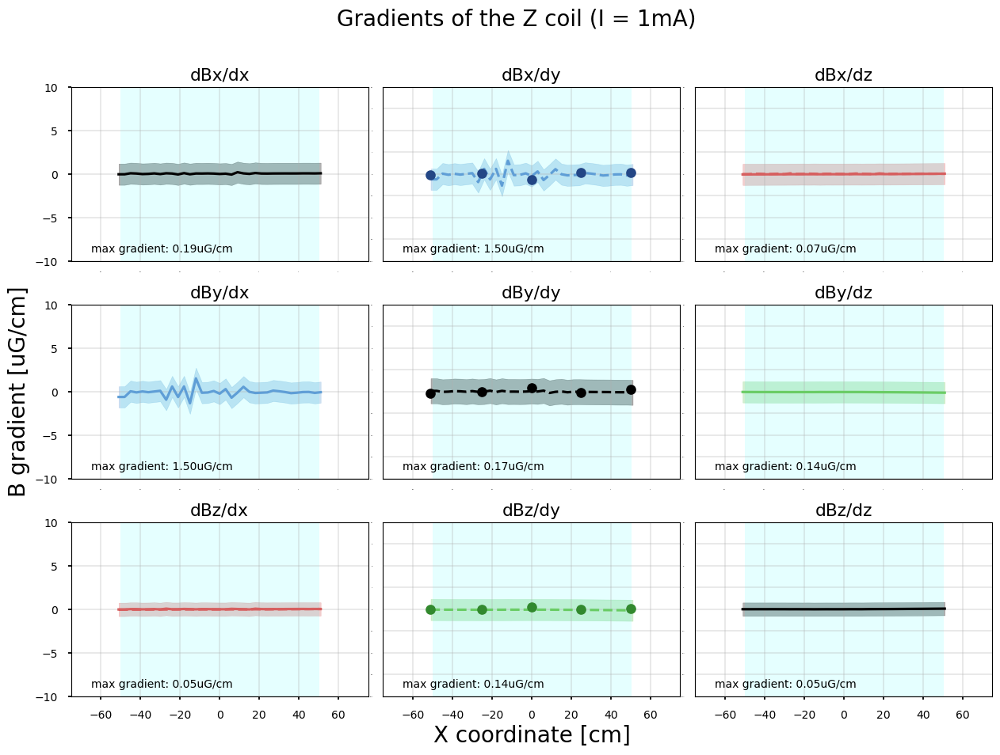

In [82]:
# Plot gradients
fig, axs = plt.subplots(3, 3, figsize=(15, 10), facecolor='none')
plt.subplots_adjust(wspace=0.05, hspace=0.25)

x = df_Bz['dist']
ys = [df_Bz['dBxdx'], df_Bz['dBydx'], df_Bz['dBxdz23'],
    df_Bz['dBydx'], df_Bz['dBydy'], df_Bz['dBydz'],
    df_Bz['dBzdx'], df_Bz['dBydz'], df_Bz['dBzdz']]

axs[0, 0].plot(df_Bz['dist'], df_Bz['dBxdx'], label = 'dBxdx', color = 'black')
axs[0,0].fill_between(df_Bz['dist'], df_Bz['dBxdx'] - Bz_error['dBxdx2'], df_Bz['dBxdx'] + Bz_error['dBxdx2'], alpha = 0.3, color = 'black')
axs[0, 1].plot(df_Bz['dist'], df_Bz['dBydx'], '--', label = 'dBxdy', color = '#5F9ED6')
axs[0, 1].fill_between(df_Bz['dist'], df_Bz['dBydx'] - Bz_error['dBydx2'], df_Bz['dBydx'] + Bz_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[0, 2].plot(df_Bz['dist'], df_Bz['dBxdz23'], label = 'dBxdz', color = '#D65F5F')
axs[0, 2].fill_between(df_Bz['dist'], df_Bz['dBxdz23'] - Bz_error['dBxdz'], df_Bz['dBxdz23'] + Bz_error['dBxdz'], alpha = 0.3, color = '#D65F5F')
axs[0, 2].plot(df_Bz['dist'], df_Bz['dBzdx'], '--', label = 'dBzdx', color = '#D65F5F')
axs[1, 0].plot(df_Bz['dist'], df_Bz['dBydx'], label = 'dBxdy', color = '#5F9ED6')
axs[1, 0].fill_between(df_Bz['dist'], df_Bz['dBydx'] - Bz_error['dBydx2'], df_Bz['dBydx'] + Bz_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[1, 1].plot(df_Bz['dist'], df_Bz['dBydy'], '--', label = 'dBydy', color = 'black')
axs[1, 1].fill_between(df_Bz['dist'], df_Bz['dBydy'] - Bz_error['dBydy'], df_Bz['dBydy'] + Bz_error['dBydy'], alpha = 0.3, color = 'black')
axs[1, 2].plot(df_Bz['dist'], df_Bz['dBydz'], label = 'dBydz', color = '#6ACC65')
axs[1, 2].fill_between(df_Bz['dist'], df_Bz['dBydz'] - Bz_error['dBydz'], df_Bz['dBydz'] + Bz_error['dBydz'], alpha = 0.3, color = '#6ACC65')
axs[2, 0].plot(df_Bz['dist'], df_Bz['dBzdx'], label = 'dBzdx', color = '#D65F5F')
axs[2, 0].fill_between(df_Bz['dist'], df_Bz['dBzdx'] - Bz_error['dBzdx2'], df_Bz['dBzdx'] + Bz_error['dBzdx2'], alpha = 0.3, color = '#D65F5F')
axs[2, 0].plot(df_Bz['dist'], df_Bz['dBxdz23'], '--', label = 'dBxdz', color = '#D65F5F')
axs[2, 1].plot(df_Bz['dist'], df_Bz['dBydz'], '--', label = 'dBydz', color = '#6ACC65')
axs[2, 1].fill_between(df_Bz['dist'], df_Bz['dBydz'] - Bz_error['dBydz'], df_Bz['dBydz'] + Bz_error['dBydz'], alpha = 0.3, color = '#6ACC65')
axs[2, 2].plot(df_Bz['dist'], df_Bz['dBzdz'], label = 'dBzdz', color = 'black')
axs[2, 2].fill_between(df_Bz['dist'], df_Bz['dBzdz'] - Bz_error['dBzdz'], df_Bz['dBzdz'] + Bz_error['dBzdz'], alpha = 0.3, color = 'black')

for ax, y in zip(axs.flat, ys):
    ax.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
    ax.set_ylim(-10, 10);
    ax.set_xlim(-75, 75);
    # ax.set_yticks([-10,-7.50,-5.00,-2.50,0,2.50,5.00,7.50,10]);
    ax.set_xticks([-60,-40,-20,0,20,40,60]);
    ax.tick_params(axis='both', which='both', length=0, labelsize=0);
    ax.grid(alpha=0.3)
    max_value = np.max(np.abs(y))
    ax.text(-65, -9, f'max gradient: {max_value:.2f}uG/cm')

dBdy_x_coor = [-51, -25, 0, 25, 50]
dBxdy_add_Bz = [-0.08909214,  0.0617912 , -0.68419961,  0.16542933,  0.13417898]
dBydy_add_Bz = [-0.1954126 , -0.04643498,  0.40592846, -0.14909685,  0.26171565]
dBzdy_add_Bz = [-0.05813131, -0.05877249,  0.24609655, -0.0379243 ,  0.07463693]
axs[0, 1].plot(dBdy_x_coor, dBxdy_add_Bz, 'o', color = darken_color(0))
axs[1, 1].plot(dBdy_x_coor, dBydy_add_Bz, 'o', color = 'black')
axs[2, 1].plot(dBdy_x_coor, dBzdy_add_Bz, 'o', color = darken_color(1))

axs[0, 0].set_title('dBx/dx')
axs[0, 1].set_title('dBx/dy')
axs[0, 2].set_title('dBx/dz')
axs[1, 0].set_title('dBy/dx')
axs[1, 1].set_title('dBy/dy')
axs[1, 2].set_title('dBy/dz')
axs[2, 0].set_title('dBz/dx')
axs[2, 1].set_title('dBz/dy')
axs[2, 2].set_title('dBz/dz')

axs[0,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[2,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].set_ylabel('B gradient [uG/cm]', fontsize=20);
axs[2,0].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,2].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].set_xlabel('X coordinate [cm]', fontsize=20);


fig.suptitle('Gradients of the Z coil (I = 1mA)', fontsize=20)

# Save Figure. Check each time!
plt.savefig('Graphs/Zcoil_Gradients.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the fringe field

In [4]:
# Import Bz fringe field data
df = pd.read_csv('Field Data/Bz_fringefield_Mag1.csv', sep=',', header=None)
df.columns = ['dist', 'current', 
         'Mag1Bx', 'Mag1By', 'Mag1Bz', 
         'Mag2Bx', 'Mag2By', 'Mag2Bz', 
         'Mag3Bx', 'Mag3By', 'Mag3Bz', 
         'Mag4Bx', 'Mag4By', 'Mag4Bz', 
         'Mag5Bx', 'Mag5By', 'Mag5Bz']

df['Mag1B'] = np.sqrt(df['Mag1Bx']**2 + df['Mag1By']**2 + df['Mag1Bz']**2) / df['current'] * 1000

data5 = df['Mag1B'][0:25].values
data5 = data5.reshape(5,5)
data8 = df['Mag1B'][25:50].values
data8 = data8.reshape(5,5)
data2 = df['Mag1B'][50:75].values
data2 = data2.reshape(5,5)[::-1]
data4 = df['Mag1B'][75:100].values
data4 = data4.reshape(5,5)
data4 = np.rot90(data4, 3)
data6 = df['Mag1B'][100:125].values
data6 = data6.reshape(5,5)
data6[4] = df['Mag1B'][95:100] + np.random.rand(5) * 2
data6 = np.rot90(data6)

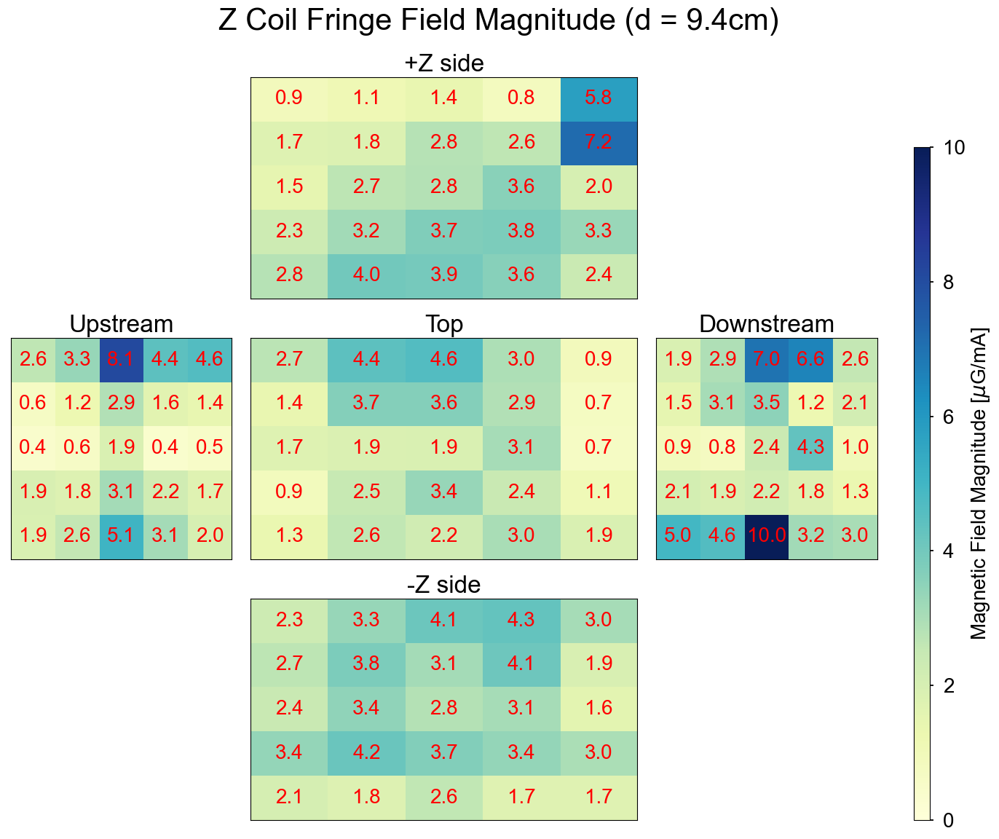

In [12]:
# Plot Fringe fields

import matplotlib.gridspec as gridspec
import matplotlib.cm as cm

fig = plt.figure(figsize=(15, 12))  # Total figure size, you might need to adjust this
gs = gridspec.GridSpec(3, 3, width_ratios=[1, 1.75, 1])  # We give twice space to middle column

# Define vmin and vmax for color scaling across all subplots
vmin = 0
vmax = 10

# Create a colormap
cmap = cm.YlGnBu
# Plot
ax2 = plt.subplot(gs[0, 1])
im2 = ax2.imshow(data2, vmin=vmin, vmax=vmax, cmap=cmap, aspect=0.5714)
ax2.set_xticks([])
ax2.set_yticks([])
ax2.set_title('+Z side', fontsize=24)
for k in range(5):
    for l in range(5):
        ax2.text(l,k,round(data2[k,l],1),ha="center", va="center", color="r", fontsize=20)

ax4 = plt.subplot(gs[1, 0])
im4 = ax4.imshow(data4, vmin=vmin, vmax=vmax, cmap=cmap, aspect=1)
ax4.set_xticks([])
ax4.set_yticks([])
ax4.set_title('Upstream', fontsize=24)
for k in range(5):
    for l in range(5):
        ax4.text(l,k,round(data4[k,l],1),ha="center", va="center", color="r", fontsize=20)

ax5 = plt.subplot(gs[1, 1])
im5 = ax5.imshow(data5, vmin=vmin, vmax=vmax, cmap=cmap, aspect=0.5714)
ax5.set_xticks([])
ax5.set_yticks([])
ax5.set_title('Top', fontsize=24)
for k in range(5):
    for l in range(5):
        ax5.text(l,k,round(data5[k,l],1),ha="center", va="center", color="r", fontsize=20)

ax6 = plt.subplot(gs[1, 2])
im6 = ax6.imshow(data6, vmin=vmin, vmax=vmax, cmap=cmap, aspect=1)
ax6.set_xticks([])
ax6.set_yticks([])
ax6.set_title('Downstream', fontsize=24)
for k in range(5):
    for l in range(5):
        ax6.text(l,k,round(data6[k,l],1),ha="center", va="center", color="r", fontsize=20)

ax8 = plt.subplot(gs[2, 1])
im8 = ax8.imshow(data8, vmin=vmin, vmax=vmax, cmap=cmap, aspect=0.5714)
ax8.set_xticks([])
ax8.set_yticks([])
ax8.set_title('-Z side', fontsize=24)
for k in range(5):
    for l in range(5):
        ax8.text(l,k,round(data8[k,l],1),ha="center", va="center", color="r", fontsize=20)

# Add an overall colorbar on the right of the whole graph
cax = fig.add_axes([0.88, 0.05, 0.015, 0.77])  # Position of the colorbar [left, bottom, width, height]
cbar=fig.colorbar(im2, cax=cax)
cbar.set_label(label = 'Magnetic Field Magnitude [$\mu$G/mA]', fontsize=20)
cax.tick_params(labelsize=20)

# Add an overall title
fig.suptitle('Z Coil Fringe Field Magnitude (d = 9.4cm)', fontsize=30)


# Adjust spacing between subplots
fig.subplots_adjust(left=0.05, right=0.85, bottom=0.05, top=0.9, wspace=0.03, hspace=0.18)

# Save figure
plt.savefig('Graphs/Zcoil_FringeField.pdf', dpi=1000, transparent=True, bbox_inches='tight')

# dBz/dz

## Import and process the data

In [36]:
# Import the data
df = pd.read_csv('Field Data/dBzdz_field.csv', sep=',', header=None)

df.columns = ['dist', 'current', 
         'Mag1Bx', 'Mag1By', 'Mag1Bz', 
         'Mag2Bx', 'Mag2By', 'Mag2Bz', 
         'Mag3Bx', 'Mag3By', 'Mag3Bz', 
         'Mag4Bx', 'Mag4By', 'Mag4Bz', 
         'Mag5Bx', 'Mag5By', 'Mag5Bz']
df = df.sort_values(by=['dist']).reset_index(drop=True)

# Figure out the current we actually need to apply
dBzdz_target = 200 # uG/cm
dBzdz_measured = (df['Mag1Bx'][17] - df['Mag3Bx'][17]) / 6
dBzdz_current_measured = df['current'][17]
dBzdz_current_target = dBzdz_target * dBzdz_current_measured / dBzdz_measured

# Normalize the fields to unit current values
# Redo calibration
# Bx -> 0.9548 * Bx
# By -> [0.9116, 1.0093, 1.0392, 0.9159, 1.0220] * By
# Bz -> [0.9107, 1.1095, 1.1023, 0.9187, 1.0880] * Bz
# Transform to ACME coordinates
# sensor -> ACME
# x -> z
# y -> -y
# z -> x
df['Bz1'] = df['Mag1Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By1'] = -df['Mag1By']/np.mean(df['current']) * 911.6 * 256.641 / 248.253
df['Bx1'] = df['Mag1Bz']/np.mean(df['current']) * 910.7 * 256.641 / 248.253
df['Bz2'] = df['Mag2Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By2'] = -df['Mag2By']/np.mean(df['current']) * 1009.3 * 256.641 / 248.253
df['Bx2'] = df['Mag2Bz']/np.mean(df['current']) * 1109.5 * 256.641 / 248.253
df['Bz3'] = df['Mag3Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By3'] = -df['Mag3By']/np.mean(df['current']) * 1039.2 * 256.641 / 248.253
df['Bx3'] = df['Mag3Bz']/np.mean(df['current']) * 1102.3 * 256.641 / 248.253
df['Bz4'] = df['Mag4Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By4'] = -df['Mag4By']/np.mean(df['current']) * 915.9 * 256.641 / 248.253
df['Bx4'] = df['Mag4Bz']/np.mean(df['current']) * 918.7 * 256.641 / 248.253
df['Bz5'] = df['Mag5Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By5'] = -df['Mag5By']/np.mean(df['current']) * 1022.0 * 256.641 / 248.253
df['Bx5'] = df['Mag5Bz']/np.mean(df['current']) * 1088.0 * 256.641 / 248.253

# Align measurements on mag4 and Mag5 to same x location.
df['Bx4'][0:35] = df['Bx4'][5:]
df['By4'][0:35] = df['By4'][5:]
df['Bz4'][0:35] = df['Bz4'][5:]
df['Bx5'][0:35] = df['Bx5'][5:]
df['By5'][0:35] = df['By5'][5:]
df['Bz5'][0:35] = df['Bz5'][5:]
df_dBzdz = df.iloc[0:35,:]

print(dBzdz_current_target)

25629.539384283773


In [37]:
# Calculate the gradients
# dBdz gradients
df_dBzdz['dBzdz12'] = (df_dBzdz['Bz1'] - df_dBzdz['Bz2']) / 3
df_dBzdz['dBydz12'] = (df_dBzdz['By1'] - df_dBzdz['By2']) / 3
df_dBzdz['dBxdz12'] = (df_dBzdz['Bx1'] - df_dBzdz['Bx2']) / 3
df_dBzdz['dBzdz23'] = (df_dBzdz['Bz2'] - df_dBzdz['Bz3']) / 3
df_dBzdz['dBydz23'] = (df_dBzdz['By2'] - df_dBzdz['By3']) / 3
df_dBzdz['dBxdz23'] = (df_dBzdz['Bx2'] - df_dBzdz['Bx3']) / 3
df_dBzdz['dBzdz'] = (df_dBzdz['dBzdz12'] + df_dBzdz['dBzdz23']) / 2
df_dBzdz['dBydz'] = (df_dBzdz['dBydz12'] + df_dBzdz['dBydz23']) / 2
# df_dBzdz['dBxdz'] = (df_dBzdz['dBxdz12'] + df_dBzdz['dBxdz23']) / 2
df_dBzdz['dBxdz'] = df_dBzdz['dBxdz23']
# dBdx gradients
df_dBzdz['dBzdx1'] = df_dBzdz['Bz1'].diff() / 3
df_dBzdz['dBydx1'] = df_dBzdz['By1'].diff() / 3
df_dBzdz['dBxdx1'] = df_dBzdz['Bx1'].diff() / 3
df_dBzdz['dBzdx1'][0] = df_dBzdz['dBzdx1'][1]
df_dBzdz['dBydx1'][0] = df_dBzdz['dBydx1'][1]
df_dBzdz['dBxdx1'][0] = df_dBzdz['dBxdx1'][1]
df_dBzdz['dBzdx2'] = df_dBzdz['Bz2'].diff() / 3
df_dBzdz['dBydx2'] = df_dBzdz['By2'].diff() / 3
df_dBzdz['dBxdx2'] = df_dBzdz['Bx2'].diff() / 3
df_dBzdz['dBzdx2'][0] = df_dBzdz['dBzdx2'][1]
df_dBzdz['dBydx2'][0] = df_dBzdz['dBydx2'][1]
df_dBzdz['dBxdx2'][0] = df_dBzdz['dBxdx2'][1]
df_dBzdz['dBzdx3'] = df_dBzdz['Bz3'].diff() / 3
df_dBzdz['dBydx3'] = df_dBzdz['By3'].diff() / 3
df_dBzdz['dBxdx3'] = df_dBzdz['Bx3'].diff() / 3
df_dBzdz['dBzdx3'][0] = df_dBzdz['dBzdx3'][1]
df_dBzdz['dBydx3'][0] = df_dBzdz['dBydx3'][1]
df_dBzdz['dBxdx3'][0] = df_dBzdz['dBxdx3'][1]
df_dBzdz['dBzdx'] = (df_dBzdz['dBzdx1'] + df_dBzdz['dBzdx2'] + df_dBzdz['dBzdx3']) / 3
df_dBzdz['dBydx'] = (df_dBzdz['dBydx1'] + df_dBzdz['dBydx2'] + df_dBzdz['dBydx3']) / 3
df_dBzdz['dBxdx'] = (df_dBzdz['dBxdx1'] + df_dBzdz['dBxdx2'] + df_dBzdz['dBxdx3']) / 3
#dBydy gradient
df_dBzdz['dBydy1'] = - (df_dBzdz['dBxdx1'] + df_dBzdz['dBzdz12'])
df_dBzdz['dBydy2'] = - (df_dBzdz['dBxdx2'] + df_dBzdz['dBzdz12'])
df_dBzdz['dBydy3'] = - (df_dBzdz['dBxdx2'] + df_dBzdz['dBzdz23'])
df_dBzdz['dBydy4'] = - (df_dBzdz['dBxdx3'] + df_dBzdz['dBzdz23'])
df_dBzdz['dBydy'] = (df_dBzdz['dBydy1'] + df_dBzdz['dBydy2'] + df_dBzdz['dBydy3'] + df_dBzdz['dBydy4']) / 4

# Calculate the maximum range of the field in the interaction region
# Bz_max = df_Bz[['Bz1', 'Bz2', 'Bz3']].max() 
# Bz_min = df_Bz[['Bz1', 'Bz2', 'Bz3']].min()
# delta_Bz = Bz_max.max() - Bz_min.min()

/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/2162209527.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dBzdz['dBzdz12'] = (df_dBzdz['Bz1'] - df_dBzdz['Bz2']) / 3
/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/2162209527.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dBzdz['dBydz12'] = (df_dBzdz['By1'] - df_dBzdz['By2']) / 3
/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/2162209527.py:5: SettingWithCopyWarning: 
A value is trying to be s

## Plot the field maps

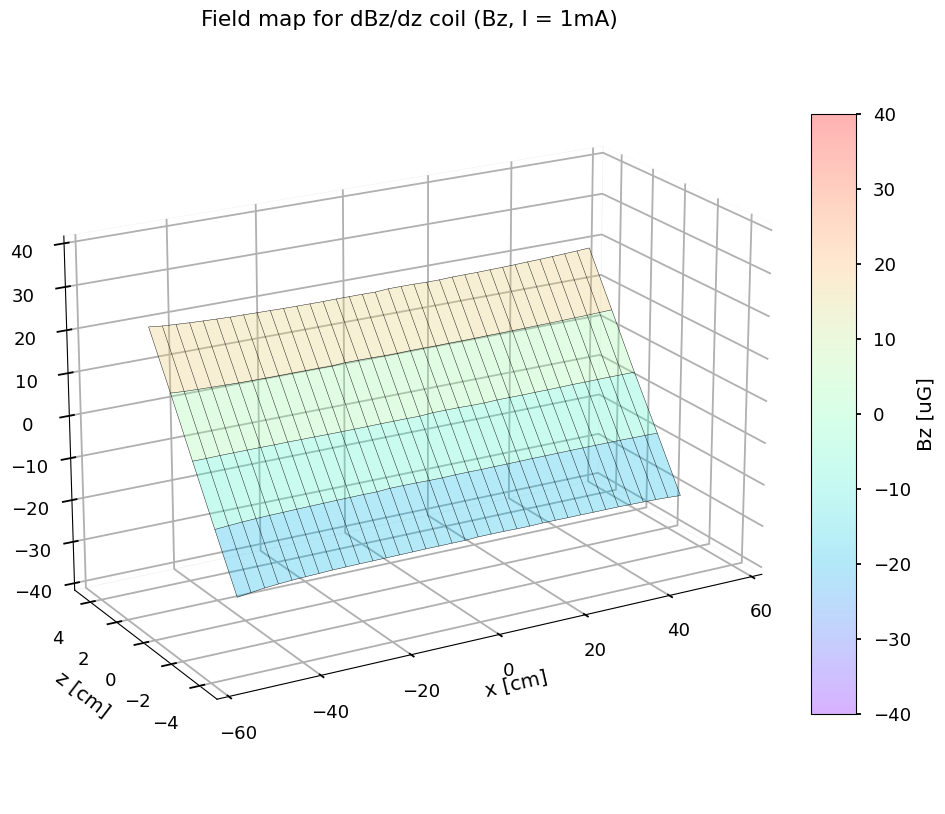

In [71]:
# Make a 3D field map on the x-z plane, for Bz

x, z = np.meshgrid(df_Bz['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBzdz['Bz1'], df_dBzdz['Bz4'], df_dBzdz['Bz2'], df_dBzdz['Bz5'], df_dBzdz['Bz3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -40, vmax = 40, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-40,40)
ax.set_title('Field map for dBz/dz coil (Bz, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'Bz [uG]')

# Save figure
plt.savefig('Graphs/dBzdz_FieldMap_Bz.pdf', dpi=1000, transparent=True, bbox_inches='tight')

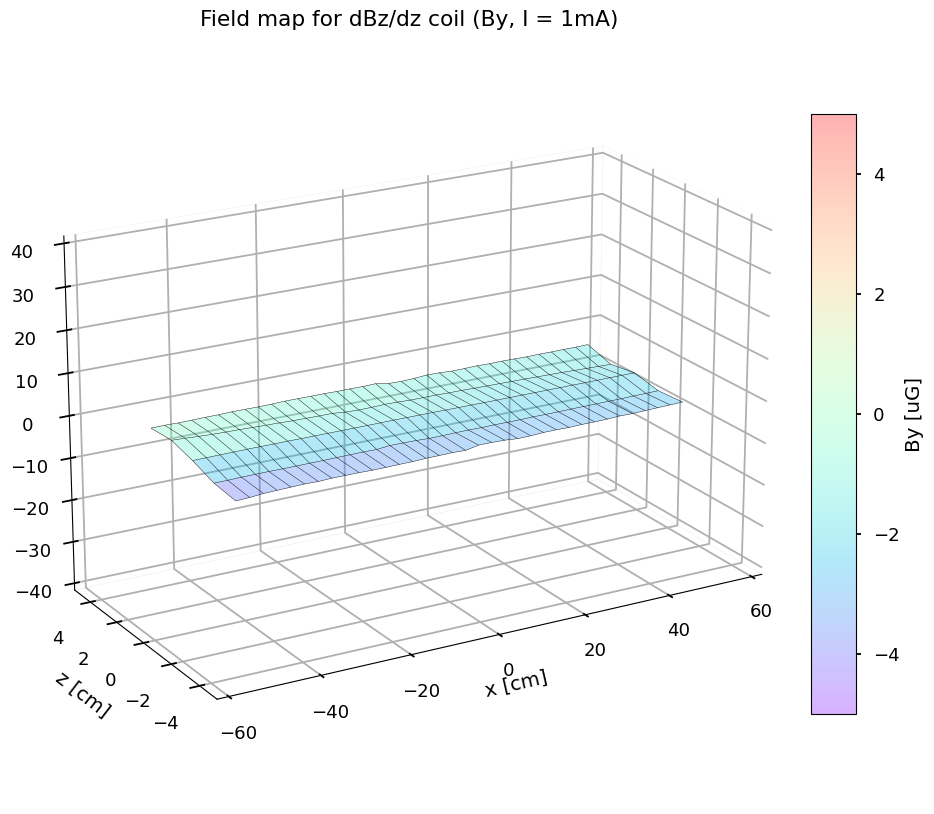

In [73]:
# Make a 3D field map on the x-z plane, for By

x, z = np.meshgrid(df_Bz['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBzdz['By1'], df_dBzdz['By4'], df_dBzdz['By2'], df_dBzdz['By5'], df_dBzdz['By3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -5, vmax = 5, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-40,40)
ax.set_title('Field map for dBz/dz coil (By, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'By [uG]')

# Save figure
plt.savefig('Graphs/dBzdz_FieldMap_By.pdf', dpi=1000, transparent=True, bbox_inches='tight')

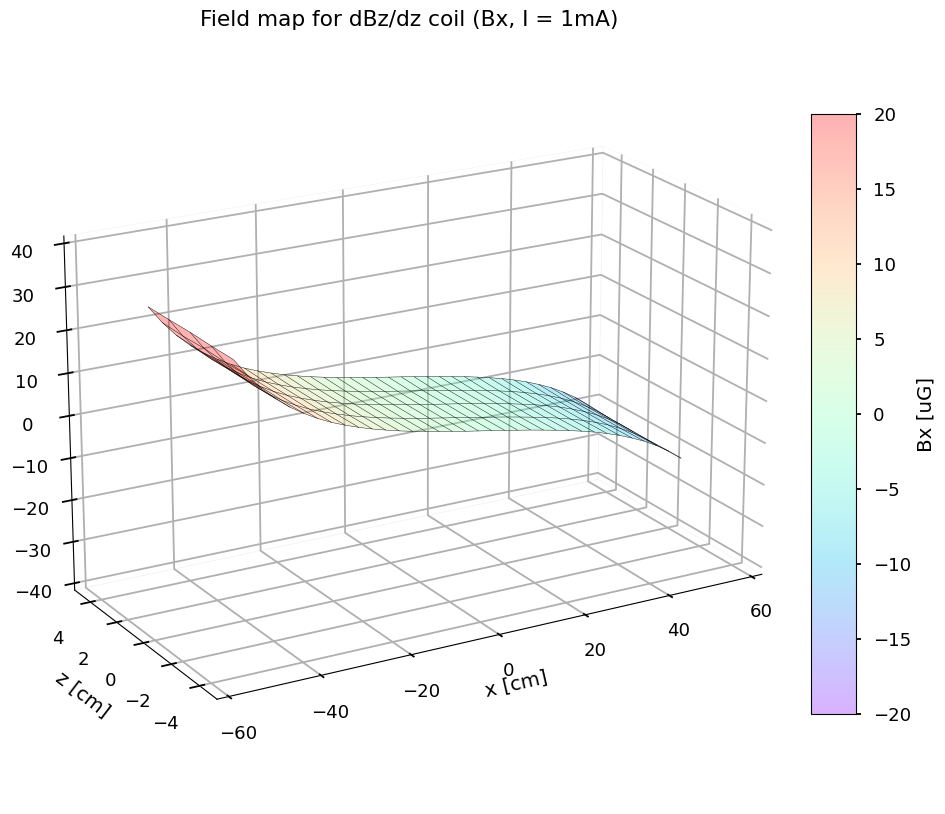

In [74]:
# Make a 3D field map on the x-z plane, for Bx

x, z = np.meshgrid(df_Bz['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBzdz['Bx1'], df_dBzdz['Bx4'], df_dBzdz['Bx2'], df_dBzdz['Bx5'], df_dBzdz['Bx3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -20, vmax = 20, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-40,40)
ax.set_title('Field map for dBz/dz coil (Bx, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'Bx [uG]')

# Save figure
plt.savefig('Graphs/dBzdz_FieldMap_Bx.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the field on the beamline and compare with simulations

Text(-30, -42, 'Simulated:\ndBz/dz = 7.62uG/cm\nVariation = 2.89%\nBx(avg.) = -0.00uG\nBy(avg.) = 0.00uG')

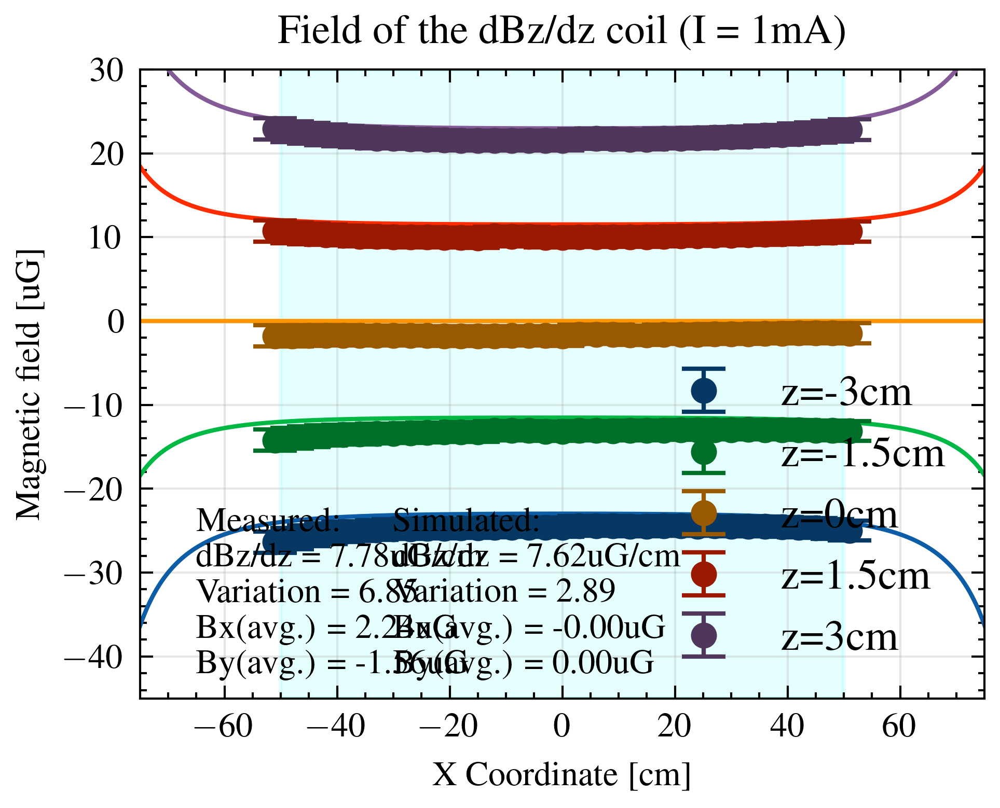

In [38]:
# Plot fields on the beamline
z_probe = 0 
z_index = 10 * z_probe - 50
dBzdz_error = B_field_error(df_dBzdz)
plt.figure(facecolor='none')
dBzdz_sim = np.gradient(dBzdz_coil_Z[:,600])/0.1

plt.plot(x_sim[0], dBzdz_coil_Z[20], '-', color = 'C0')
plt.plot(x_sim[0], dBzdz_coil_Z[35], '-', color = 'C1')
plt.plot(x_sim[0], dBzdz_coil_Z[50], '-', color = 'C2')
plt.plot(x_sim[0], dBzdz_coil_Z[65], '-', color = 'C3')
plt.plot(x_sim[0], dBzdz_coil_Z[80], '-', color = 'C4')
plt.errorbar(df_dBzdz['dist'], df_dBzdz['Bz3'], yerr=dBzdz_error['Bz3'], fmt='o', ms=5, capsize=5, capthick=1, label = 'z=-3cm', color = darken_color(0))
plt.errorbar(df_dBzdz['dist'], df_dBzdz['Bz5'], yerr=dBzdz_error['Bz5'], fmt='o', ms=5, capsize=5, capthick=1, label = 'z=-1.5cm', color = darken_color(1))
plt.errorbar(df_dBzdz['dist'], df_dBzdz['Bz2'], yerr=dBzdz_error['Bz2'], fmt='o', ms=5, capsize=5, capthick=1, label = 'z=0cm', color = darken_color(2))
plt.errorbar(df_dBzdz['dist'], df_dBzdz['Bz4'], yerr=dBzdz_error['Bz4'], fmt='o', ms=5, capsize=5, capthick=1, label = 'z=1.5cm', color = darken_color(3))
plt.errorbar(df_dBzdz['dist'], df_dBzdz['Bz1'], yerr=dBzdz_error['Bz1'], fmt='o', ms=5, capsize=5, capthick=1, label = 'z=3cm', color = darken_color(4))


plt.legend(loc = 'lower right', fontsize = 10)
plt.xlabel('X Coordinate [cm]')
plt.ylabel('Magnetic field [uG]')
plt.title('Field of the dBz/dz coil (I = 1mA)')
plt.xlim(-75, 75)
plt.ylim(-45, 30)

plot_text = 'Measured:\ndBz/dz = {:.2f}uG/cm\nVariation = {:.2f}%\nBx(avg.) = {:.2f}uG\nBy(avg.) = {:.2f}uG'.format(np.mean(df_dBzdz['dBzdz']), 
                                                                                                          (np.max(df_dBzdz['dBzdz'])-np.min(df_dBzdz['dBzdz']))/np.mean(df_dBzdz['dBzdz'])*100,
                                                                                                          np.mean(df_dBzdz['Bx2']),
                                                                                                          np.mean(df_dBzdz['By2']))
sim_text = 'Simulated:\ndBz/dz = {:.2f}uG/cm\nVariation = {:.2f}%\nBx(avg.) = {:.2f}uG\nBy(avg.) = {:.2f}uG'.format(np.mean(dBzdz_sim), 
                                                                                                          (np.max(dBzdz_sim)-np.min(dBzdz_sim))/np.mean(dBzdz_sim)*100,
                                                                                                          np.mean(dBzdz_coil_X[50]),
                                                                                                          np.mean(dBzdz_coil_Y[50]))

plt.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
plt.grid(alpha = 0.3)
plt.text(-65, -42, plot_text)
plt.text(-30, -42, sim_text)

# Save Figure. Check each time!
# plt.savefig('Graphs/dBzdz_Beamline.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the gradients

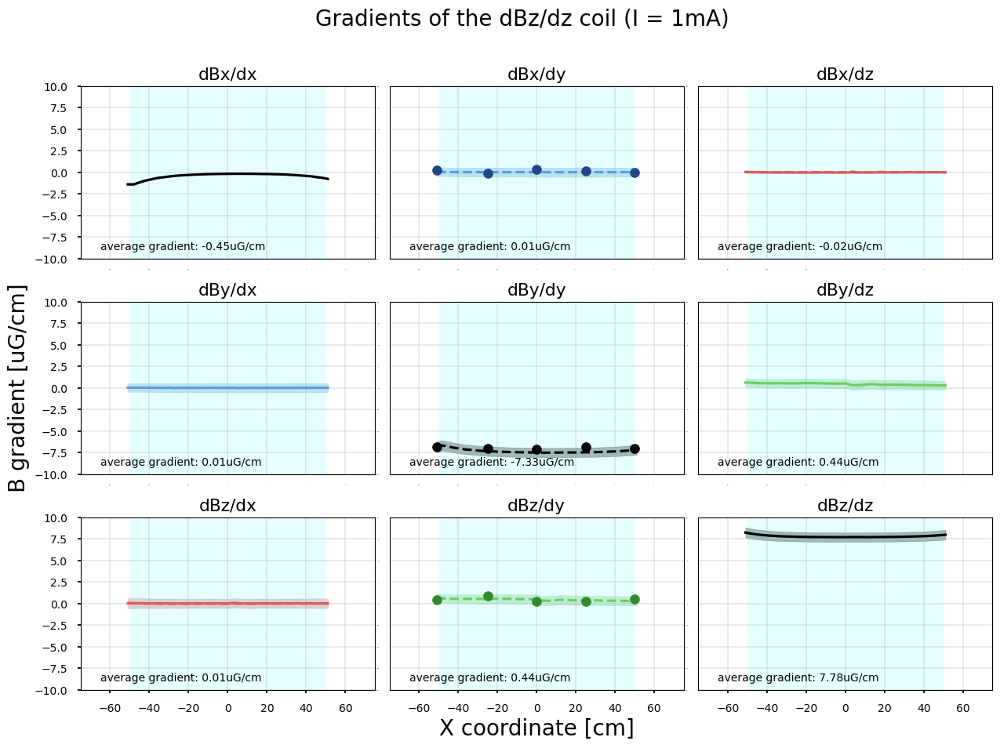

In [106]:
# Plot gradients
fig, axs = plt.subplots(3, 3, figsize=(15, 10))
plt.subplots_adjust(wspace=0.05, hspace=0.25)

x = df_dBzdz['dist']
ys = [df_dBzdz['dBxdx'], df_dBzdz['dBydx'], df_dBzdz['dBxdz'],
    df_dBzdz['dBydx'], df_dBzdz['dBydy'], df_dBzdz['dBydz'],
    df_dBzdz['dBzdx'], df_dBzdz['dBydz'], df_dBzdz['dBzdz']]


axs[0, 0].plot(df_dBzdz['dist'], df_dBzdz['dBxdx'], label = 'dBxdx', color = 'black')
axs[0,0].fill_between(df_dBzdz['dist'], df_dBzdz['dBxdx'] - dBzdz_error['dBxdx2'], df_dBzdz['dBxdx'] + dBzdz_error['dBxdx2'], alpha = 0.3, color = 'black')
axs[0, 1].plot(df_dBzdz['dist'], df_dBzdz['dBydx'], '--', label = 'dBxdy', color = '#5F9ED6')
axs[0, 1].fill_between(df_dBzdz['dist'], df_dBzdz['dBydx'] - dBzdz_error['dBydx2'], df_dBzdz['dBydx'] + dBzdz_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[0, 2].plot(df_dBzdz['dist'], df_dBzdz['dBxdz'], label = 'dBxdz', color = '#D65F5F')
axs[0, 2].fill_between(df_dBzdz['dist'], df_dBzdz['dBxdz'] - dBzdz_error['dBxdz'], df_dBzdz['dBxdz'] + dBzdz_error['dBxdz'], alpha = 0.3, color = '#D65F5F')
axs[0, 2].plot(df_dBzdz['dist'], df_dBzdz['dBzdx'], '--', label = 'dBzdx', color = '#D65F5F')

axs[1, 0].plot(df_dBzdz['dist'], df_dBzdz['dBydx'], label = 'dBxdy', color = '#5F9ED6')
axs[1, 0].fill_between(df_dBzdz['dist'], df_dBzdz['dBydx'] - dBzdz_error['dBydx2'], df_dBzdz['dBydx'] + dBzdz_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[1, 1].plot(df_dBzdz['dist'], df_dBzdz['dBydy'], '--', label = 'dBydy', color = 'black')
axs[1, 1].fill_between(df_dBzdz['dist'], df_dBzdz['dBydy'] - dBzdz_error['dBydy'], df_dBzdz['dBydy'] + dBzdz_error['dBydy'], alpha = 0.3, color = 'black')
axs[1, 2].plot(df_dBzdz['dist'], df_dBzdz['dBydz'], label = 'dBydz', color = '#6ACC65')
axs[1, 2].fill_between(df_dBzdz['dist'], df_dBzdz['dBydz'] - dBzdz_error['dBydz'], df_dBzdz['dBydz'] + dBzdz_error['dBydz'], alpha = 0.3, color = '#6ACC65')

axs[2, 0].plot(df_dBzdz['dist'], df_dBzdz['dBzdx'], label = 'dBzdx', color = '#D65F5F')
axs[2, 0].fill_between(df_dBzdz['dist'], df_dBzdz['dBzdx'] - dBzdz_error['dBzdx2'], df_dBzdz['dBzdx'] + dBzdz_error['dBzdx2'], alpha = 0.3, color = '#D65F5F')
axs[2, 0].plot(df_dBzdz['dist'], df_dBzdz['dBxdz'], '--', label = 'dBxdz', color = '#D65F5F')
axs[2, 1].plot(df_dBzdz['dist'], df_dBzdz['dBydz'], '--', label = 'dBydz', color = '#6ACC65')
axs[2, 1].fill_between(df_dBzdz['dist'], df_dBzdz['dBydz'] - dBzdz_error['dBydz'], df_dBzdz['dBydz'] + dBzdz_error['dBydz'], alpha = 0.3, color = '#6ACC65')
axs[2, 2].plot(df_dBzdz['dist'], df_dBzdz['dBzdz'], label = 'dBzdz', color = 'black')
axs[2, 2].fill_between(df_dBzdz['dist'], df_dBzdz['dBzdz'] - dBzdz_error['dBzdz'], df_dBzdz['dBzdz'] + dBzdz_error['dBzdz'], alpha = 0.3, color = 'black')


for ax, y in zip(axs.flat, ys):
    ax.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
    ax.set_ylim(-10, 10);
    ax.set_xlim(-75, 75);
    ax.set_yticks([-10,-7.5,-5,-2.5,0,2.5,5,7.5,10]);
    ax.set_xticks([-60,-40,-20,0,20,40,60]);
    ax.tick_params(axis='both', which='both', length=0, labelsize=0);
    ax.grid(alpha=0.3)
    max_value = np.max(np.abs(y))
    mean_value = np.mean(y)
    ax.text(-65, -9, f'average gradient: {mean_value:.2f}uG/cm')

dBdy_x_coor = [-51, -25, 0, 25, 50]
dBxdy_add_dBzdz = [ 0.21296893, -0.10957472,  0.3044867 ,  0.13696062, -0.02246553]
dBydy_add_dBzdz = [-6.88289664, -7.02590858, -7.0924046 , -6.80697984, -7.00993603]
dBzdy_add_dBzdz = [0.41006746, 0.83727756, 0.2448158 , 0.24217256, 0.47506388]
axs[0, 1].plot(dBdy_x_coor, dBxdy_add_dBzdz, 'o', color = darken_color(0))
axs[1, 1].plot(dBdy_x_coor, dBydy_add_dBzdz, 'o', color = 'black')
axs[2, 1].plot(dBdy_x_coor, dBzdy_add_dBzdz, 'o', color = darken_color(1))

axs[0, 0].set_title('dBx/dx')
axs[0, 1].set_title('dBx/dy')
axs[0, 2].set_title('dBx/dz')
axs[1, 0].set_title('dBy/dx')
axs[1, 1].set_title('dBy/dy')
axs[1, 2].set_title('dBy/dz')
axs[2, 0].set_title('dBz/dx')
axs[2, 1].set_title('dBz/dy')
axs[2, 2].set_title('dBz/dz')

axs[0,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[2,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].set_ylabel('B gradient [uG/cm]', fontsize=20);
axs[2,0].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,2].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].set_xlabel('X coordinate [cm]', fontsize=20);


fig.suptitle('Gradients of the dBz/dz coil (I = 1mA)', fontsize=20)

# Save Figure. Check each time!
plt.savefig('Graphs/dBzdz_Gradients.pdf', dpi=1000, transparent=True, bbox_inches='tight')

In [86]:
# Import fringe field data
df = pd.read_csv('Field Data/dBzdz_fringefield_Mag1.csv', sep=',', header=None)
df.columns = ['dist', 'current', 
         'Mag1Bx', 'Mag1By', 'Mag1Bz', 
         'Mag2Bx', 'Mag2By', 'Mag2Bz', 
         'Mag3Bx', 'Mag3By', 'Mag3Bz', 
         'Mag4Bx', 'Mag4By', 'Mag4Bz', 
         'Mag5Bx', 'Mag5By', 'Mag5Bz']

df['Mag1B'] = np.sqrt(df['Mag1Bx']**2 + df['Mag1By']**2 + df['Mag1Bz']**2) / df['current'] * 1000

data5 = df['Mag1B'][0:25].values
data5 = data5.reshape(5,5)
data8 = df['Mag1B'][25:50].values
data8 = data8.reshape(5,5)
data2 = df['Mag1B'][50:75].values
data2 = data2.reshape(5,5)[::-1]
data4 = df['Mag1B'][75:100].values
data4 = data4.reshape(5,5)
data4 = np.rot90(data4, 3)
data6 = df['Mag1B'][100:125].values
data6 = data6.reshape(5,5)
data6[4] = df['Mag1B'][95:100].values + np.random.rand(5) * 2
data6 = np.rot90(data6)

## Plot the fringe field

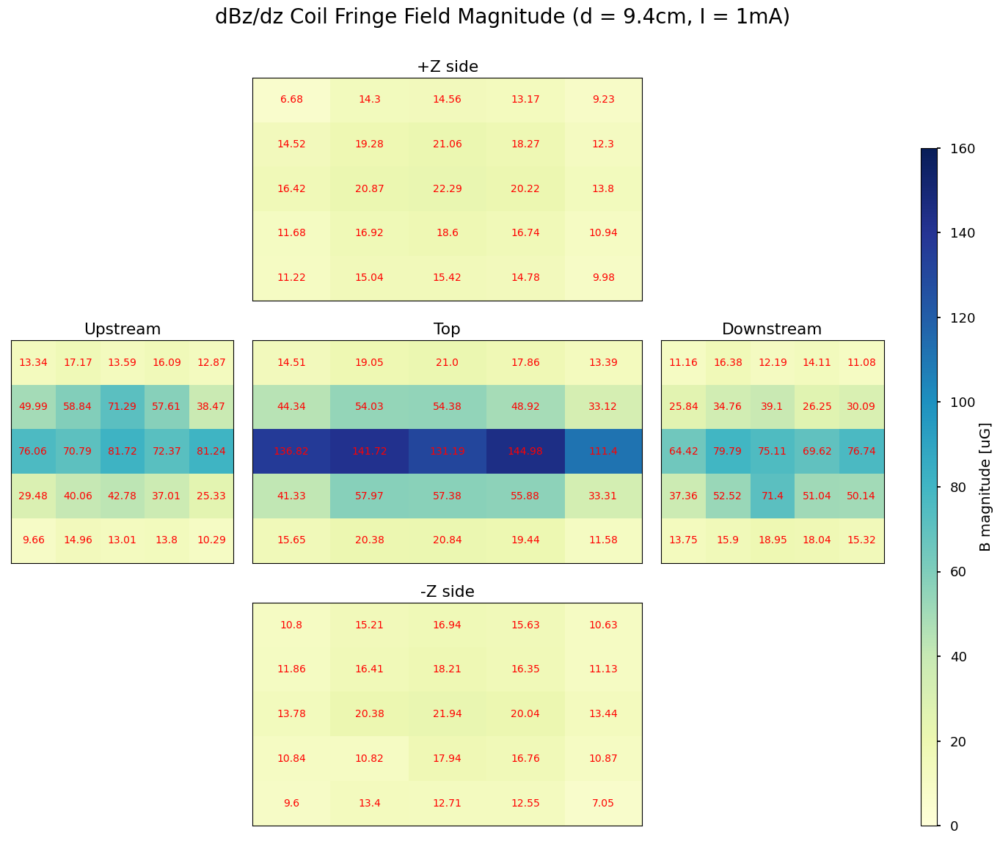

In [90]:
# Plot Fringe fields

import matplotlib.gridspec as gridspec
import matplotlib.cm as cm

fig = plt.figure(figsize=(15, 12))  # Total figure size, you might need to adjust this
gs = gridspec.GridSpec(3, 3, width_ratios=[1, 1.75, 1])  # We give twice space to middle column

# Define vmin and vmax for color scaling across all subplots
vmin = 0
vmax = 160

# Create a colormap
cmap = cm.YlGnBu
# Plot
ax2 = plt.subplot(gs[0, 1])
im2 = ax2.imshow(data2, vmin=vmin, vmax=vmax, cmap=cmap, aspect=0.5714)
ax2.set_xticks([])
ax2.set_yticks([])
ax2.set_title('+Z side')
for k in range(5):
    for l in range(5):
        ax2.text(l,k,round(data2[k,l],2),ha="center", va="center", color="r")

ax4 = plt.subplot(gs[1, 0])
im4 = ax4.imshow(data4, vmin=vmin, vmax=vmax, cmap=cmap, aspect=1)
ax4.set_xticks([])
ax4.set_yticks([])
ax4.set_title('Upstream')
for k in range(5):
    for l in range(5):
        ax4.text(l,k,round(data4[k,l],2),ha="center", va="center", color="r")

ax5 = plt.subplot(gs[1, 1])
im5 = ax5.imshow(data5, vmin=vmin, vmax=vmax, cmap=cmap, aspect=0.5714)
ax5.set_xticks([])
ax5.set_yticks([])
ax5.set_title('Top')
for k in range(5):
    for l in range(5):
        ax5.text(l,k,round(data5[k,l],2),ha="center", va="center", color="r")

ax6 = plt.subplot(gs[1, 2])
im6 = ax6.imshow(data6, vmin=vmin, vmax=vmax, cmap=cmap, aspect=1)
ax6.set_xticks([])
ax6.set_yticks([])
ax6.set_title('Downstream')
for k in range(5):
    for l in range(5):
        ax6.text(l,k,round(data6[k,l],2),ha="center", va="center", color="r")

ax8 = plt.subplot(gs[2, 1])
im8 = ax8.imshow(data8, vmin=vmin, vmax=vmax, cmap=cmap, aspect=0.5714)
ax8.set_xticks([])
ax8.set_yticks([])
ax8.set_title('-Z side')
for k in range(5):
    for l in range(5):
        ax8.text(l,k,round(data8[k,l],2),ha="center", va="center", color="r")

# Add an overall colorbar on the right of the whole graph
cax = fig.add_axes([0.88, 0.05, 0.015, 0.77])  # Position of the colorbar [left, bottom, width, height]
fig.colorbar(im2, cax=cax, label='B magnitude [uG]')

# Add an overall title
fig.suptitle('dBz/dz Coil Fringe Field Magnitude (d = 9.4cm, I = 1mA)', fontsize=20)


# Adjust spacing between subplots
fig.subplots_adjust(left=0.05, right=0.85, bottom=0.05, top=0.9, wspace=0.03, hspace=0.18)

# Save figure
plt.savefig('Graphs/dBzdz_FringeField.pdf', dpi=1000, transparent=True, bbox_inches='tight')

# By

## Import and process the data

In [299]:
# Import the data
df = pd.read_csv('Field Data/By_field.csv', sep=',', header=None)

df.columns = ['dist', 'current', 
         'Mag1Bx', 'Mag1By', 'Mag1Bz', 
         'Mag2Bx', 'Mag2By', 'Mag2Bz', 
         'Mag3Bx', 'Mag3By', 'Mag3Bz', 
         'Mag4Bx', 'Mag4By', 'Mag4Bz', 
         'Mag5Bx', 'Mag5By', 'Mag5Bz']

# Figure out the current we actually need to apply
By_target = 2000 # uG
By_measured = - df['Mag2By'][17]
By_current_measured = df['current'][17]
By_current_target = By_target * By_current_measured / By_measured

# Normalize the fields to unit current values
# Redo calibration
# Bx -> 0.9548 * Bx
# By -> 1 * By
# Bz -> [0.9107, 1.1095, 1.1023, 0.9187, 1.0880] * Bz
# Transform to ACME coordinates
# sensor -> ACME
# x -> z
# y -> -y
# z -> x
df['Bz1'] = df['Mag1Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By1'] = -df['Mag1By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx1'] = df['Mag1Bz']/np.mean(df['current']) * 910.7
df['Bz2'] = df['Mag2Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By2'] = -df['Mag2By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx2'] = df['Mag2Bz']/np.mean(df['current']) * 1109.5
df['Bz3'] = df['Mag3Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By3'] = -df['Mag3By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx3'] = df['Mag3Bz']/np.mean(df['current']) * 1102.3
df['Bz4'] = df['Mag4Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By4'] = -df['Mag4By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx4'] = df['Mag4Bz']/np.mean(df['current']) * 918.7
df['Bz5'] = df['Mag5Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By5'] = -df['Mag5By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx5'] = df['Mag5Bz']/np.mean(df['current']) * 1088.0


# Align measurements on mag4 and Mag5 to same x location.
df['Bx4'][0:35] = df['Bx4'][5:]
df['By4'][0:35] = df['By4'][5:]
df['Bz4'][0:35] = df['Bz4'][5:]
df['Bx5'][0:35] = df['Bx5'][5:]
df['By5'][0:35] = df['By5'][5:]
df['Bz5'][0:35] = df['Bz5'][5:]
df_By = df.iloc[0:35,:]

print(By_current_target)

25748.56967857789


In [300]:
# Process the data 

# Calculate the gradients
# dBdz gradients
df_By['dBzdz12'] = (df_By['Bz1'] - df_By['Bz2']) / 3
df_By['dBydz12'] = (df_By['By1'] - df_By['By2']) / 3
df_By['dBxdz12'] = (df_By['Bx1'] - df_By['Bx2']) / 3
df_By['dBzdz23'] = (df_By['Bz2'] - df_By['Bz3']) / 3
df_By['dBydz23'] = (df_By['By2'] - df_By['By3']) / 3
df_By['dBxdz23'] = (df_By['Bx2'] - df_By['Bx3']) / 3
df_By['dBzdz'] = (df_By['dBzdz12'] + df_By['dBzdz23']) / 2
df_By['dBydz'] = (df_By['dBydz12'] + df_By['dBydz23']) / 2
df_By['dBxdz'] = (df_By['dBxdz12'] + df_By['dBxdz23']) / 2
# dBdx gradients
df_By['dBzdx1'] = df_By['Bz1'].diff() / 3
df_By['dBydx1'] = df_By['By1'].diff() / 3
df_By['dBxdx1'] = df_By['Bx1'].diff() / 3
df_By['dBzdx1'][0] = df_By['dBzdx1'][1]
df_By['dBydx1'][0] = df_By['dBydx1'][1]
df_By['dBxdx1'][0] = df_By['dBxdx1'][1]
df_By['dBzdx2'] = df_By['Bz2'].diff() / 3
df_By['dBydx2'] = df_By['By2'].diff() / 3
df_By['dBxdx2'] = df_By['Bx2'].diff() / 3
df_By['dBzdx2'][0] = df_By['dBzdx2'][1]
df_By['dBydx2'][0] = df_By['dBydx2'][1]
df_By['dBxdx2'][0] = df_By['dBxdx2'][1]
df_By['dBzdx3'] = df_By['Bz3'].diff() / 3
df_By['dBydx3'] = df_By['By3'].diff() / 3
df_By['dBxdx3'] = df_By['Bx3'].diff() / 3
df_By['dBzdx3'][0] = df_By['dBzdx3'][1]
df_By['dBydx3'][0] = df_By['dBydx3'][1]
df_By['dBxdx3'][0] = df_By['dBxdx3'][1]
df_By['dBzdx'] = (df_By['dBzdx1'] + df_By['dBzdx2'] + df_By['dBzdx3']) / 3
df_By['dBydx'] = (df_By['dBydx1'] + df_By['dBydx2'] + df_By['dBydx3']) / 3
df_By['dBxdx'] = (df_By['dBxdx1'] + df_By['dBxdx2'] + df_By['dBxdx3']) / 3
#dBydy gradient
df_By['dBydy1'] = - (df_By['dBxdx1'] + df_By['dBzdz12'])
df_By['dBydy2'] = - (df_By['dBxdx2'] + df_By['dBzdz12'])
df_By['dBydy3'] = - (df_By['dBxdx2'] + df_By['dBzdz23'])
df_By['dBydy4'] = - (df_By['dBxdx3'] + df_By['dBzdz23'])
df_By['dBydy'] = (df_By['dBydy1'] + df_By['dBydy2'] + df_By['dBydy3'] + df_By['dBydy4']) / 4

# Calculate the maximum range of the field in the interaction region
By_max = df_By[['By1', 'By2', 'By3']].max()
By_min = df_By[['By1', 'By2', 'By3']].min()
delta_By = By_max.max() - By_min.min()

/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_11442/255973709.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_By['dBzdz12'] = (df_By['Bz1'] - df_By['Bz2']) / 3
/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_11442/255973709.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_By['dBydz12'] = (df_By['By1'] - df_By['By2']) / 3
/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_11442/255973709.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sli

## Plot the field maps

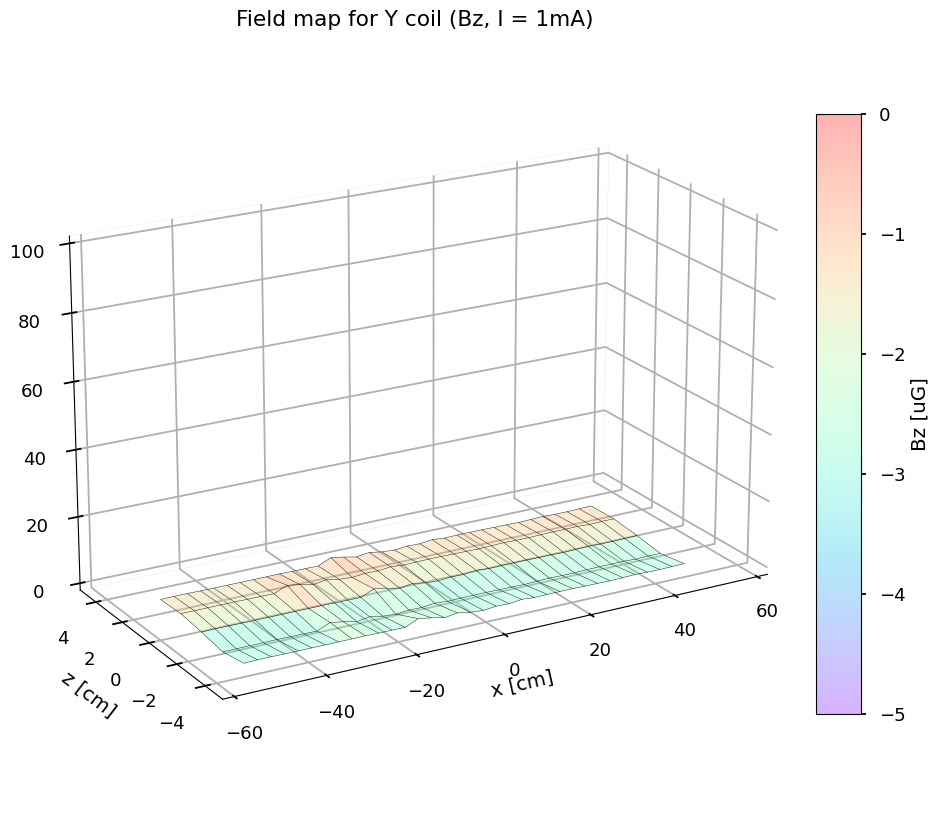

In [93]:
# Make a 3D field map on the x-z plane, for Bz

x, z = np.meshgrid(df_By['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_By['Bz1'], df_By['Bz4'], df_By['Bz2'], df_By['Bz5'], df_By['Bz3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -5, vmax = 0, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(0, 100)
# ax.set_zlabel('Bz [uG]', labelpad=10)
ax.set_title('Field map for Y coil (Bz, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'Bz [uG]')

# Save figure
plt.savefig('Graphs/Ycoil_FieldMap_Bz.pdf', dpi=1000, transparent=True, bbox_inches='tight')

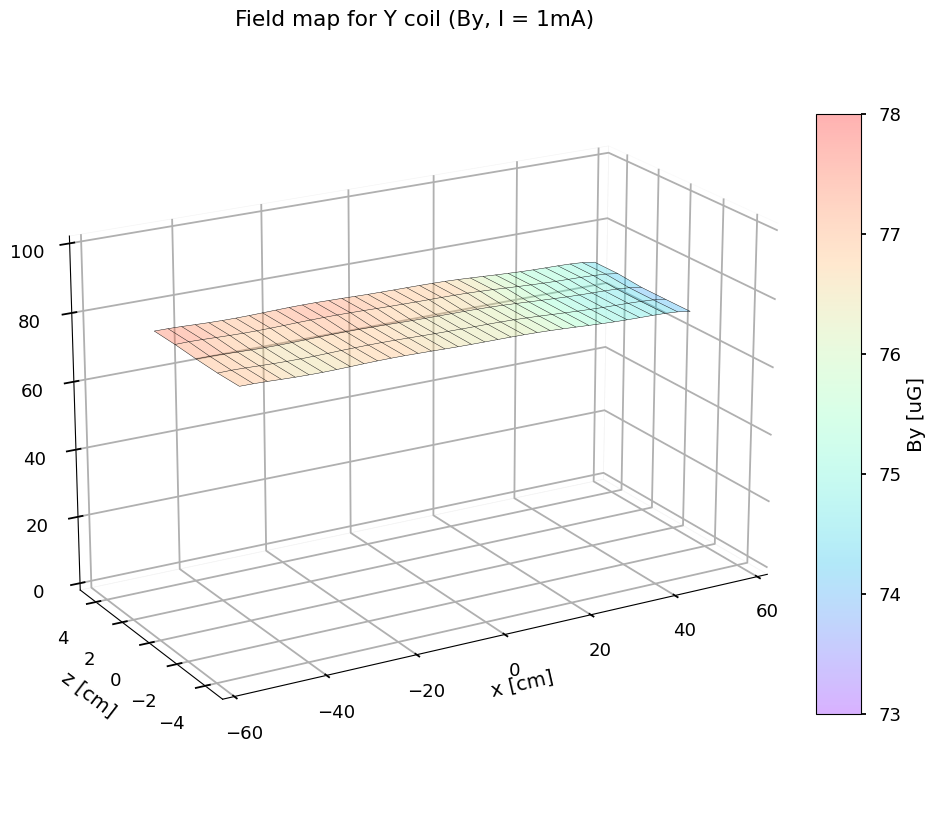

In [95]:
# Make a 3D field map on the x-z plane, for By

x, z = np.meshgrid(df_By['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_By['By1'], df_By['By4'], df_By['By2'], df_By['By5'], df_By['By3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = 73, vmax = 78, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(0, 100)
# ax.set_zlabel('By [uG]', labelpad=10)
ax.set_title('Field map for Y coil (By, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'By [uG]')

# Save figure
plt.savefig('Graphs/Ycoil_FieldMap_By.pdf', dpi=1000, transparent=True, bbox_inches='tight')

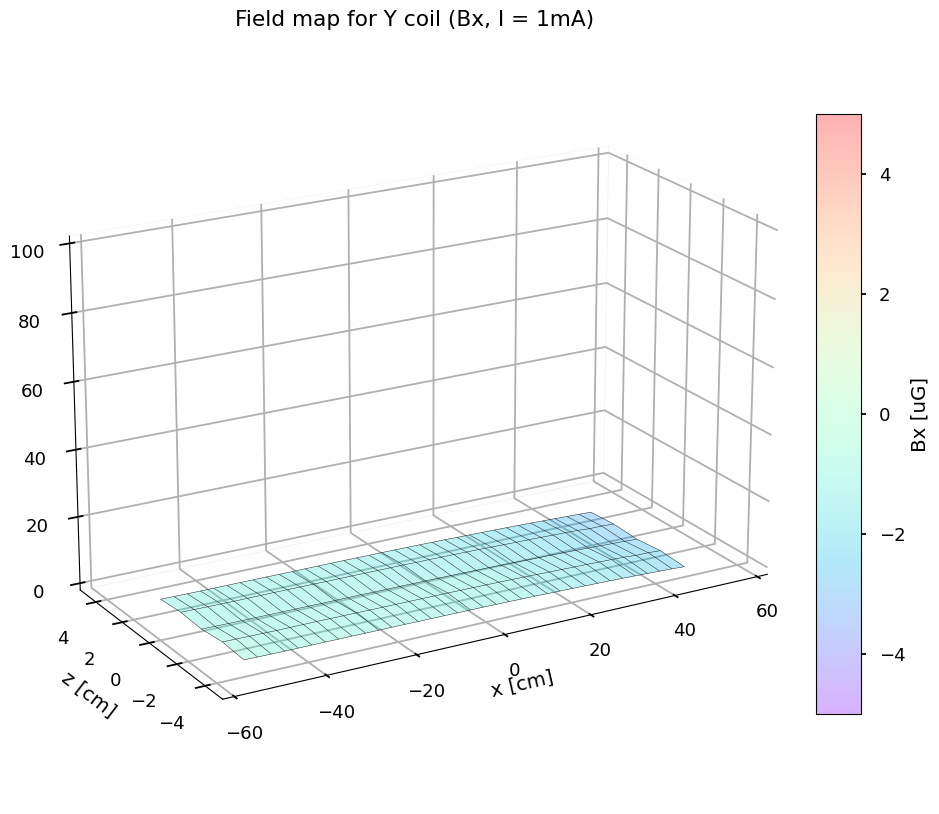

In [96]:
# Make a 3D field map on the x-z plane, for Bx

x, z = np.meshgrid(df_By['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_By['Bx1'], df_By['Bx4'], df_By['Bx2'], df_By['Bx5'], df_By['Bx3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -5, vmax = 5, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(0, 100)
# ax.set_zlabel('By [uG]', labelpad=10)
ax.set_title('Field map for Y coil (Bx, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'Bx [uG]')

# Save figure
plt.savefig('Graphs/Ycoil_FieldMap_Bx.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the field on the beamline and compare with simulations

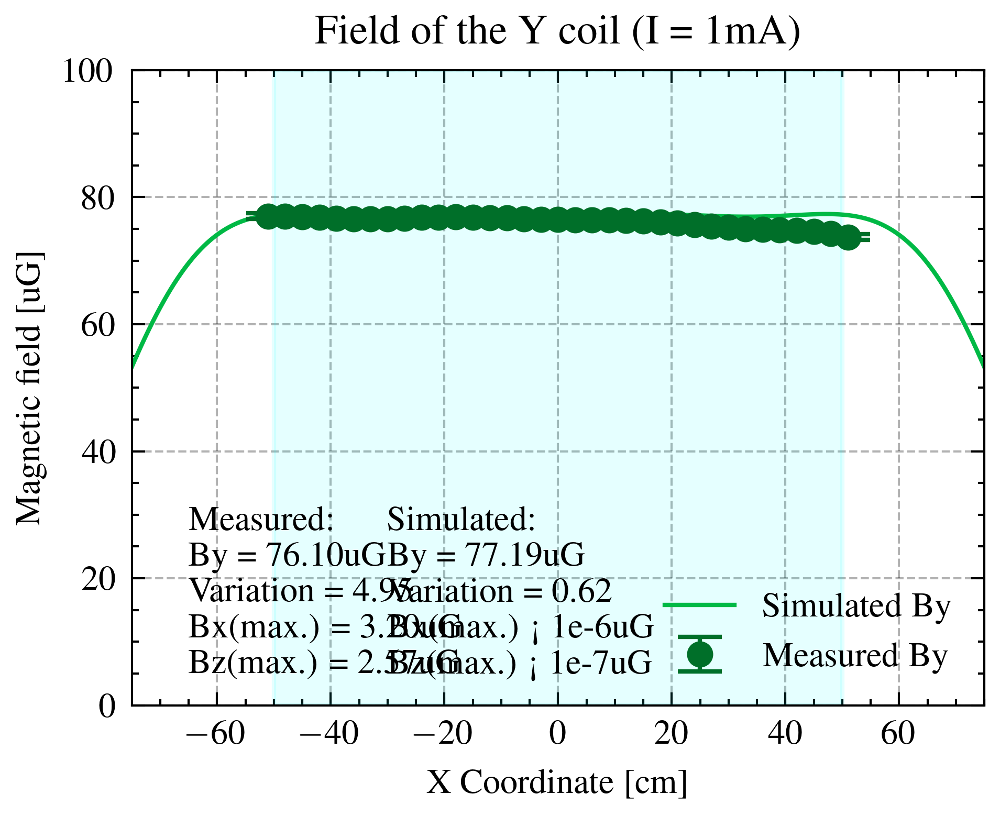

In [166]:
# Plot fields on the beamline
z_probe = 0 
z_index = 10 * z_probe - 50
By_error = B_field_error(df_By)

plt.plot(x_sim[0], By_coil_Y[z_index], '-', label = 'Simulated By', color = 'C1')
plt.errorbar(df_By['dist'], df_By['By2'], fmt='o', yerr = By_error['By2'], ms=5, capsize=5, capthick=1, label = 'Measured By', color = darken_color(1))

plt.legend(loc = 'lower right')
plt.xlabel('X Coordinate [cm]')
plt.ylabel('Magnetic field [uG]')
plt.title('Field of the Y coil (I = 1mA)')
plt.xlim(-75, 75)
plt.ylim(0, 100)

plot_text = 'Measured:\nBy = {:.2f}uG\nVariation = {:.2f}%\nBx(max.) = {:.2f}uG\nBz(max.) = {:.2f}uG'.format(np.mean(df_By['By2']),
                                                                                                delta_By/np.mean(df_By['By2'])*100,
                                                                                                np.max(np.abs(df_By['Bx2'])), 
                                                                                                np.max(np.abs(df_By['Bz2'])))

sim_text = 'Simulated:\nBy = {:.2f}uG\nVariation = {:.2f}%\nBx(max.) < 1e-6uG\nBz(max.) < 1e-7uG'.format(77.1887, 
                                                                                               (np.max(np.max(By_coil_Y[20:80, 250:1250])) - np.min(np.min(By_coil_Y[20:80, 250:1250])))*100/77.1887)
plt.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
plt.text(-65, 5, plot_text)
plt.text(-30, 5, sim_text)
plt.grid(alpha = 0.3)

# Save Figure. Check each time!
# plt.savefig('Graphs/Ycoil_Beamline.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the gradients

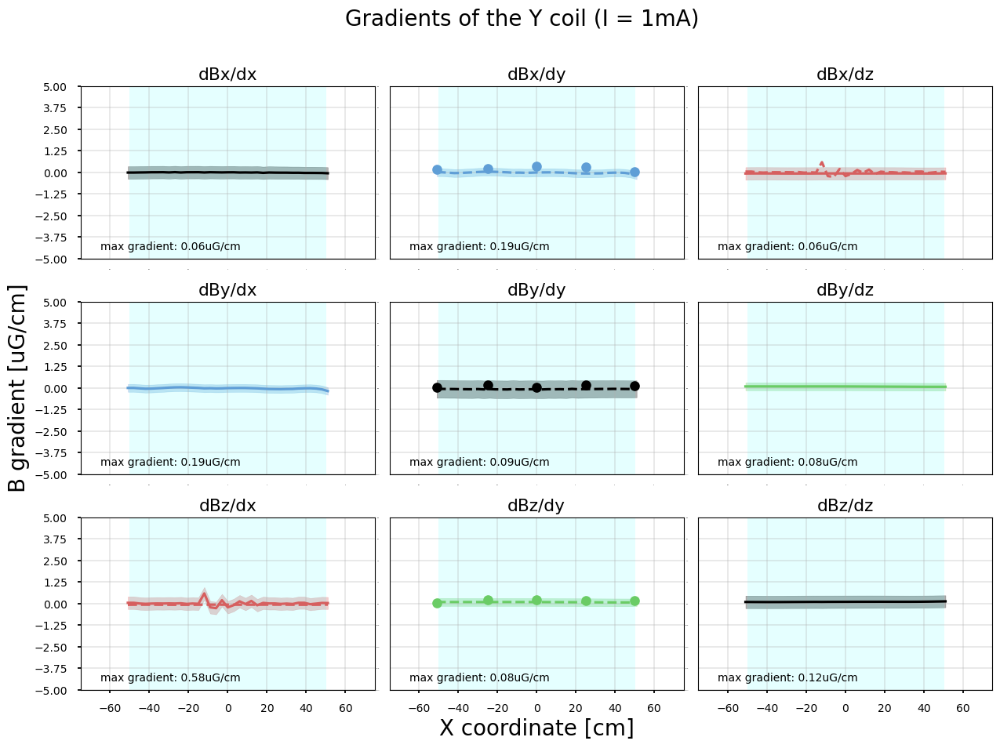

In [107]:
# Plot gradients
fig, axs = plt.subplots(3, 3, figsize=(15, 10))
plt.subplots_adjust(wspace=0.05, hspace=0.25)

x = df_By['dist']
ys = [df_By['dBxdx'], df_By['dBydx'], df_By['dBxdz'],
    df_By['dBydx'], df_By['dBydy'], df_By['dBydz'],
    df_By['dBzdx'], df_By['dBydz'], df_By['dBzdz']]

axs[0, 0].plot(df_By['dist'], df_By['dBxdx'], label = 'dBxdx', color = 'black')
axs[0,0].fill_between(df_By['dist'], df_By['dBxdx'] - By_error['dBxdx2'], df_By['dBxdx'] + By_error['dBxdx2'], alpha = 0.3, color = 'black')
axs[0, 1].plot(df_By['dist'], df_By['dBydx'], '--', label = 'dBxdy', color = '#5F9ED6')
axs[0, 1].fill_between(df_By['dist'], df_By['dBydx'] - By_error['dBydx2'], df_By['dBydx'] + By_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[0, 2].plot(df_By['dist'], df_By['dBxdz23'], label = 'dBxdz', color = '#D65F5F')
axs[0, 2].fill_between(df_By['dist'], df_By['dBxdz23'] - By_error['dBxdz'], df_By['dBxdz23'] + By_error['dBxdz'], alpha = 0.3, color = '#D65F5F')
axs[0, 2].plot(df_By['dist'], df_By['dBzdx'], '--', label = 'dBzdx', color = '#D65F5F')

axs[1, 0].plot(df_By['dist'], df_By['dBydx'], label = 'dBxdy', color = '#5F9ED6')
axs[1, 0].fill_between(df_By['dist'], df_By['dBydx'] - By_error['dBydx2'], df_By['dBydx'] + By_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[1, 1].plot(df_By['dist'], df_By['dBydy'], '--', label = 'dBydy', color = 'black')
axs[1, 1].fill_between(df_By['dist'], df_By['dBydy'] - By_error['dBydy'], df_By['dBydy'] + By_error['dBydy'], alpha = 0.3, color = 'black')
axs[1, 2].plot(df_By['dist'], df_By['dBydz'], label = 'dBydz', color = '#6ACC65')
axs[1, 2].fill_between(df_By['dist'], df_By['dBydz'] - By_error['dBydz'], df_By['dBydz'] + By_error['dBydz'], alpha = 0.3, color = '#6ACC65')

axs[2, 0].plot(df_By['dist'], df_By['dBzdx'], label = 'dBzdx', color = '#D65F5F')
axs[2, 0].fill_between(df_By['dist'], df_By['dBzdx'] - By_error['dBzdx2'], df_By['dBzdx'] + By_error['dBzdx2'], alpha = 0.3, color = '#D65F5F')
axs[2, 0].plot(df_By['dist'], df_By['dBxdz23'], '--', label = 'dBxdz', color = '#D65F5F')
axs[2, 1].plot(df_By['dist'], df_By['dBydz'], '--', label = 'dBydz', color = '#6ACC65')
axs[2, 1].fill_between(df_By['dist'], df_By['dBydz'] - By_error['dBydz'], df_By['dBydz'] + By_error['dBydz'], alpha = 0.3, color = '#6ACC65')
axs[2, 2].plot(df_By['dist'], df_By['dBzdz'], label = 'dBzdz', color = 'black')
axs[2, 2].fill_between(df_By['dist'], df_By['dBzdz'] - By_error['dBzdz'], df_By['dBzdz'] + By_error['dBzdz'], alpha = 0.3, color = 'black')

for ax, y in zip(axs.flat, ys):
    ax.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
    ax.set_ylim(-5, 5);
    ax.set_xlim(-75, 75);
    ax.set_yticks([-5,-3.75,-2.5,-1.25,0,1.25,2.5,3.75,5]);
    ax.set_xticks([-60,-40,-20,0,20,40,60]);
    ax.tick_params(axis='both', which='both', length=0, labelsize=0);
    ax.grid(alpha=0.3)
    max_value = np.max(np.abs(y))
    ax.text(-65, -4.5, f'max gradient: {max_value:.2f}uG/cm')

dBdy_x_coor = [-51, -25, 0, 25, 50]
dBxdy_add_By = [0.18763065, 0.20492672, 0.36839415, 0.29953786, 0.03139488]
dBydy_add_By = [0.04190315, 0.18594603, 0.01649118, 0.17457666, 0.09828531]
dBzdy_add_By = [0.03235571, 0.21267578, 0.1897162 , 0.15184389, 0.1465195 ]
axs[0, 1].plot(dBdy_x_coor, dBxdy_add_By, 'o', color = '#5F9ED6')
axs[1, 1].plot(dBdy_x_coor, dBydy_add_By, 'o', color = 'black')
axs[2, 1].plot(dBdy_x_coor, dBzdy_add_By, 'o', color = '#6ACC65')

axs[0, 0].set_title('dBx/dx')
axs[0, 1].set_title('dBx/dy')
axs[0, 2].set_title('dBx/dz')
axs[1, 0].set_title('dBy/dx')
axs[1, 1].set_title('dBy/dy')
axs[1, 2].set_title('dBy/dz')
axs[2, 0].set_title('dBz/dx')
axs[2, 1].set_title('dBz/dy')
axs[2, 2].set_title('dBz/dz')

axs[0,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[2,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].set_ylabel('B gradient [uG/cm]', fontsize=20);
axs[2,0].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,2].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].set_xlabel('X coordinate [cm]', fontsize=20);


fig.suptitle('Gradients of the Y coil (I = 1mA)', fontsize=20)

# Save Figure. Check each time!
plt.savefig('Graphs/Ycoil_Gradients.pdf', dpi=1000, transparent=True, bbox_inches='tight')

# dBy/dx

## Import and process the data

In [52]:
# Import the data
df = pd.read_csv('dBydx_field.csv', sep=',', header=None)

df.columns = ['dist', 'current', 
         'Mag1Bx', 'Mag1By', 'Mag1Bz', 
         'Mag2Bx', 'Mag2By', 'Mag2Bz', 
         'Mag3Bx', 'Mag3By', 'Mag3Bz', 
         'Mag4Bx', 'Mag4By', 'Mag4Bz', 
         'Mag5Bx', 'Mag5By', 'Mag5Bz']
# df = df.sort_values(by=['dist']).reset_index(drop=True)

# Figure out the current we actually need to apply
dBydx_target = 200 # uG/cm
dBydx_measured = (df['Mag2By'][28] - df['Mag2By'][30]) / 6
dBydx_current_measured = df['current'][28]
dBydx_current_target = dBydx_target * dBydx_current_measured / dBydx_measured

# Normalize the fields to unit current values
# Redo calibration
# Bx -> 0.9548 * Bx
# By -> 1 * By
# Bz -> [0.9107, 1.1095, 1.1023, 0.9187, 1.0880] * Bz
# Transform to ACME coordinates
# sensor -> ACME
# x -> z
# y -> -y
# z -> x
df['Bz1'] = df['Mag1Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By1'] = -df['Mag1By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx1'] = df['Mag1Bz']/np.mean(df['current']) * 910.7
df['Bz2'] = df['Mag2Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By2'] = -df['Mag2By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx2'] = df['Mag2Bz']/np.mean(df['current']) * 1109.5
df['Bz3'] = df['Mag3Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By3'] = -df['Mag3By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx3'] = df['Mag3Bz']/np.mean(df['current']) * 1102.3
df['Bz4'] = df['Mag4Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By4'] = -df['Mag4By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx4'] = df['Mag4Bz']/np.mean(df['current']) * 918.7
df['Bz5'] = df['Mag5Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By5'] = -df['Mag5By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx5'] = df['Mag5Bz']/np.mean(df['current']) * 1088.0

# Align measurements on mag4 and Mag5 to same x location.
df['Bx4'][0:35] = df['Bx4'][5:]
df['By4'][0:35] = df['By4'][5:]
df['Bz4'][0:35] = df['Bz4'][5:]
df['Bx5'][0:35] = df['Bx5'][5:]
df['By5'][0:35] = df['By5'][5:]
df['Bz5'][0:35] = df['Bz5'][5:]
df_dBydx = df.iloc[0:35,:]

print(dBydx_current_target)

85610.16893554211


In [53]:
# Calculate the gradients
# dBdz gradients
df_dBydx['dBzdz12'] = (df_dBydx['Bz1'] - df_dBydx['Bz2']) / 3
df_dBydx['dBydz12'] = (df_dBydx['By1'] - df_dBydx['By2']) / 3
df_dBydx['dBxdz12'] = (df_dBydx['Bx1'] - df_dBydx['Bx2']) / 3
df_dBydx['dBzdz23'] = (df_dBydx['Bz2'] - df_dBydx['Bz3']) / 3
df_dBydx['dBydz23'] = (df_dBydx['By2'] - df_dBydx['By3']) / 3
df_dBydx['dBxdz23'] = (df_dBydx['Bx2'] - df_dBydx['Bx3']) / 3
df_dBydx['dBzdz'] = (df_dBydx['dBzdz12'] + df_dBydx['dBzdz23']) / 2
df_dBydx['dBydz'] = (df_dBydx['dBydz12'] + df_dBydx['dBydz23']) / 2
df_dBydx['dBxdz'] = (df_dBydx['dBxdz12'] + df_dBydx['dBxdz23']) / 2
df_dBydx['dBxdz'] = df_dBydx['dBxdz23']
# dBdx gradients
df_dBydx['dBzdx1'] = df_dBydx['Bz1'].diff() / 3
df_dBydx['dBydx1'] = df_dBydx['By1'].diff() / 3
df_dBydx['dBxdx1'] = df_dBydx['Bx1'].diff() / 3
df_dBydx['dBzdx1'][0] = df_dBydx['dBzdx1'][1]
df_dBydx['dBydx1'][0] = df_dBydx['dBydx1'][1]
df_dBydx['dBxdx1'][0] = df_dBydx['dBxdx1'][1]
df_dBydx['dBzdx2'] = df_dBydx['Bz2'].diff() / 3
df_dBydx['dBydx2'] = df_dBydx['By2'].diff() / 3
df_dBydx['dBxdx2'] = df_dBydx['Bx2'].diff() / 3
df_dBydx['dBzdx2'][0] = df_dBydx['dBzdx2'][1]
df_dBydx['dBydx2'][0] = df_dBydx['dBydx2'][1]
df_dBydx['dBxdx2'][0] = df_dBydx['dBxdx2'][1]
df_dBydx['dBzdx3'] = df_dBydx['Bz3'].diff() / 3
df_dBydx['dBydx3'] = df_dBydx['By3'].diff() / 3
df_dBydx['dBxdx3'] = df_dBydx['Bx3'].diff() / 3
df_dBydx['dBzdx3'][0] = df_dBydx['dBzdx3'][1]
df_dBydx['dBydx3'][0] = df_dBydx['dBydx3'][1]
df_dBydx['dBxdx3'][0] = df_dBydx['dBxdx3'][1]
df_dBydx['dBzdx'] = (df_dBydx['dBzdx1'] + df_dBydx['dBzdx2'] + df_dBydx['dBzdx3']) / 3
df_dBydx['dBydx'] = (df_dBydx['dBydx1'] + df_dBydx['dBydx2'] + df_dBydx['dBydx3']) / 3
df_dBydx['dBxdx'] = (df_dBydx['dBxdx1'] + df_dBydx['dBxdx2'] + df_dBydx['dBxdx3']) / 3
#dBydy gradient
df_dBydx['dBydy1'] = - (df_dBydx['dBxdx1'] + df_dBydx['dBzdz12'])
df_dBydx['dBydy2'] = - (df_dBydx['dBxdx2'] + df_dBydx['dBzdz12'])
df_dBydx['dBydy3'] = - (df_dBydx['dBxdx2'] + df_dBydx['dBzdz23'])
df_dBydx['dBydy4'] = - (df_dBydx['dBxdx3'] + df_dBydx['dBzdz23'])
df_dBydx['dBydy'] = (df_dBydx['dBydy1'] + df_dBydx['dBydy2'] + df_dBydx['dBydy3'] + df_dBydx['dBydy4']) / 4

# Calculate the maximum range of the field in the interaction region
# Bz_max = df_Bz[['Bz1', 'Bz2', 'Bz3']].max() 
# Bz_min = df_Bz[['Bz1', 'Bz2', 'Bz3']].min()
# delta_Bz = Bz_max.max() - Bz_min.min()

/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/1155984129.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dBydx['dBzdz12'] = (df_dBydx['Bz1'] - df_dBydx['Bz2']) / 3
/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/1155984129.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dBydx['dBydz12'] = (df_dBydx['By1'] - df_dBydx['By2']) / 3
/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/1155984129.py:5: SettingWithCopyWarning: 
A value is trying to be s

## Plot field maps

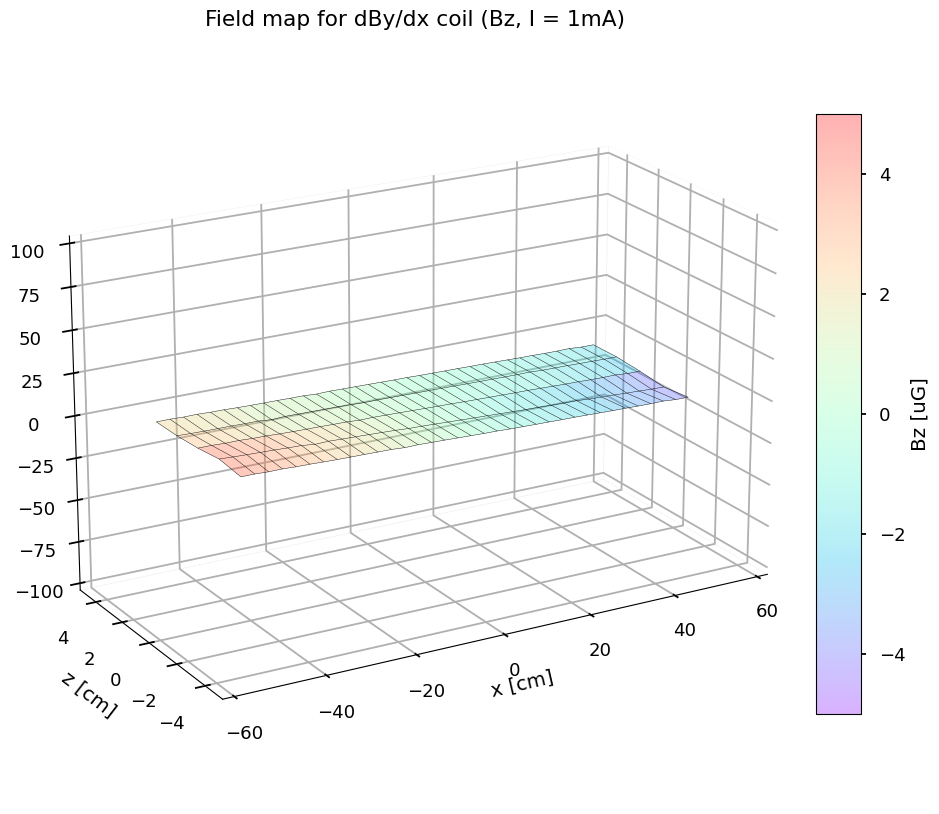

In [117]:
# Make a 3D field map on the x-z plane, for Bz

x, z = np.meshgrid(df_dBydx['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBydx['Bz1'], df_dBydx['Bz4'], df_dBydx['Bz2'], df_dBydx['Bz5'], df_dBydx['Bz3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -5, vmax = 5, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-100, 100)
# ax.set_zlabel('Bz [uG]', labelpad=10)
ax.set_title('Field map for dBy/dx coil (Bz, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'Bz [uG]')

# Save figure
plt.savefig('Graphs/dBydx_FieldMap_Bz.pdf', dpi=1000, transparent=True, bbox_inches='tight')

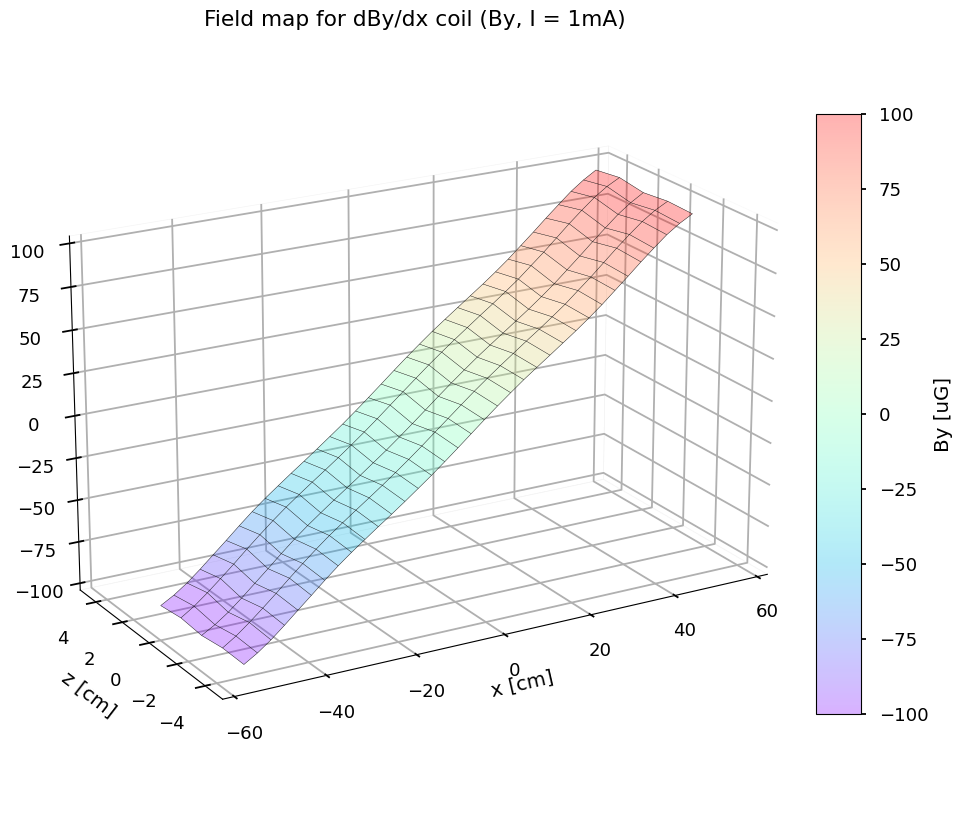

In [116]:
# Make a 3D field map on the x-z plane, for By

x, z = np.meshgrid(df_dBydx['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBydx['By1'], df_dBydx['By4'], df_dBydx['By2'], df_dBydx['By5'], df_dBydx['By3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -100, vmax = 100, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-100, 100)
# ax.set_zlabel('Bz [uG]', labelpad=10)
ax.set_title('Field map for dBy/dx coil (By, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'By [uG]')

# Save figure
plt.savefig('Graphs/dBydx_FieldMap_By.pdf', dpi=1000, transparent=True, bbox_inches='tight')

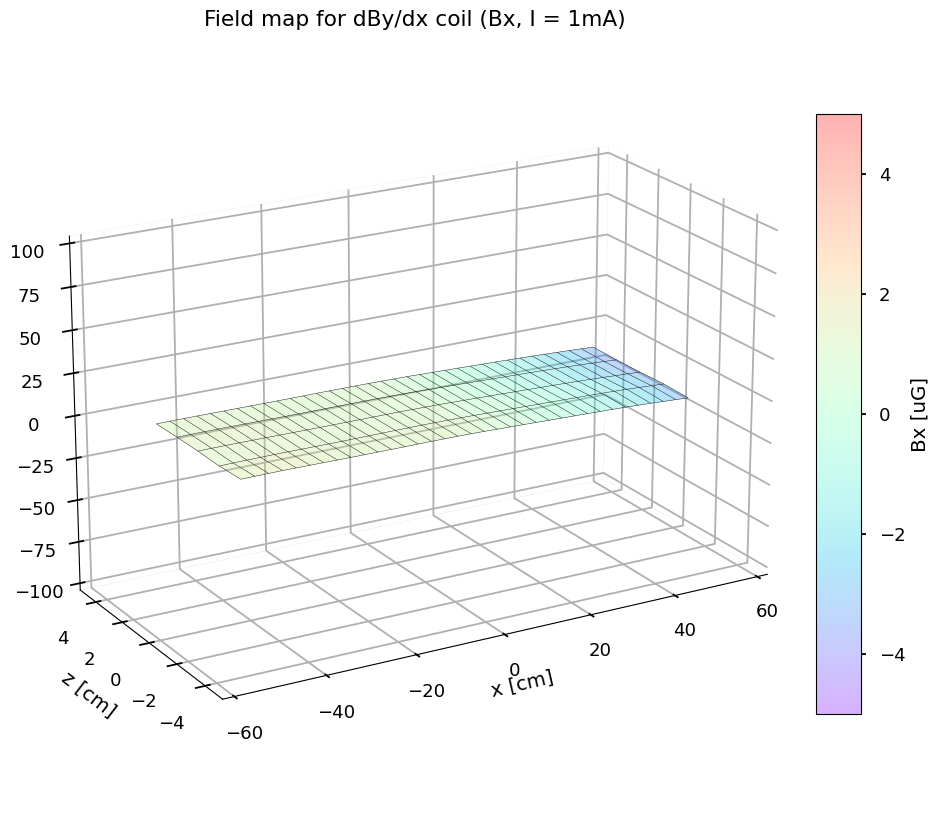

In [115]:
# Make a 3D field map on the x-z plane, for Bx

x, z = np.meshgrid(df_dBydx['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBydx['Bx1'], df_dBydx['Bx4'], df_dBydx['Bx2'], df_dBydx['Bx5'], df_dBydx['Bx3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -5, vmax = 5, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-100, 100)
# ax.set_zlabel('Bz [uG]', labelpad=10)
ax.set_title('Field map for dBy/dx coil (Bx, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'Bx [uG]')

# Save figure
plt.savefig('Graphs/dBydx_FieldMap_Bx.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the field on the beamline and compare with simulations

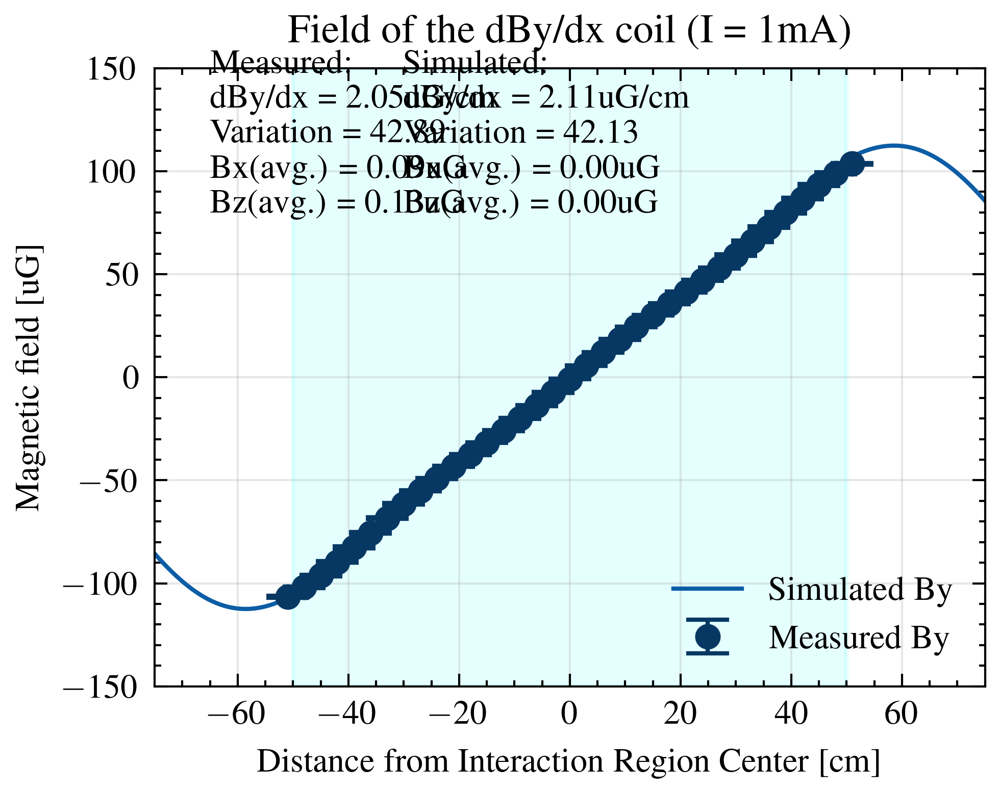

In [54]:
# Plot fields on the beamline
z_probe = 0 
z_index = 10 * z_probe - 50
plt.figure(facecolor='none')
dBydx_error = B_field_error(df_dBydx)
dBydx_sim = np.gradient(dBydx_coil_Y[z_index,250:1250])/0.1

plt.plot(x_sim[0], dBydx_coil_Y[z_index], '-', label = 'Simulated By')
plt.errorbar(df_dBydx['dist'], df_dBydx['By2'], fmt='o', yerr = dBydx_error['dBydx2'], ms=5, capsize=5, capthick=1, label = 'Measured By', color = darken_color(0))

plt.legend(loc = 'lower right')
plt.xlabel('Distance from Interaction Region Center [cm]')
plt.ylabel('Magnetic field [uG]')
plt.title('Field of the dBy/dx coil (I = 1mA)')
plt.xlim(-75, 75)
plt.ylim(-150, 150)

plot_text = 'Measured:\ndBy/dx = {:.2f}uG/cm\nVariation = {:.2f}%\nBx(avg.) = {:.2f}uG\nBz(avg.) = {:.2f}uG'.format(np.mean(df_dBydx['dBydx']), 
                                                                                                          (np.max(df_dBydx['dBydx'])-np.min(df_dBydx['dBydx']))/np.mean(df_dBydx['dBydx'])*100,
                                                                                                          np.mean(df_dBydx['Bx2']),
                                                                                                          np.mean(df_dBydx['Bz2']))
sim_text = 'Simulated:\ndBy/dx = {:.2f}uG/cm\nVariation = {:.2f}%\nBx(avg.) = {:.2f}uG\nBz(avg.) = {:.2f}uG'.format(np.mean(dBydx_sim), 
                                                                                                          (np.max(dBydx_sim)-np.min(dBydx_sim))/np.mean(dBydx_sim)*100,
                                                                                                          np.mean(dBydx_coil_X[50]),
                                                                                                          np.mean(dBydx_coil_Z[50]))

plt.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
plt.text(-65, 80, plot_text)
plt.text(-30, 80, sim_text)
plt.grid(alpha = 0.3)

# Save Figure. Check each time!
# plt.savefig('Graphs/dBydx_Beamline.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the gradients

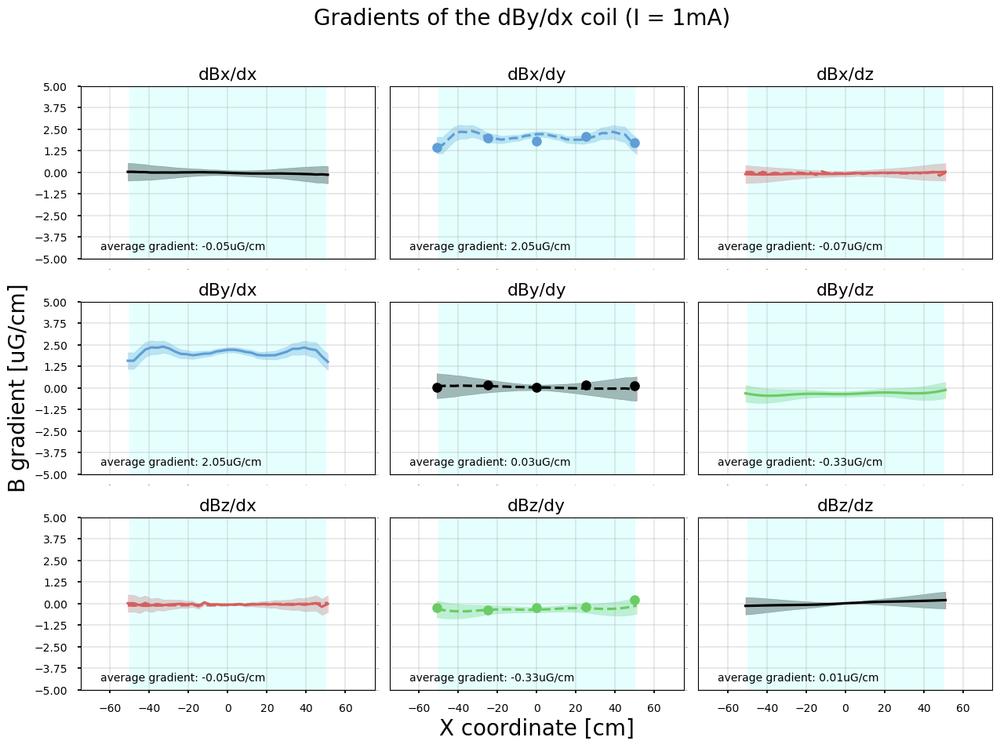

In [121]:
# Plot gradients
fig, axs = plt.subplots(3, 3, figsize=(15, 10))
plt.subplots_adjust(wspace=0.05, hspace=0.25)

x = df_dBydx['dist']
ys = [df_dBydx['dBxdx'], df_dBydx['dBydx'], df_dBydx['dBxdz'],
    df_dBydx['dBydx'], df_dBydx['dBydy'], df_dBydx['dBydz'],
    df_dBydx['dBzdx'], df_dBydx['dBydz'], df_dBydx['dBzdz']]

axs[0, 0].plot(df_dBydx['dist'], df_dBydx['dBxdx'], label = 'dBxdx', color = 'black')
axs[0,0].fill_between(df_dBydx['dist'], df_dBydx['dBxdx'] - dBydx_error['dBxdx2'], df_dBydx['dBxdx'] + dBydx_error['dBxdx2'], alpha = 0.3, color = 'black')
axs[0, 1].plot(df_dBydx['dist'], df_dBydx['dBydx'], '--', label = 'dBxdy', color = '#5F9ED6')
axs[0, 1].fill_between(df_dBydx['dist'], df_dBydx['dBydx'] - dBydx_error['dBydx2'], df_dBydx['dBydx'] + dBydx_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[0, 2].plot(df_dBydx['dist'], df_dBydx['dBxdz'], label = 'dBxdz', color = '#D65F5F')
axs[0, 2].fill_between(df_dBydx['dist'], df_dBydx['dBxdz'] - dBydx_error['dBxdz'], df_dBydx['dBxdz'] + dBydx_error['dBxdz'], alpha = 0.3, color = '#D65F5F')
axs[0, 2].plot(df_dBydx['dist'], df_dBydx['dBzdx'], '--', label = 'dBzdx', color = '#D65F5F')

axs[1, 0].plot(df_dBydx['dist'], df_dBydx['dBydx'], label = 'dBxdy', color = '#5F9ED6')
axs[1, 0].fill_between(df_dBydx['dist'], df_dBydx['dBydx'] - dBydx_error['dBydx2'], df_dBydx['dBydx'] + dBydx_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[1, 1].plot(df_dBydx['dist'], df_dBydx['dBydy'], '--', label = 'dBydy', color = 'black')
axs[1, 1].fill_between(df_dBydx['dist'], df_dBydx['dBydy'] - dBydx_error['dBydy'], df_dBydx['dBydy'] + dBydx_error['dBydy'], alpha = 0.3, color = 'black')
axs[1, 2].plot(df_dBydx['dist'], df_dBydx['dBydz'], label = 'dBydz', color = '#6ACC65')
axs[1, 2].fill_between(df_dBydx['dist'], df_dBydx['dBydz'] - dBydx_error['dBydz'], df_dBydx['dBydz'] + dBydx_error['dBydz'], alpha = 0.3, color = '#6ACC65')

axs[2, 0].plot(df_dBydx['dist'], df_dBydx['dBzdx'], label = 'dBzdx', color = '#D65F5F')
axs[2, 0].fill_between(df_dBydx['dist'], df_dBydx['dBzdx'] - dBydx_error['dBzdx2'], df_dBydx['dBzdx'] + dBydx_error['dBzdx2'], alpha = 0.3, color = '#D65F5F')
axs[2, 0].plot(df_dBydx['dist'], df_dBydx['dBxdz'], '--', label = 'dBxdz', color = '#D65F5F')
axs[2, 1].plot(df_dBydx['dist'], df_dBydx['dBydz'], '--', label = 'dBydz', color = '#6ACC65')
axs[2, 1].fill_between(df_dBydx['dist'], df_dBydx['dBydz'] - dBydx_error['dBydz'], df_dBydx['dBydz'] + dBydx_error['dBydz'], alpha = 0.3, color = '#6ACC65')
axs[2, 2].plot(df_dBydx['dist'], df_dBydx['dBzdz'], label = 'dBzdz', color = 'black')
axs[2, 2].fill_between(df_dBydx['dist'], df_dBydx['dBzdz'] - dBydx_error['dBzdz'], df_dBydx['dBzdz'] + dBydx_error['dBzdz'], alpha = 0.3, color = 'black')

for ax, y in zip(axs.flat, ys):
    ax.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
    ax.set_ylim(-5, 5);
    ax.set_xlim(-75, 75);
    ax.set_yticks([-5,-3.75,-2.5,-1.25,0,1.25,2.5,3.75,5]);
    ax.set_xticks([-60,-40,-20,0,20,40,60]);
    ax.tick_params(axis='both', which='both', length=0, labelsize=0);
    ax.grid(alpha=0.3)
    max_value = np.max(np.abs(y))
    mean_value = np.mean(y)
    ax.text(-65, -4.5, f'average gradient: {mean_value:.2f}uG/cm')

dBdy_x_coor = [-51, -25, 0, 25, 50]
dBxdy_add_By = [1.45, 2, 1.8, 2.07, 1.73]
dBydy_add_By = [0.04190315, 0.18594603, 0.01649118, 0.17457666, 0.09828531]
dBzdy_add_By = [-0.26153025, -0.37498494, -0.24772992, -0.17892157,  0.19556343]
axs[0, 1].plot(dBdy_x_coor, dBxdy_add_By, 'o', color = '#5F9ED6')
axs[1, 1].plot(dBdy_x_coor, dBydy_add_By, 'o', color = 'black')
axs[2, 1].plot(dBdy_x_coor, dBzdy_add_By, 'o', color = '#6ACC65')

axs[0, 0].set_title('dBx/dx')
axs[0, 1].set_title('dBx/dy')
axs[0, 2].set_title('dBx/dz')
axs[1, 0].set_title('dBy/dx')
axs[1, 1].set_title('dBy/dy')
axs[1, 2].set_title('dBy/dz')
axs[2, 0].set_title('dBz/dx')
axs[2, 1].set_title('dBz/dy')
axs[2, 2].set_title('dBz/dz')

axs[0,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[2,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].set_ylabel('B gradient [uG/cm]', fontsize=20);
axs[2,0].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,2].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].set_xlabel('X coordinate [cm]', fontsize=20);


fig.suptitle('Gradients of the dBy/dx coil (I = 1mA)', fontsize=20)

# Save Figure. Check each time!
plt.savefig('Graphs/dBydx_Gradients.pdf', dpi=1000, transparent=True, bbox_inches='tight')

# dBy/dy

## Import and process the data

In [39]:
# Import the data
df = pd.read_csv('Field Data/dBydy_field.csv', sep=',', header=None)

df.columns = ['dist', 'current', 
         'Mag1Bx', 'Mag1By', 'Mag1Bz', 
         'Mag2Bx', 'Mag2By', 'Mag2Bz', 
         'Mag3Bx', 'Mag3By', 'Mag3Bz', 
         'Mag4Bx', 'Mag4By', 'Mag4Bz', 
         'Mag5Bx', 'Mag5By', 'Mag5Bz']
# df = df.sort_values(by=['dist']).reset_index(drop=True)

# Figure out the current we actually need to apply
dBydy_target = 200 # uG/cm
dBydy_measured = - ((df['Mag1Bx'][17] - df['Mag3Bx'][17]) / 6) - ((df['Mag2Bz'][18] - df['Mag2Bz'][16]) / 6)
dBydy_current_measured = df['current'][17]
dBydy_current_target = dBydy_target * dBydy_current_measured / dBydy_measured

# Normalize the fields to unit current values
# Redo calibration
# Bx -> 0.9548 * Bx
# By -> 1 * By
# Bz -> [0.9107, 1.1095, 1.1023, 0.9187, 1.0880] * Bz
# Transform to ACME coordinates
# sensor -> ACME
# x -> z
# y -> -y
# z -> x
df['Bz1'] = df['Mag1Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By1'] = -df['Mag1By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx1'] = df['Mag1Bz']/np.mean(df['current']) * 910.7
df['Bz2'] = df['Mag2Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By2'] = -df['Mag2By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx2'] = df['Mag2Bz']/np.mean(df['current']) * 1109.5
df['Bz3'] = df['Mag3Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By3'] = -df['Mag3By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx3'] = df['Mag3Bz']/np.mean(df['current']) * 1102.3
df['Bz4'] = df['Mag4Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By4'] = -df['Mag4By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx4'] = df['Mag4Bz']/np.mean(df['current']) * 918.7
df['Bz5'] = df['Mag5Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By5'] = -df['Mag5By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx5'] = df['Mag5Bz']/np.mean(df['current']) * 1088.0


# Align measurements on mag4 and Mag5 to same x location.
df['Bx4'][0:35] = df['Bx4'][5:]
df['By4'][0:35] = df['By4'][5:]
df['Bz4'][0:35] = df['Bz4'][5:]
df['Bx5'][0:35] = df['Bx5'][5:]
df['By5'][0:35] = df['By5'][5:]
df['Bz5'][0:35] = df['Bz5'][5:]
df_dBydy = df.iloc[0:35,:]

print(dBydy_current_target)

116386.27170582229


In [40]:
# Calculate the gradients
# dBdz gradients
df_dBydy['dBzdz12'] = (df_dBydy['Bz1'] - df_dBydy['Bz2']) / 3
df_dBydy['dBydz12'] = (df_dBydy['By1'] - df_dBydy['By2']) / 3
df_dBydy['dBxdz12'] = (df_dBydy['Bx1'] - df_dBydy['Bx2']) / 3
df_dBydy['dBzdz23'] = (df_dBydy['Bz2'] - df_dBydy['Bz3']) / 3
df_dBydy['dBydz23'] = (df_dBydy['By2'] - df_dBydy['By3']) / 3
df_dBydy['dBxdz23'] = (df_dBydy['Bx2'] - df_dBydy['Bx3']) / 3
df_dBydy['dBzdz'] = (df_dBydy['dBzdz12'] + df_dBydy['dBzdz23']) / 2
df_dBydy['dBydz'] = (df_dBydy['dBydz12'] + df_dBydy['dBydz23']) / 2
df_dBydy['dBxdz'] = (df_dBydy['dBxdz12'] + df_dBydy['dBxdz23']) / 2
df_dBydy['dBxdz'] = df_dBydy['dBxdz23']
# dBdx gradients
df_dBydy['dBzdx1'] = df_dBydy['Bz1'].diff() / 3
df_dBydy['dBydx1'] = df_dBydy['By1'].diff() / 3
df_dBydy['dBxdx1'] = df_dBydy['Bx1'].diff() / 3
df_dBydy['dBzdx1'][0] = df_dBydy['dBzdx1'][1]
df_dBydy['dBydx1'][0] = df_dBydy['dBydx1'][1]
df_dBydy['dBxdx1'][0] = df_dBydy['dBxdx1'][1]
df_dBydy['dBzdx2'] = df_dBydy['Bz2'].diff() / 3
df_dBydy['dBydx2'] = df_dBydy['By2'].diff() / 3
df_dBydy['dBxdx2'] = df_dBydy['Bx2'].diff() / 3
df_dBydy['dBzdx2'][0] = df_dBydy['dBzdx2'][1]
df_dBydy['dBydx2'][0] = df_dBydy['dBydx2'][1]
df_dBydy['dBxdx2'][0] = df_dBydy['dBxdx2'][1]
df_dBydy['dBzdx3'] = df_dBydy['Bz3'].diff() / 3
df_dBydy['dBydx3'] = df_dBydy['By3'].diff() / 3
df_dBydy['dBxdx3'] = df_dBydy['Bx3'].diff() / 3
df_dBydy['dBzdx3'][0] = df_dBydy['dBzdx3'][1]
df_dBydy['dBydx3'][0] = df_dBydy['dBydx3'][1]
df_dBydy['dBxdx3'][0] = df_dBydy['dBxdx3'][1]
df_dBydy['dBzdx'] = (df_dBydy['dBzdx1'] + df_dBydy['dBzdx2'] + df_dBydy['dBzdx3']) / 3
df_dBydy['dBydx'] = (df_dBydy['dBydx1'] + df_dBydy['dBydx2'] + df_dBydy['dBydx3']) / 3
df_dBydy['dBxdx'] = (df_dBydy['dBxdx1'] + df_dBydy['dBxdx2'] + df_dBydy['dBxdx3']) / 3
#dBydy gradient
df_dBydy['dBydy1'] = - (df_dBydy['dBxdx1'] + df_dBydy['dBzdz12'])
df_dBydy['dBydy2'] = - (df_dBydy['dBxdx2'] + df_dBydy['dBzdz12'])
df_dBydy['dBydy3'] = - (df_dBydy['dBxdx2'] + df_dBydy['dBzdz23'])
df_dBydy['dBydy4'] = - (df_dBydy['dBxdx3'] + df_dBydy['dBzdz23'])
df_dBydy['dBydy'] = (df_dBydy['dBydy1'] + df_dBydy['dBydy2'] + df_dBydy['dBydy3'] + df_dBydy['dBydy4']) / 4

# Calculate the maximum range of the field in the interaction region
# Bz_max = df_Bz[['Bz1', 'Bz2', 'Bz3']].max() 
# Bz_min = df_Bz[['Bz1', 'Bz2', 'Bz3']].min()
# delta_Bz = Bz_max.max() - Bz_min.min()

/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/1960048149.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dBydy['dBzdz12'] = (df_dBydy['Bz1'] - df_dBydy['Bz2']) / 3
/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/1960048149.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dBydy['dBydz12'] = (df_dBydy['By1'] - df_dBydy['By2']) / 3
/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/1960048149.py:5: SettingWithCopyWarning: 
A value is trying to be s

## Plot the field maps

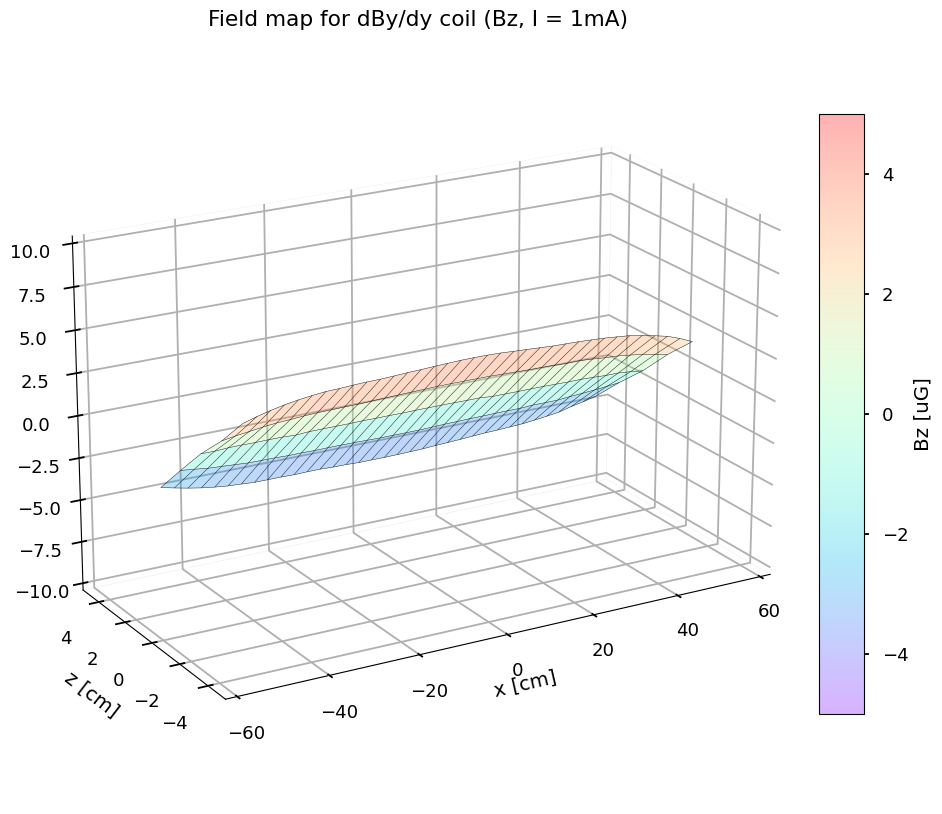

In [124]:
# Make a 3D field map on the x-z plane, for Bz

x, z = np.meshgrid(df_dBydy['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBydy['Bz1'], df_dBydy['Bz4'], df_dBydy['Bz2'], df_dBydy['Bz5'], df_dBydy['Bz3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -5, vmax = 5, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-10, 10)
# ax.set_zlabel('Bz [uG]', labelpad=10)
ax.set_title('Field map for dBy/dy coil (Bz, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'Bz [uG]')

# Save figure
plt.savefig('Graphs/dBydy_FieldMap_Bz.pdf', dpi=1000, transparent=True, bbox_inches='tight')

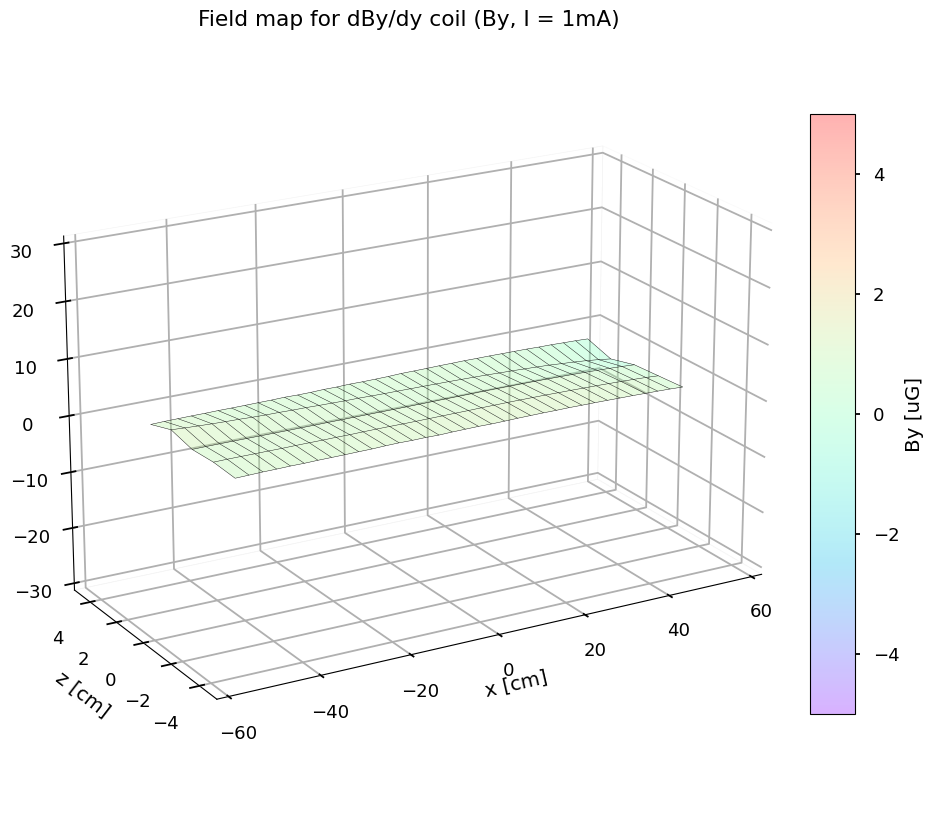

In [125]:
# Make a 3D field map on the x-z plane, for By

x, z = np.meshgrid(df_dBydy['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBydy['By1'], df_dBydy['By4'], df_dBydy['By2'], df_dBydy['By5'], df_dBydy['By3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -5, vmax = 5, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-30, 30)
# ax.set_zlabel('Bz [uG]', labelpad=10)
ax.set_title('Field map for dBy/dy coil (By, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'By [uG]')

# Save figure
plt.savefig('Graphs/dBydy_FieldMap_By.pdf', dpi=1000, transparent=True, bbox_inches='tight')

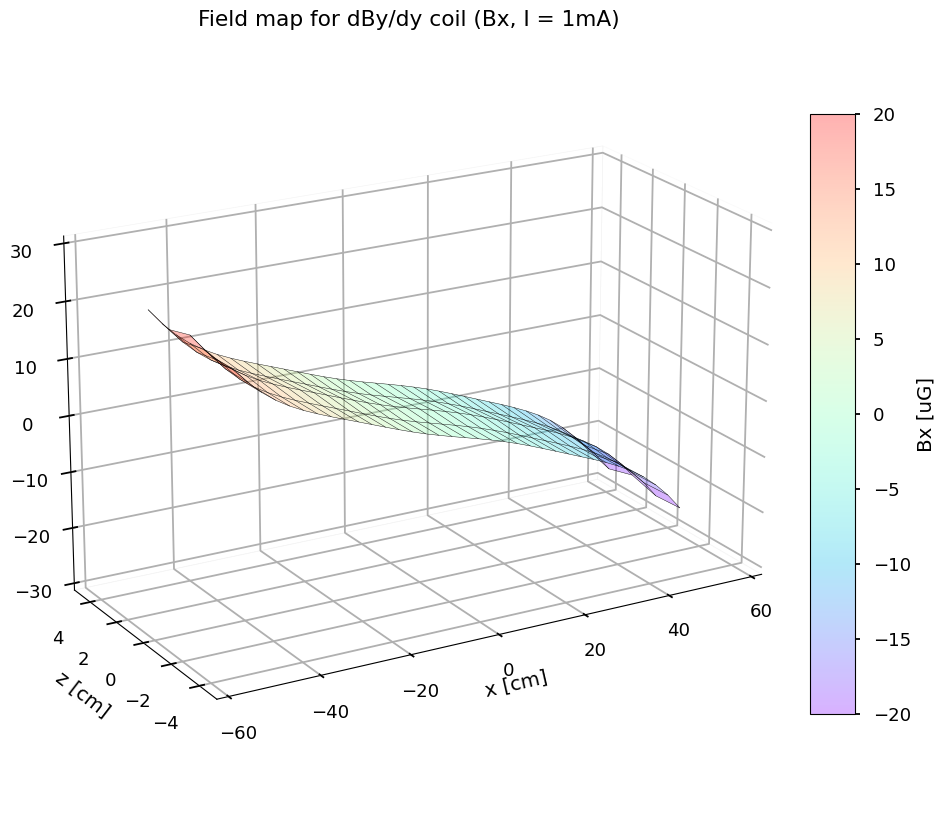

In [126]:
# Make a 3D field map on the x-z plane, for Bx

x, z = np.meshgrid(df_dBydy['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBydy['Bx1'], df_dBydy['Bx4'], df_dBydy['Bx2'], df_dBydy['Bx5'], df_dBydy['Bx3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -20, vmax = 20, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-30, 30)
# ax.set_zlabel('Bx [uG]', labelpad=10)
ax.set_title('Field map for dBy/dy coil (Bx, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'Bx [uG]')

# Save figure
plt.savefig('Graphs/dBydy_FieldMap_Bx.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the field on the beamline

NameError: name 'df_dBydx' is not defined

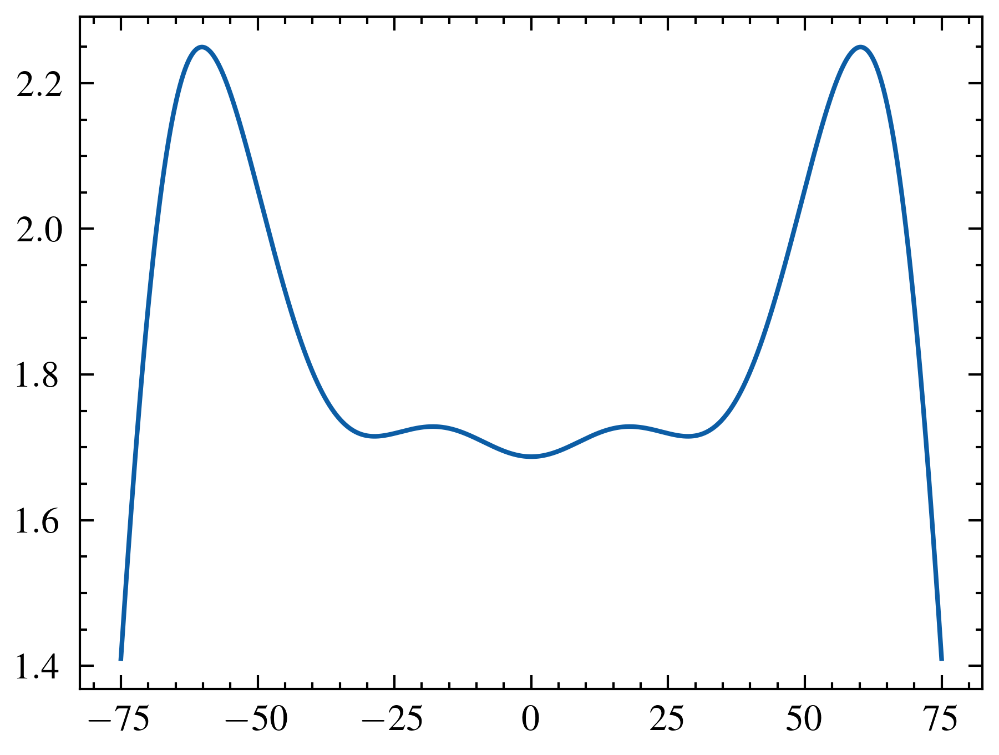

In [41]:
# Plot fields on the beamline
z_probe = 0 
z_index = 10 * z_probe - 50
dBydy_error = B_field_error(df_dBydy)
dBydy_sim = np.gradient(dBydy_coil_Y_, axis = 0) / 0.1

plt.plot(x_sim[0], dBydy_sim[z_index], '-', label = 'Simulated dBy/dy', color = 'C0')
plt.errorbar(df_dBydx['dist'], df_dBydy['dBydy2'], yerr = dBydy_error['dBydy'], fmt='o', ms=5, capsize=5, capthick=1, label = 'Measured dBy/dy', color = darken_color(0))

plt.legend(loc = 'lower right')
plt.xlabel('Distance from Interaction Region Center [cm]')
plt.ylabel('Magnetic field [uG]')
plt.title('dBy/dy gradient of the dBy/dy coil (I = 1mA)')
plt.xlim(-75, 75)
plt.ylim(-10, 10)

plot_text = 'Measured:\ndBy/dy = {:.2f}uG/cm\nVariation = {:.2f}%\nBx(avg.) = {:.2f}uG\nBz(avg.) = {:.2f}uG'.format(np.mean(df_dBydy['dBydy']), 
                                                                                                          (np.max(df_dBydy['dBydy'])-np.min(df_dBydy['dBydy']))/np.mean(df_dBydy['dBydy'])*100,
                                                                                                          np.mean(df_dBydy['Bx2']),
                                                                                                          np.mean(df_dBydy['Bz2']))
sim_text = 'Simulated:\ndBy/dy = {:.2f}uG/cm\nVariation = {:.2f}%\nBx(avg.) = {:.2f}uG\nBz(avg.) = {:.2f}uG'.format(np.mean(dBydy_sim), 
                                                                                                          (np.max(dBydy_sim)-np.min(dBydy_sim))/np.mean(dBydy_sim)*100,
                                                                                                          np.mean(dBydy_coil_X[50]),
                                                                                                          np.mean(dBydy_coil_Z[50]))

plt.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
plt.text(-65, -9, plot_text)
plt.text(-30, -9, sim_text)
plt.grid(alpha = 0.3)

# Save Figure. Check each time!
# plt.savefig('Graphs/dBydy_Beamline.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the gradients

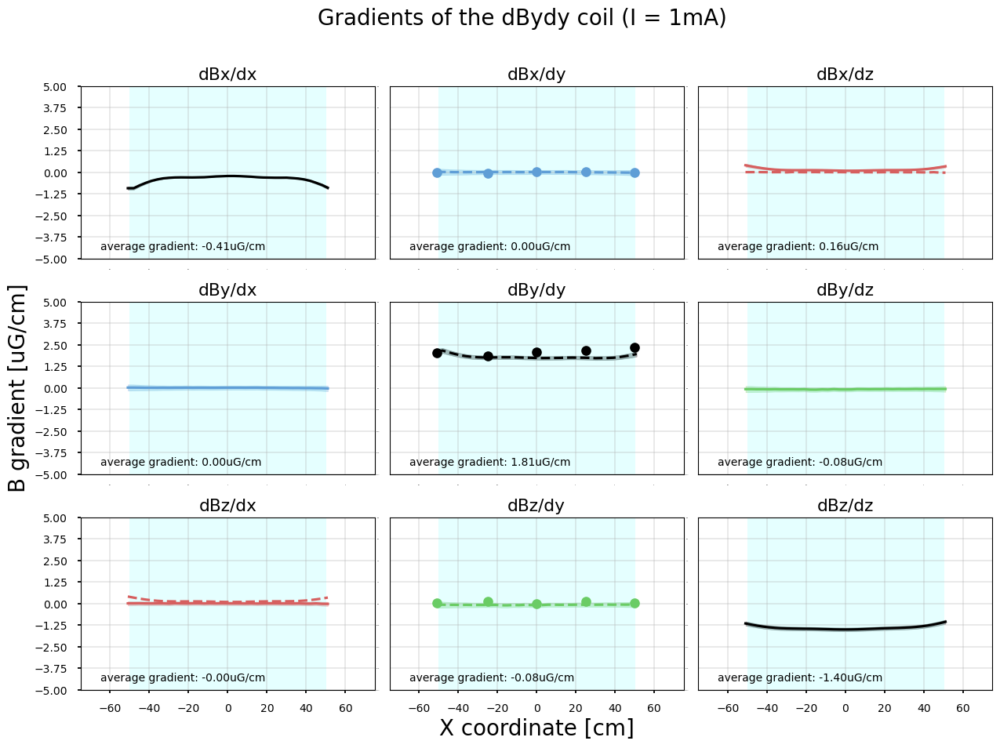

In [184]:
# Plot gradients
fig, axs = plt.subplots(3, 3, figsize=(15, 10))
plt.subplots_adjust(wspace=0.05, hspace=0.25)

x = df_dBydy['dist']
ys = [df_dBydy['dBxdx'], df_dBydy['dBydx'], df_dBydy['dBxdz'],
    df_dBydy['dBydx'], df_dBydy['dBydy'], df_dBydy['dBydz'],
    df_dBydy['dBzdx'], df_dBydy['dBydz'], df_dBydy['dBzdz']]

axs[0, 0].plot(df_dBydy['dist'], df_dBydy['dBxdx'], label = 'dBxdx', color = 'black')
axs[0, 0].fill_between(df_dBydy['dist'], df_dBydy['dBxdx'] - dBydy_error['dBxdx2'], df_dBydy['dBxdx'] + dBydy_error['dBxdx2'], alpha = 0.3, color = 'black')
axs[0, 1].plot(df_dBydy['dist'], df_dBydy['dBydx'], '--', label = 'dBxdy', color = '#5F9ED6')
axs[0, 1].fill_between(df_dBydy['dist'], df_dBydy['dBydx'] - dBydy_error['dBydx2'], df_dBydy['dBydx'] + dBydy_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[0, 2].plot(df_dBydy['dist'], df_dBydy['dBxdz'], label = 'dBxdz', color = '#D65F5F')
axs[0, 2].fill_between(df_dBydy['dist'], df_dBydy['dBxdz'] - dBydy_error['dBxdz'], df_dBydy['dBxdz'] + dBydy_error['dBxdz'], alpha = 0.3, color = '#D65F5F')
axs[0, 2].plot(df_dBydy['dist'], df_dBydy['dBzdx'], '--', label = 'dBzdx', color = '#D65F5F')

axs[1, 0].plot(df_dBydy['dist'], df_dBydy['dBydx'], label = 'dBxdy', color = '#5F9ED6')
axs[1, 0].fill_between(df_dBydy['dist'], df_dBydy['dBydx'] - dBydy_error['dBydx2'], df_dBydy['dBydx'] + dBydy_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[1, 1].plot(df_dBydy['dist'], df_dBydy['dBydy'], '--', label = 'dBydy', color = 'black')
axs[1, 1].fill_between(df_dBydy['dist'], df_dBydy['dBydy'] - dBydy_error['dBydy'], df_dBydy['dBydy'] + dBydy_error['dBydy'], alpha = 0.3, color = 'black')
axs[1, 2].plot(df_dBydy['dist'], df_dBydy['dBydz'], label = 'dBydz', color = '#6ACC65')
axs[1, 2].fill_between(df_dBydy['dist'], df_dBydy['dBydz'] - dBydy_error['dBydz'], df_dBydy['dBydz'] + dBydy_error['dBydz'], alpha = 0.3, color = '#6ACC65')

axs[2, 0].plot(df_dBydy['dist'], df_dBydy['dBzdx'], label = 'dBzdx', color = '#D65F5F')
axs[2, 0].fill_between(df_dBydy['dist'], df_dBydy['dBzdx'] - dBydy_error['dBzdx2'], df_dBydy['dBzdx'] + dBydy_error['dBzdx2'], alpha = 0.3, color = '#D65F5F')
axs[2, 0].plot(df_dBydy['dist'], df_dBydy['dBxdz'], '--', label = 'dBxdz', color = '#D65F5F')
axs[2, 1].plot(df_dBydy['dist'], df_dBydy['dBydz'], '--', label = 'dBydz', color = '#6ACC65')
axs[2, 1].fill_between(df_dBydy['dist'], df_dBydy['dBydz'] - dBydy_error['dBydz'], df_dBydy['dBydz'] + dBydy_error['dBydz'], alpha = 0.3, color = '#6ACC65')
axs[2, 2].plot(df_dBydy['dist'], df_dBydy['dBzdz'], label = 'dBzdz', color = 'black')
axs[2, 2].fill_between(df_dBydy['dist'], df_dBydy['dBzdz'] - dBydy_error['dBzdz'], df_dBydy['dBzdz'] + dBydy_error['dBzdz'], alpha = 0.3, color = 'black')

for ax, y in zip(axs.flat, ys):
    ax.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
    ax.set_ylim(-5, 5);
    ax.set_xlim(-75, 75);
    ax.set_yticks([-5,-3.75,-2.5,-1.25,0,1.25,2.5,3.75,5]);
    ax.set_xticks([-60,-40,-20,0,20,40,60]);
    ax.tick_params(axis='both', which='both', length=0, labelsize=0);
    ax.grid(alpha=0.3)
    max_value = np.max(np.abs(y))
    mean_value = np.mean(y)
    ax.text(-65, -4.5, f'average gradient: {mean_value:.2f}uG/cm')

dBdy_x_coor = [-51, -25, 0, 25, 50]
dBxdy_add_By = [-0.01534109, -0.07186152,  0.01885652,  0.03215565, -0.01700804]
dBydy_add_By = [2.03821051, 1.82790963, 2.07118069, 2.152225  , 2.33258011]
dBzdy_add_By = [0.0403766 ,  0.12824242, -0.02301628,  0.11784637,  0.04271969]
axs[0, 1].plot(dBdy_x_coor, dBxdy_add_By, 'o', color = '#5F9ED6')
axs[1, 1].plot(dBdy_x_coor, dBydy_add_By, 'o', color = 'black')
axs[2, 1].plot(dBdy_x_coor, dBzdy_add_By, 'o', color = '#6ACC65')

axs[0, 0].set_title('dBx/dx')
axs[0, 1].set_title('dBx/dy')
axs[0, 2].set_title('dBx/dz')
axs[1, 0].set_title('dBy/dx')
axs[1, 1].set_title('dBy/dy')
axs[1, 2].set_title('dBy/dz')
axs[2, 0].set_title('dBz/dx')
axs[2, 1].set_title('dBz/dy')
axs[2, 2].set_title('dBz/dz')

axs[0,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[2,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].set_ylabel('B gradient [uG/cm]', fontsize=20);
axs[2,0].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,2].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].set_xlabel('X coordinate [cm]', fontsize=20);


fig.suptitle('Gradients of the dBydy coil (I = 1mA)', fontsize=20)

# Save Figure. Check each time!
plt.savefig('Graphs/dBydy_Gradients.pdf', dpi=1000, transparent=True, bbox_inches='tight')

# dBy/dz

## Import and process the data

In [42]:
# Import the data
df = pd.read_csv('Field Data/dBydz_field.csv', sep=',', header=None)

df.columns = ['dist', 'current', 
         'Mag1Bx', 'Mag1By', 'Mag1Bz', 
         'Mag2Bx', 'Mag2By', 'Mag2Bz', 
         'Mag3Bx', 'Mag3By', 'Mag3Bz', 
         'Mag4Bx', 'Mag4By', 'Mag4Bz', 
         'Mag5Bx', 'Mag5By', 'Mag5Bz']
# df = df.sort_values(by=['dist']).reset_index(drop=True)

# Figure out the current we actually need to apply
dBydz_target = 200 # uG/cm
dBydz_measured = - (df['Mag1By'][17] - df['Mag3By'][17]) / 6
dBydz_current_measured = df['current'][17]
dBydz_current_target = dBydz_target * dBydz_current_measured / dBydz_measured

# Normalize the fields to unit current values
# Redo calibration
# Bx -> 0.9548 * Bx
# By -> 1 * By
# Bz -> [0.9107, 1.1095, 1.1023, 0.9187, 1.0880] * Bz

# Transform to ACME coordinates
# sensor -> ACME
# x -> z
# y -> -y
# z -> x
df['Bz1'] = df['Mag1Bx']/np.mean(df['current']) * 954.8  * 256.641 / 248.253
df['By1'] = -df['Mag1By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx1'] = df['Mag1Bz']/np.mean(df['current']) * 910.7
df['Bz2'] = df['Mag2Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By2'] = -df['Mag2By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx2'] = df['Mag2Bz']/np.mean(df['current']) * 1109.5
df['Bz3'] = df['Mag3Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By3'] = -df['Mag3By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx3'] = df['Mag3Bz']/np.mean(df['current']) * 1102.3
df['Bz4'] = df['Mag4Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By4'] = -df['Mag4By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx4'] = df['Mag4Bz']/np.mean(df['current']) * 918.7
df['Bz5'] = df['Mag5Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By5'] = -df['Mag5By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx5'] = df['Mag5Bz']/np.mean(df['current']) * 1088.0

# Align measurements on mag4 and Mag5 to same x location.
df['Bx4'][0:35] = df['Bx4'][5:]
df['By4'][0:35] = df['By4'][5:]
df['Bz4'][0:35] = df['Bz4'][5:]
df['Bx5'][0:35] = df['Bx5'][5:]
df['By5'][0:35] = df['By5'][5:]
df['Bz5'][0:35] = df['Bz5'][5:]
df_dBydz = df.iloc[0:35,:]

print(dBydz_current_target)

67643.7896070976


In [43]:
# Calculate the gradients
# dBdz gradients
df_dBydz['dBzdz12'] = (df_dBydz['Bz1'] - df_dBydz['Bz2']) / 3
df_dBydz['dBydz12'] = (df_dBydz['By1'] - df_dBydz['By2']) / 3
df_dBydz['dBxdz12'] = (df_dBydz['Bx1'] - df_dBydz['Bx2']) / 3
df_dBydz['dBzdz23'] = (df_dBydz['Bz2'] - df_dBydz['Bz3']) / 3
df_dBydz['dBydz23'] = (df_dBydz['By2'] - df_dBydz['By3']) / 3
df_dBydz['dBxdz23'] = (df_dBydz['Bx2'] - df_dBydz['Bx3']) / 3
df_dBydz['dBzdz'] = (df_dBydz['dBzdz12'] + df_dBydz['dBzdz23']) / 2
df_dBydz['dBydz'] = (df_dBydz['dBydz12'] + df_dBydz['dBydz23']) / 2
df_dBydz['dBxdz'] = (df_dBydz['dBxdz12'] + df_dBydz['dBxdz23']) / 2
df_dBydz['dBxdz'] = df_dBydz['dBxdz23']
# dBdx gradients
df_dBydz['dBzdx1'] = df_dBydz['Bz1'].diff() / 3
df_dBydz['dBydx1'] = df_dBydz['By1'].diff() / 3
df_dBydz['dBxdx1'] = df_dBydz['Bx1'].diff() / 3
df_dBydz['dBzdx1'][0] = df_dBydz['dBzdx1'][1]
df_dBydz['dBydx1'][0] = df_dBydz['dBydx1'][1]
df_dBydz['dBxdx1'][0] = df_dBydz['dBxdx1'][1]
df_dBydz['dBzdx2'] = df_dBydz['Bz2'].diff() / 3
df_dBydz['dBydx2'] = df_dBydz['By2'].diff() / 3
df_dBydz['dBxdx2'] = df_dBydz['Bx2'].diff() / 3
df_dBydz['dBzdx2'][0] = df_dBydz['dBzdx2'][1]
df_dBydz['dBydx2'][0] = df_dBydz['dBydx2'][1]
df_dBydz['dBxdx2'][0] = df_dBydz['dBxdx2'][1]
df_dBydz['dBzdx3'] = df_dBydz['Bz3'].diff() / 3
df_dBydz['dBydx3'] = df_dBydz['By3'].diff() / 3
df_dBydz['dBxdx3'] = df_dBydz['Bx3'].diff() / 3
df_dBydz['dBzdx3'][0] = df_dBydz['dBzdx3'][1]
df_dBydz['dBydx3'][0] = df_dBydz['dBydx3'][1]
df_dBydz['dBxdx3'][0] = df_dBydz['dBxdx3'][1]
df_dBydz['dBzdx'] = (df_dBydz['dBzdx1'] + df_dBydz['dBzdx2'] + df_dBydz['dBzdx3']) / 3
df_dBydz['dBydx'] = (df_dBydz['dBydx1'] + df_dBydz['dBydx2'] + df_dBydz['dBydx3']) / 3
df_dBydz['dBxdx'] = (df_dBydz['dBxdx1'] + df_dBydz['dBxdx2'] + df_dBydz['dBxdx3']) / 3
#dBydy gradient
df_dBydz['dBydy1'] = - (df_dBydz['dBxdx1'] + df_dBydz['dBzdz12'])
df_dBydz['dBydy2'] = - (df_dBydz['dBxdx2'] + df_dBydz['dBzdz12'])
df_dBydz['dBydy3'] = - (df_dBydz['dBxdx2'] + df_dBydz['dBzdz23'])
df_dBydz['dBydy4'] = - (df_dBydz['dBxdx3'] + df_dBydz['dBzdz23'])
df_dBydz['dBydy'] = (df_dBydz['dBydy1'] + df_dBydz['dBydy2'] + df_dBydz['dBydy3'] + df_dBydz['dBydy4']) / 4

# Calculate the maximum range of the field in the interaction region
# Bz_max = df_Bz[['Bz1', 'Bz2', 'Bz3']].max() 
# Bz_min = df_Bz[['Bz1', 'Bz2', 'Bz3']].min()
# delta_Bz = Bz_max.max() - Bz_min.min()

/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/1552724947.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dBydz['dBzdz12'] = (df_dBydz['Bz1'] - df_dBydz['Bz2']) / 3
/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/1552724947.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dBydz['dBydz12'] = (df_dBydz['By1'] - df_dBydz['By2']) / 3
/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/1552724947.py:5: SettingWithCopyWarning: 
A value is trying to be s

## Plot the field maps

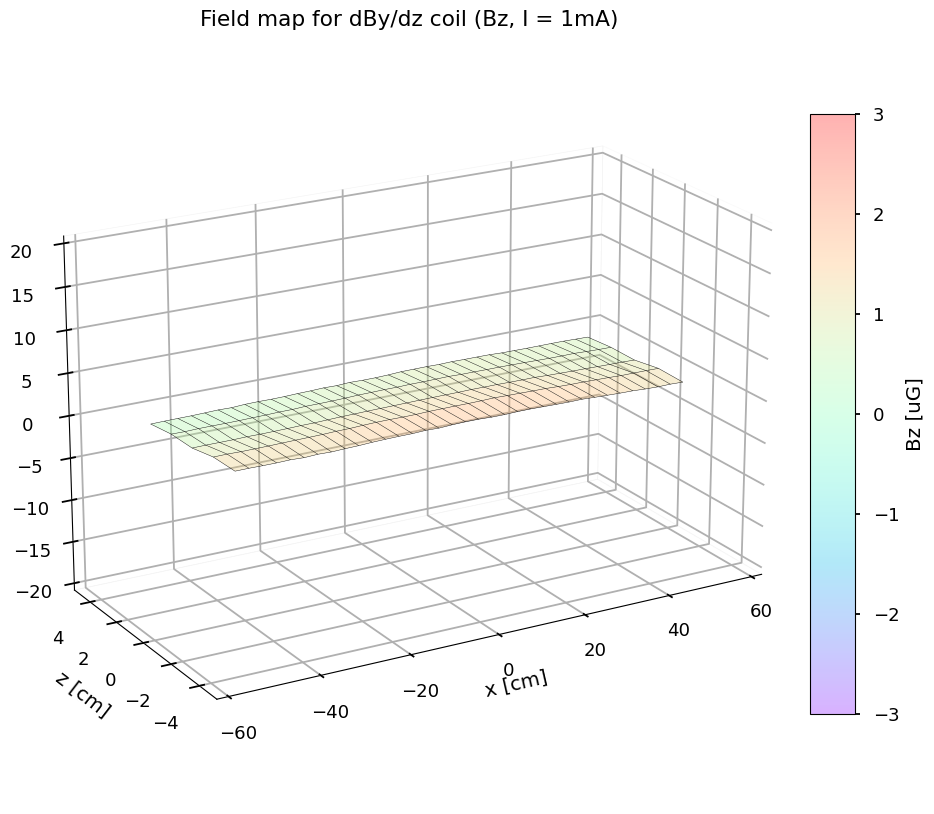

In [139]:
# Make a 3D field map on the x-z plane, for Bz

x, z = np.meshgrid(df_dBydz['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBydz['Bz1'], df_dBydz['Bz4'], df_dBydz['Bz2'], df_dBydz['Bz5'], df_dBydz['Bz3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -3, vmax = 3, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-20, 20)
# ax.set_zlabel('Bz [uG]', labelpad=10)
ax.set_title('Field map for dBy/dz coil (Bz, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'Bz [uG]')

# Save figure
plt.savefig('Graphs/dBydz_FieldMap_Bz.pdf', dpi=1000, transparent=True, bbox_inches='tight')

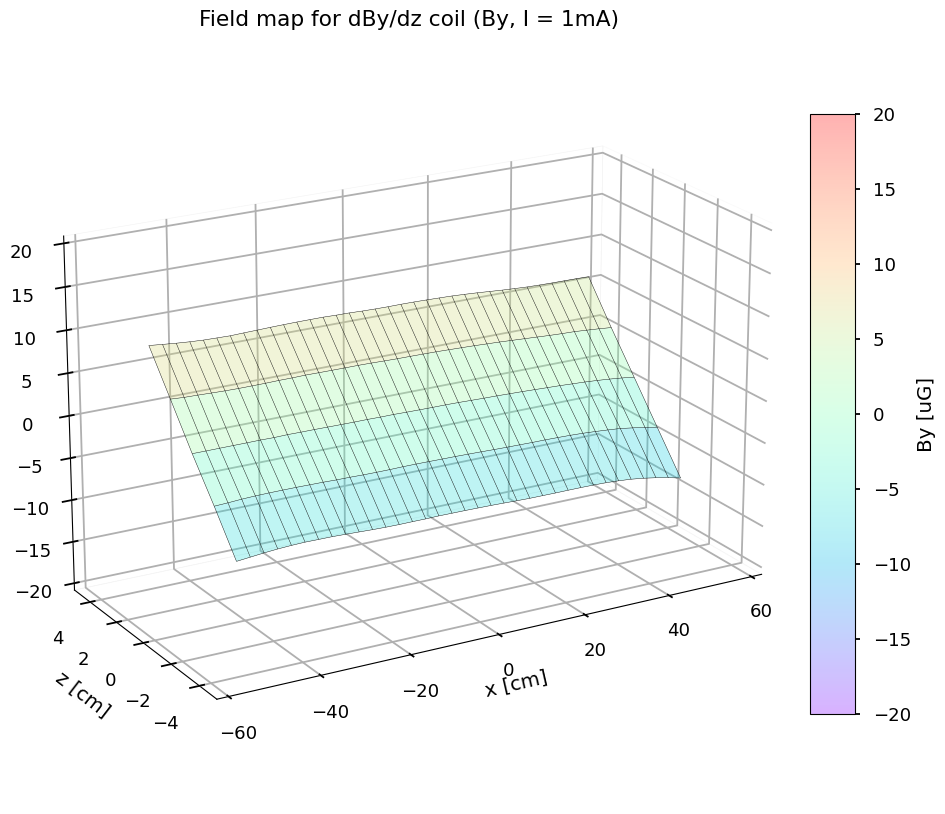

In [140]:
# Make a 3D field map on the x-z plane, for By

x, z = np.meshgrid(df_dBydz['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBydz['By1'], df_dBydz['By4'], df_dBydz['By2'], df_dBydz['By5'], df_dBydz['By3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -20, vmax = 20, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-20, 20)
# ax.set_zlabel('Bz [uG]', labelpad=10)
ax.set_title('Field map for dBy/dz coil (By, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'By [uG]')

# Save figure
plt.savefig('Graphs/dBydz_FieldMap_By.pdf', dpi=1000, transparent=True, bbox_inches='tight')

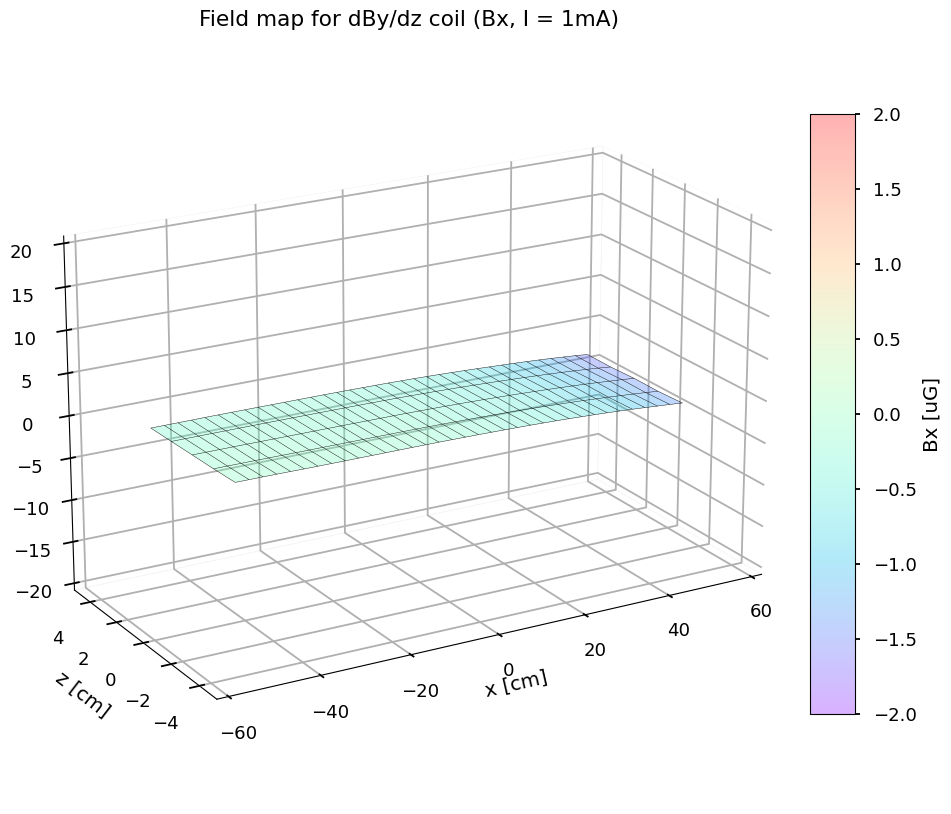

In [141]:
# Make a 3D field map on the x-z plane, for Bx

x, z = np.meshgrid(df_dBydz['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBydz['Bx1'], df_dBydz['Bx4'], df_dBydz['Bx2'], df_dBydz['Bx5'], df_dBydz['Bx3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -2, vmax = 2, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-20, 20)
# ax.set_zlabel('Bz [uG]', labelpad=10)
ax.set_title('Field map for dBy/dz coil (Bx, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'Bx [uG]')

# Save figure
plt.savefig('Graphs/dBydz_FieldMap_Bx.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the field on the beamline and compare with simulations

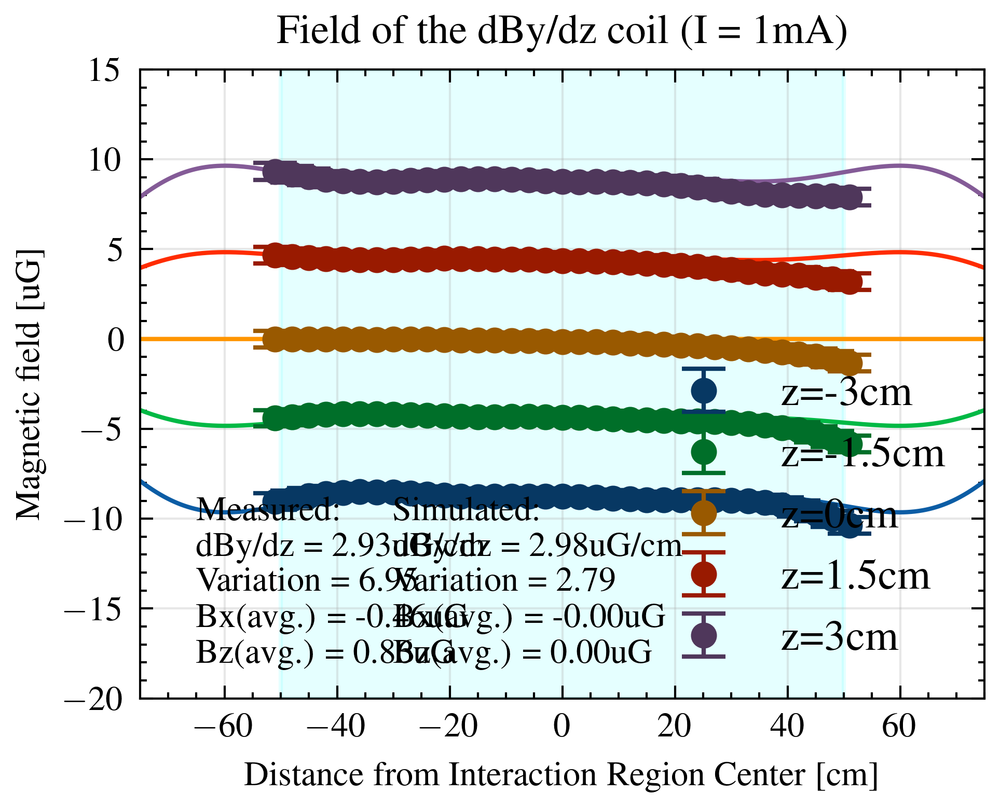

In [44]:
# Plot the fields for different z
dBydz_error = B_field_error(df_dBydz)
dBydz_sim = np.gradient(dBydz_coil_Y[:,600])/0.1
plt.plot(x_sim[0], dBydz_coil_Y[20], '-', color = 'C0')
plt.plot(x_sim[0], dBydz_coil_Y[35], '-', color = 'C1')
plt.plot(x_sim[0], dBydz_coil_Y[50], '-', color = 'C2')
plt.plot(x_sim[0], dBydz_coil_Y[65], '-', color = 'C3')
plt.plot(x_sim[0], dBydz_coil_Y[80], '-', color = 'C4')
plt.errorbar(df_dBzdz['dist'], df_dBydz['By3'], yerr=dBydz_error['By3'], fmt='o', ms=5, capsize=5, capthick=1, label = 'z=-3cm', color = darken_color(0))
plt.errorbar(df_dBzdz['dist'], df_dBydz['By5'], yerr=dBydz_error['By5'], fmt='o', ms=5, capsize=5, capthick=1, label = 'z=-1.5cm', color = darken_color(1))
plt.errorbar(df_dBzdz['dist'], df_dBydz['By2'], yerr=dBydz_error['By2'], fmt='o', ms=5, capsize=5, capthick=1, label = 'z=0cm', color = darken_color(2))
plt.errorbar(df_dBzdz['dist'], df_dBydz['By4'], yerr=dBydz_error['By4'], fmt='o', ms=5, capsize=5, capthick=1, label = 'z=1.5cm', color = darken_color(3))
plt.errorbar(df_dBzdz['dist'], df_dBydz['By1'], yerr=dBydz_error['By1'], fmt='o', ms=5, capsize=5, capthick=1, label = 'z=3cm', color = darken_color(4))

plot_text = 'Measured:\ndBy/dz = {:.2f}uG/cm\nVariation = {:.2f}%\nBx(avg.) = {:.2f}uG\nBz(avg.) = {:.2f}uG'.format(np.mean(df_dBydz['dBydz']), 
                                                                                                          (np.max(df_dBydz['dBydz'])-np.min(df_dBydz['dBydz']))/np.mean(df_dBydz['dBydz'])*100,
                                                                                                          np.mean(df_dBydz['Bx2']),
                                                                                                          np.mean(df_dBydz['Bz2']))
sim_text = 'Simulated:\ndBy/dz = {:.2f}uG/cm\nVariation = {:.2f}%\nBx(avg.) = {:.2f}uG\nBz(avg.) = {:.2f}uG'.format(np.mean(dBydz_sim), 
                                                                                                          (np.max(dBydz_sim)-np.min(dBydz_sim))/np.mean(dBydz_sim)*100,
                                                                                                          np.mean(dBydz_coil_X[50]),
                                                                                                          np.mean(dBydz_coil_Z[50]))

plt.legend(loc = 'lower right', fontsize = 10)
plt.xlabel('Distance from Interaction Region Center [cm]')
plt.ylabel('Magnetic field [uG]')
plt.title('Field of the dBy/dz coil (I = 1mA)')
plt.xlim(-75, 75)
plt.ylim(-20, 15)
# plt.ylim(195, 205)

plt.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
plt.text(-65, -18, plot_text)
plt.text(-30, -18, sim_text)
plt.grid(alpha = 0.3)

# Save Figure. Check each time!
# plt.savefig('Graphs/dBydz_Beamline.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the gradients

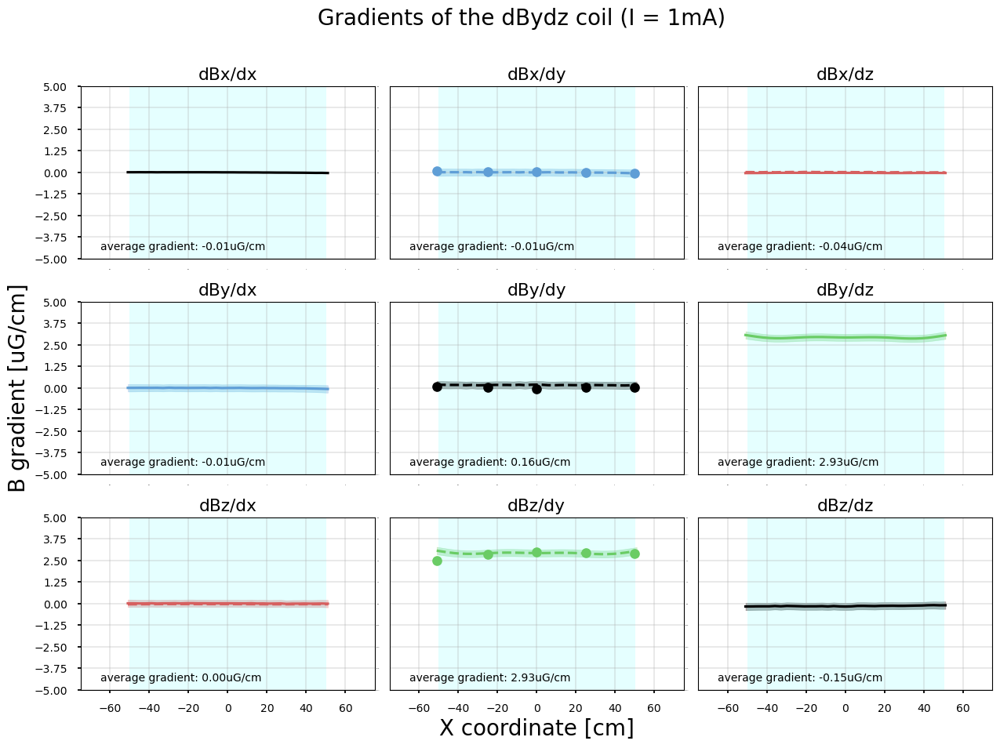

In [149]:
# Plot gradients
fig, axs = plt.subplots(3, 3, figsize=(15, 10))
plt.subplots_adjust(wspace=0.05, hspace=0.25)

x = df_dBydz['dist']
ys = [df_dBydz['dBxdx'], df_dBydz['dBydx'], df_dBydz['dBxdz'],
    df_dBydz['dBydx'], df_dBydz['dBydy'], df_dBydz['dBydz'],
    df_dBydz['dBzdx'], df_dBydz['dBydz'], df_dBydz['dBzdz']]

axs[0, 0].plot(df_dBydz['dist'], df_dBydz['dBxdx'], label = 'dBxdx', color = 'black')
axs[0, 0].fill_between(df_dBydz['dist'], df_dBydz['dBxdx'] - dBydz_error['dBxdx2'], df_dBydz['dBxdx'] + dBydz_error['dBxdx2'], alpha = 0.3, color = 'black')
axs[0, 1].plot(df_dBydz['dist'], df_dBydz['dBydx'], '--', label = 'dBxdy', color = '#5F9ED6')
axs[0, 1].fill_between(df_dBydz['dist'], df_dBydz['dBydx'] - dBydz_error['dBydx2'], df_dBydz['dBydx'] + dBydz_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[0, 2].plot(df_dBydz['dist'], df_dBydz['dBxdz'], label = 'dBxdz', color = '#D65F5F')
axs[0, 2].fill_between(df_dBydz['dist'], df_dBydz['dBxdz'] - dBydz_error['dBxdz'], df_dBydz['dBxdz'] + dBydz_error['dBxdz'], alpha = 0.3, color = '#D65F5F')
axs[0, 2].plot(df_dBydz['dist'], df_dBydz['dBzdx'], '--', label = 'dBzdx', color = '#D65F5F')

axs[1, 0].plot(df_dBydz['dist'], df_dBydz['dBydx'], label = 'dBxdy', color = '#5F9ED6')
axs[1, 0].fill_between(df_dBydz['dist'], df_dBydz['dBydx'] - dBydz_error['dBydx2'], df_dBydz['dBydx'] + dBydz_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[1, 1].plot(df_dBydz['dist'], df_dBydz['dBydy'], '--', label = 'dBydy', color = 'black')
axs[1, 1].fill_between(df_dBydz['dist'], df_dBydz['dBydy'] - dBydz_error['dBydy'], df_dBydz['dBydy'] + dBydz_error['dBydy'], alpha = 0.3, color = 'black')
axs[1, 2].plot(df_dBydz['dist'], df_dBydz['dBydz'], label = 'dBydz', color = '#6ACC65')
axs[1, 2].fill_between(df_dBydz['dist'], df_dBydz['dBydz'] - dBydz_error['dBydz'], df_dBydz['dBydz'] + dBydz_error['dBydz'], alpha = 0.3, color = '#6ACC65')

axs[2, 0].plot(df_dBydz['dist'], df_dBydz['dBzdx'], label = 'dBzdx', color = '#D65F5F')
axs[2, 0].fill_between(df_dBydz['dist'], df_dBydz['dBzdx'] - dBydz_error['dBzdx2'], df_dBydz['dBzdx'] + dBydz_error['dBzdx2'], alpha = 0.3, color = '#D65F5F')
axs[2, 0].plot(df_dBydz['dist'], df_dBydz['dBxdz'], '--', label = 'dBxdz', color = '#D65F5F')
axs[2, 1].plot(df_dBydz['dist'], df_dBydz['dBydz'], '--', label = 'dBydz', color = '#6ACC65')
axs[2, 1].fill_between(df_dBydz['dist'], df_dBydz['dBydz'] - dBydz_error['dBydz'], df_dBydz['dBydz'] + dBydz_error['dBydz'], alpha = 0.3, color = '#6ACC65')
axs[2, 2].plot(df_dBydz['dist'], df_dBydz['dBzdz'], label = 'dBzdz', color = 'black')
axs[2, 2].fill_between(df_dBydz['dist'], df_dBydz['dBzdz'] - dBydz_error['dBzdz'], df_dBydz['dBzdz'] + dBydz_error['dBzdz'], alpha = 0.3, color = 'black')

for ax, y in zip(axs.flat, ys):
    ax.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
    ax.set_ylim(-5, 5);
    ax.set_xlim(-75, 75);
    ax.set_yticks([-5,-3.75,-2.5,-1.25,0,1.25,2.5,3.75,5]);
    ax.set_xticks([-60,-40,-20,0,20,40,60]);
    ax.tick_params(axis='both', which='both', length=0, labelsize=0);
    ax.grid(alpha=0.3)
    max_value = np.max(np.abs(y))
    mean_value = np.mean(y)
    ax.text(-65, -4.5, f'average gradient: {mean_value:.2f}uG/cm')

dBdy_x_coor = [-51, -25, 0, 25, 50]
dBxdy_add_By = [ 0.06070741,  0.03620517,  0.05165182, -0.00916581, -0.04141574]
dBydy_add_By = [ 0.07456642,  0.01902734, -0.06875067,  0.01064833,  0.0076774 ]
dBzdy_add_By = [2.48546709, 2.84089526, 2.98889398, 2.92257869, 2.91304795]
axs[0, 1].plot(dBdy_x_coor, dBxdy_add_By, 'o', color = '#5F9ED6')
axs[1, 1].plot(dBdy_x_coor, dBydy_add_By, 'o', color = 'black')
axs[2, 1].plot(dBdy_x_coor, dBzdy_add_By, 'o', color = '#6ACC65')

axs[0, 0].set_title('dBx/dx')
axs[0, 1].set_title('dBx/dy')
axs[0, 2].set_title('dBx/dz')
axs[1, 0].set_title('dBy/dx')
axs[1, 1].set_title('dBy/dy')
axs[1, 2].set_title('dBy/dz')
axs[2, 0].set_title('dBz/dx')
axs[2, 1].set_title('dBz/dy')
axs[2, 2].set_title('dBz/dz')

axs[0,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[2,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].set_ylabel('B gradient [uG/cm]', fontsize=20);
axs[2,0].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,2].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].set_xlabel('X coordinate [cm]', fontsize=20);


fig.suptitle('Gradients of the dBydz coil (I = 1mA)', fontsize=20)

# Save Figure. Check each time!
plt.savefig('Graphs/dBydz_Gradients.pdf', dpi=1000, transparent=True, bbox_inches='tight')

# dBz/dx

## import and process the data

In [45]:
# Import the data
df = pd.read_csv('Field Data/dBzdx_field.csv', sep=',', header=None)

df.columns = ['dist', 'current', 
         'Mag1Bx', 'Mag1By', 'Mag1Bz', 
         'Mag2Bx', 'Mag2By', 'Mag2Bz', 
         'Mag3Bx', 'Mag3By', 'Mag3Bz', 
         'Mag4Bx', 'Mag4By', 'Mag4Bz', 
         'Mag5Bx', 'Mag5By', 'Mag5Bz']
# df = df.sort_values(by=['dist']).reset_index(drop=True)

# Figure out the current we actually need to apply
dBzdx_target = 200 # uG/cm
dBzdx_measured = (df['Mag2Bx'][18] - df['Mag2Bx'][16]) / 6
dBzdx_current_measured = df['current'][17] / 2
dBzdx_current_target = dBzdx_target * dBzdx_current_measured / dBzdx_measured

# Normalize the fields to unit current values
# Redo calibration
# Bx -> 0.9548 * Bx
# By -> 1 * By
# Bz -> [0.9107, 1.1095, 1.1023, 0.9187, 1.0880] * Bz
# Transform to ACME coordinates
# sensor -> ACME
# x -> z
# y -> -y
# z -> x
df['Bz1'] = df['Mag1Bx']/np.mean(df['current']) * 954.8 * 2  * 256.641 / 248.253
df['By1'] = -df['Mag1By']/np.mean(df['current']) * 1000 * 2 * 77.1887 / 78.46
df['Bx1'] = df['Mag1Bz']/np.mean(df['current']) * 910.7 * 2
df['Bz2'] = df['Mag2Bx']/np.mean(df['current']) * 954.8 * 2 * 256.641 / 248.253
df['By2'] = -df['Mag2By']/np.mean(df['current']) * 1000 * 2 * 77.1887 / 78.46
df['Bx2'] = df['Mag2Bz']/np.mean(df['current']) * 1109.5 * 2
df['Bz3'] = df['Mag3Bx']/np.mean(df['current']) * 954.8 * 2 * 256.641 / 248.253
df['By3'] = -df['Mag3By']/np.mean(df['current']) * 1000 * 2 * 77.1887 / 78.46
df['Bx3'] = df['Mag3Bz']/np.mean(df['current']) * 1102.3 * 2
df['Bz4'] = df['Mag4Bx']/np.mean(df['current']) * 954.8 * 2 * 256.641 / 248.253
df['By4'] = -df['Mag4By']/np.mean(df['current']) * 1000 * 2 * 77.1887 / 78.46
df['Bx4'] = df['Mag4Bz']/np.mean(df['current']) * 918.7 * 2
df['Bz5'] = df['Mag5Bx']/np.mean(df['current']) * 954.8 * 2 * 256.641 / 248.253
df['By5'] = -df['Mag5By']/np.mean(df['current']) * 1000 * 2 * 77.1887 / 78.46
df['Bx5'] = df['Mag5Bz']/np.mean(df['current']) * 1088.0 * 2

# Align measurements on mag4 and Mag5 to same x location.
df['Bx4'][0:35] = df['Bx4'][5:]
df['By4'][0:35] = df['By4'][5:]
df['Bz4'][0:35] = df['Bz4'][5:]
df['Bx5'][0:35] = df['Bx5'][5:]
df['By5'][0:35] = df['By5'][5:]
df['Bz5'][0:35] = df['Bz5'][5:]
df_dBzdx = df.iloc[0:35,:]

print(dBzdx_current_target)

58105.645161290326


In [46]:
# Calculate the gradients
# dBdz gradients
df_dBzdx['dBzdz12'] = (df_dBzdx['Bz1'] - df_dBzdx['Bz2']) / 3
df_dBzdx['dBydz12'] = (df_dBzdx['By1'] - df_dBzdx['By2']) / 3
df_dBzdx['dBxdz12'] = (df_dBzdx['Bx1'] - df_dBzdx['Bx2']) / 3
df_dBzdx['dBzdz23'] = (df_dBzdx['Bz2'] - df_dBzdx['Bz3']) / 3
df_dBzdx['dBydz23'] = (df_dBzdx['By2'] - df_dBzdx['By3']) / 3
df_dBzdx['dBxdz23'] = (df_dBzdx['Bx2'] - df_dBzdx['Bx3']) / 3
df_dBzdx['dBzdz'] = (df_dBzdx['dBzdz12'] + df_dBzdx['dBzdz23']) / 2
df_dBzdx['dBydz'] = (df_dBzdx['dBydz12'] + df_dBzdx['dBydz23']) / 2
df_dBzdx['dBxdz'] = (df_dBzdx['dBxdz12'] + df_dBzdx['dBxdz23']) / 2
df_dBzdx['dBxdz'] = df_dBzdx['dBxdz23']
# dBdx gradients
df_dBzdx['dBzdx1'] = df_dBzdx['Bz1'].diff() / 3
df_dBzdx['dBydx1'] = df_dBzdx['By1'].diff() / 3
df_dBzdx['dBxdx1'] = df_dBzdx['Bx1'].diff() / 3
df_dBzdx['dBzdx1'][0] = df_dBzdx['dBzdx1'][1]
df_dBzdx['dBydx1'][0] = df_dBzdx['dBydx1'][1]
df_dBzdx['dBxdx1'][0] = df_dBzdx['dBxdx1'][1]
df_dBzdx['dBzdx2'] = df_dBzdx['Bz2'].diff() / 3
df_dBzdx['dBydx2'] = df_dBzdx['By2'].diff() / 3
df_dBzdx['dBxdx2'] = df_dBzdx['Bx2'].diff() / 3
df_dBzdx['dBzdx2'][0] = df_dBzdx['dBzdx2'][1]
df_dBzdx['dBydx2'][0] = df_dBzdx['dBydx2'][1]
df_dBzdx['dBxdx2'][0] = df_dBzdx['dBxdx2'][1]
df_dBzdx['dBzdx3'] = df_dBzdx['Bz3'].diff() / 3
df_dBzdx['dBydx3'] = df_dBzdx['By3'].diff() / 3
df_dBzdx['dBxdx3'] = df_dBzdx['Bx3'].diff() / 3
df_dBzdx['dBzdx3'][0] = df_dBzdx['dBzdx3'][1]
df_dBzdx['dBydx3'][0] = df_dBzdx['dBydx3'][1]
df_dBzdx['dBxdx3'][0] = df_dBzdx['dBxdx3'][1]
df_dBzdx['dBzdx'] = (df_dBzdx['dBzdx1'] + df_dBzdx['dBzdx2'] + df_dBzdx['dBzdx3']) / 3
df_dBzdx['dBydx'] = (df_dBzdx['dBydx1'] + df_dBzdx['dBydx2'] + df_dBzdx['dBydx3']) / 3
df_dBzdx['dBxdx'] = (df_dBzdx['dBxdx1'] + df_dBzdx['dBxdx2'] + df_dBzdx['dBxdx3']) / 3
#dBydy gradient
df_dBzdx['dBydy1'] = - (df_dBzdx['dBxdx1'] + df_dBzdx['dBzdz12'])
df_dBzdx['dBydy2'] = - (df_dBzdx['dBxdx2'] + df_dBzdx['dBzdz12'])
df_dBzdx['dBydy3'] = - (df_dBzdx['dBxdx2'] + df_dBzdx['dBzdz23'])
df_dBzdx['dBydy4'] = - (df_dBzdx['dBxdx3'] + df_dBzdx['dBzdz23'])
df_dBzdx['dBydy'] = (df_dBzdx['dBydy1'] + df_dBzdx['dBydy2'] + df_dBzdx['dBydy3'] + df_dBzdx['dBydy4']) / 4

# Calculate the maximum range of the field in the interaction region
# Bz_max = df_Bz[['Bz1', 'Bz2', 'Bz3']].max() 
# Bz_min = df_Bz[['Bz1', 'Bz2', 'Bz3']].min()
# delta_Bz = Bz_max.max() - Bz_min.min()

/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/1360338258.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dBzdx['dBzdz12'] = (df_dBzdx['Bz1'] - df_dBzdx['Bz2']) / 3
/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/1360338258.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dBzdx['dBydz12'] = (df_dBzdx['By1'] - df_dBzdx['By2']) / 3
/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/1360338258.py:5: SettingWithCopyWarning: 
A value is trying to be s

## Plot the field maps

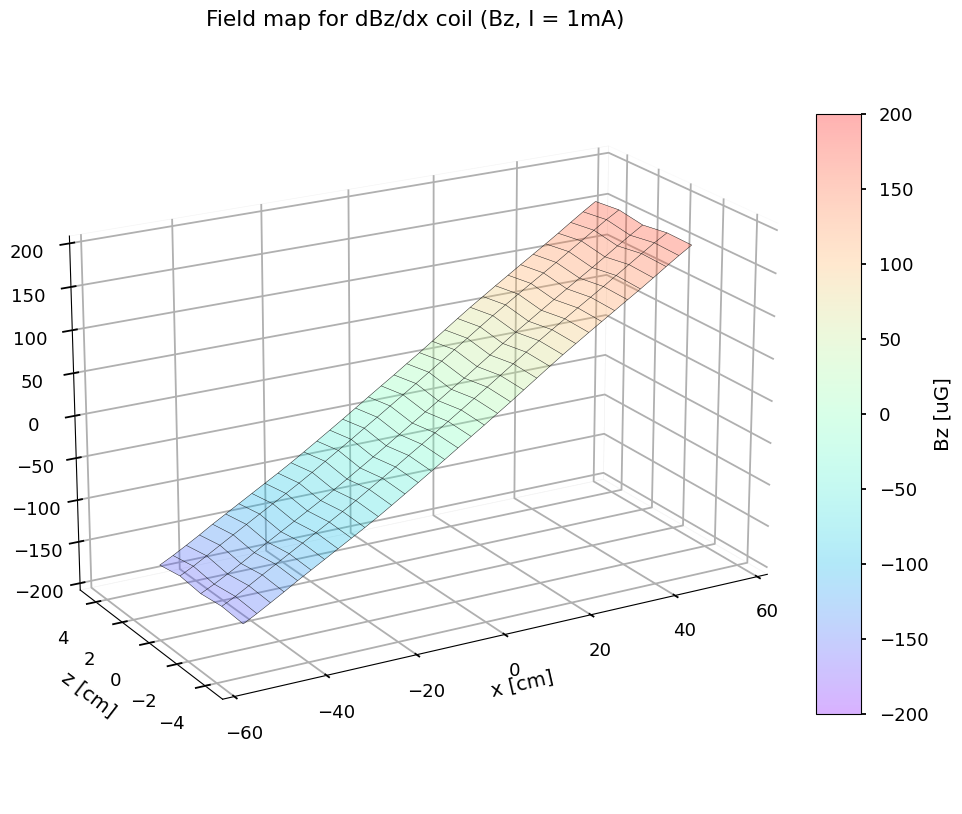

In [152]:
# Make a 3D field map on the x-z plane, for Bz

x, z = np.meshgrid(df_dBydz['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBzdx['Bz1'], df_dBzdx['Bz4'], df_dBzdx['Bz2'], df_dBzdx['Bz5'], df_dBzdx['Bz3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -200, vmax = 200, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-200, 200)
# ax.set_zlabel('Bz [uG]', labelpad=10)
ax.set_title('Field map for dBz/dx coil (Bz, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'Bz [uG]')

# Save figure
plt.savefig('Graphs/dBzdx_FieldMap_Bz.pdf', dpi=1000, transparent=True, bbox_inches='tight')

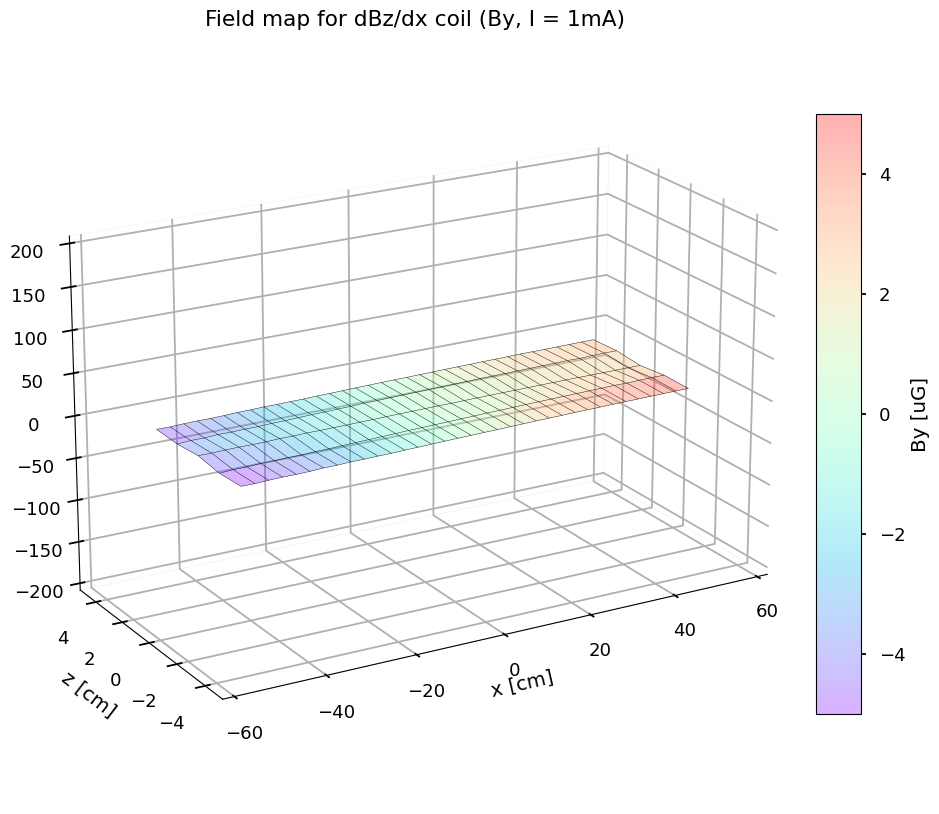

In [153]:
# Make a 3D field map on the x-z plane, for By

x, z = np.meshgrid(df_dBydz['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBzdx['By1'], df_dBzdx['By4'], df_dBzdx['By2'], df_dBzdx['By5'], df_dBzdx['By3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -5, vmax = 5, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-200, 200)
# ax.set_zlabel('By [uG]', labelpad=10)
ax.set_title('Field map for dBz/dx coil (By, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'By [uG]')

# Save figure
plt.savefig('Graphs/dBzdx_FieldMap_By.pdf', dpi=1000, transparent=True, bbox_inches='tight')

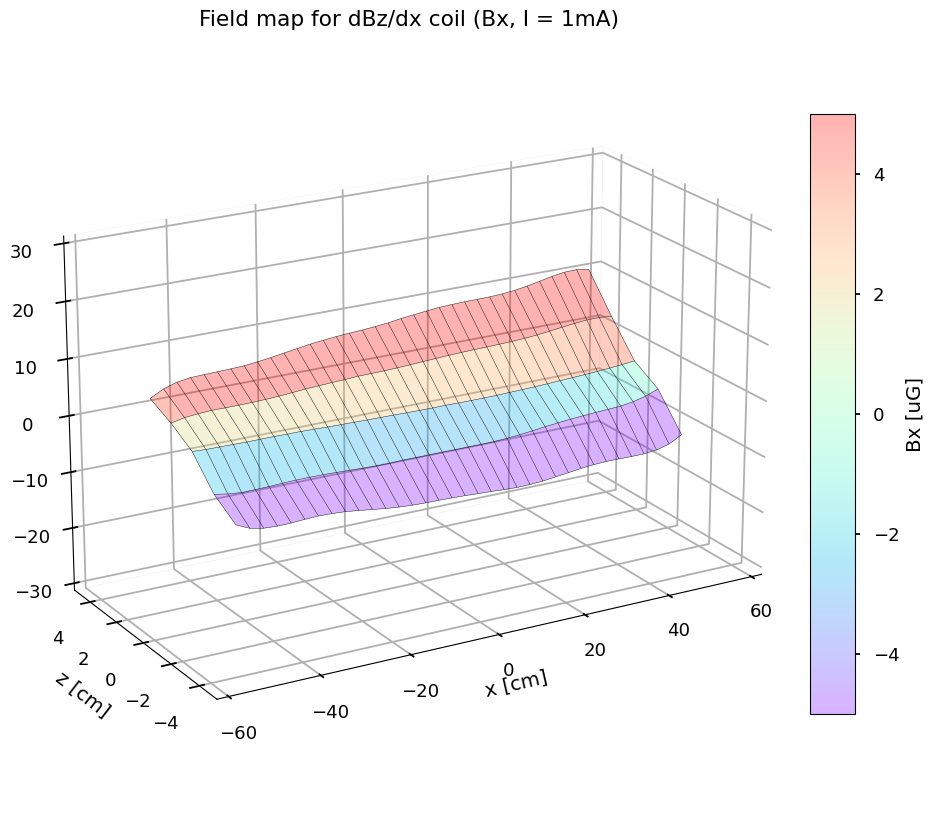

In [154]:
# Make a 3D field map on the x-z plane, for Bx

x, z = np.meshgrid(df_dBydz['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBzdx['Bx1'], df_dBzdx['Bx4'], df_dBzdx['Bx2'], df_dBzdx['Bx5'], df_dBzdx['Bx3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -5, vmax = 5, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-30, 30)
# ax.set_zlabel('By [uG]', labelpad=10)
ax.set_title('Field map for dBz/dx coil (Bx, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'Bx [uG]')

# Save figure
plt.savefig('Graphs/dBzdx_FieldMap_Bx.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the field on the beamline and compare with simulations

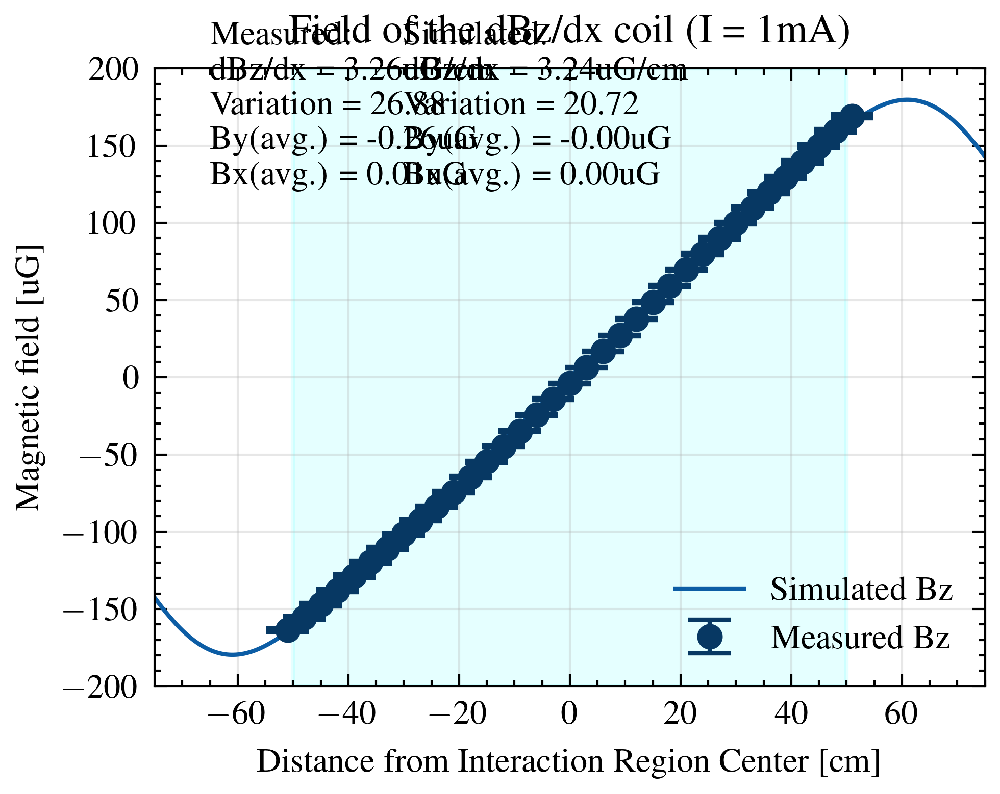

In [47]:
# Plot fields on the beamline
z_probe = 0 
z_index = 10 * z_probe - 50
dBzdx_error = B_field_error(df_dBzdx)
dBzdx_sim = np.gradient(dBzdx_coil_Z[z_index,250:1250])/0.1

plt.plot(x_sim[0], dBzdx_coil_Z[z_index], '-', label = 'Simulated Bz')
plt.errorbar(df_dBzdx['dist'], df_dBzdx['Bz2'], fmt='o', yerr = dBzdx_error['Bz2'], ms=5, capthick=1, capsize=5, label = 'Measured Bz', color = darken_color(0))

plt.legend(loc = 'lower right')
plt.xlabel('Distance from Interaction Region Center [cm]')
plt.ylabel('Magnetic field [uG]')
plt.title('Field of the dBz/dx coil (I = 1mA)')
plt.xlim(-75, 75)
plt.ylim(-200, 200)

plot_text = 'Measured:\ndBz/dx = {:.2f}uG/cm\nVariation = {:.2f}%\nBy(avg.) = {:.2f}uG\nBx(avg.) = {:.2f}uG'.format(np.mean(df_dBzdx['dBzdx']), 
                                                                                                          (np.max(df_dBzdx['dBzdx'])-np.min(df_dBzdx['dBzdx']))/np.mean(df_dBzdx['dBzdx'])*100,
                                                                                                          np.mean(df_dBzdx['By2']),
                                                                                                          np.mean(df_dBzdx['Bx2']))
sim_text = 'Simulated:\ndBz/dx = {:.2f}uG/cm\nVariation = {:.2f}%\nBy(avg.) = {:.2f}uG\nBx(avg.) = {:.2f}uG'.format(np.mean(dBzdx_sim), 
                                                                                                          (np.max(dBzdx_sim)-np.min(dBzdx_sim))/np.mean(dBzdx_sim)*100,
                                                                                                          np.mean(dBzdx_coil_Y[50]),
                                                                                                          np.mean(dBzdx_coil_X[50]))
plt.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
plt.text(-65, 125, plot_text)
plt.text(-30, 125, sim_text)
plt.grid(alpha = 0.3)

# Save Figure. Check each time!
# plt.savefig('Graphs/dBzdx_Beamline.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the gradients

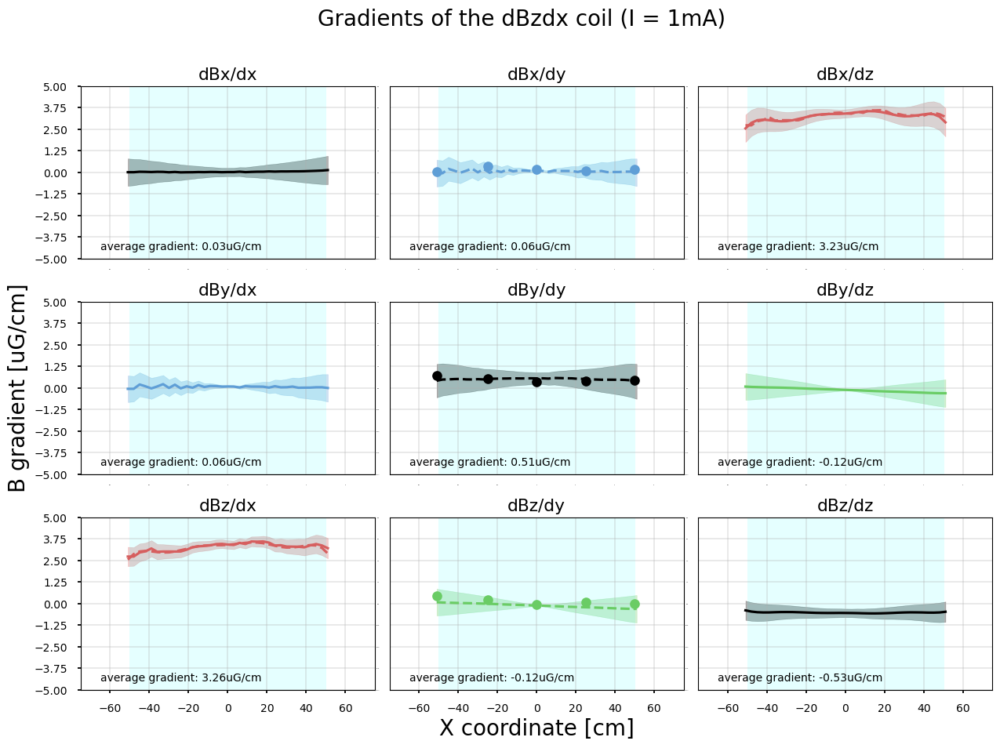

In [157]:
# Plot gradients
fig, axs = plt.subplots(3, 3, figsize=(15, 10))
plt.subplots_adjust(wspace=0.05, hspace=0.25)

x = df_dBzdx['dist']
ys = [df_dBzdx['dBxdx'], df_dBzdx['dBydx'], df_dBzdx['dBxdz'],
    df_dBzdx['dBydx'], df_dBzdx['dBydy'], df_dBzdx['dBydz'],
    df_dBzdx['dBzdx'], df_dBzdx['dBydz'], df_dBzdx['dBzdz']]

axs[0, 0].plot(df_dBzdx['dist'], df_dBzdx['dBxdx'], label = 'dBzdx', color = 'black')
axs[0,0].fill_between(df_dBzdx['dist'], df_dBzdx['dBxdx'] - dBzdx_error['dBxdx2'], df_dBzdx['dBxdx'] + dBzdx_error['dBxdx2'], alpha = 0.3, color = 'black')
axs[0, 1].plot(df_dBzdx['dist'], df_dBzdx['dBydx'], '--', label = 'dBxdy', color = '#5F9ED6')
axs[0, 1].fill_between(df_dBzdx['dist'], df_dBzdx['dBydx'] - dBzdx_error['dBydx2'], df_dBzdx['dBydx'] + dBzdx_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[0, 2].plot(df_dBzdx['dist'], df_dBzdx['dBxdz'], label = 'dBxdz', color = '#D65F5F')
axs[0, 2].fill_between(df_dBzdx['dist'], df_dBzdx['dBxdz'] - dBzdx_error['dBxdz'], df_dBzdx['dBxdz'] + dBzdx_error['dBxdz'], alpha = 0.3, color = '#D65F5F')
axs[0, 2].plot(df_dBzdx['dist'], df_dBzdx['dBzdx'], '--', label = 'dBzdx', color = '#D65F5F')
axs[1, 0].plot(df_dBzdx['dist'], df_dBzdx['dBydx'], label = 'dBxdy', color = '#5F9ED6')
axs[1, 0].fill_between(df_dBzdx['dist'], df_dBzdx['dBydx'] - dBzdx_error['dBydx2'], df_dBzdx['dBydx'] + dBzdx_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[1, 1].plot(df_dBzdx['dist'], df_dBzdx['dBydy'], '--', label = 'dBydy', color = 'black')
axs[1, 1].fill_between(df_dBzdx['dist'], df_dBzdx['dBydy'] - dBzdx_error['dBydy'], df_dBzdx['dBydy'] + dBzdx_error['dBydy'], alpha = 0.3, color = 'black')
axs[1, 2].plot(df_dBzdx['dist'], df_dBzdx['dBydz'], label = 'dBydz', color = '#6ACC65')
axs[1, 2].fill_between(df_dBzdx['dist'], df_dBzdx['dBydz'] - dBzdx_error['dBydz'], df_dBzdx['dBydz'] + dBzdx_error['dBydz'], alpha = 0.3, color = '#6ACC65')
axs[2, 0].plot(df_dBzdx['dist'], df_dBzdx['dBzdx'], label = 'dBzdx', color = '#D65F5F')
axs[2, 0].fill_between(df_dBzdx['dist'], df_dBzdx['dBzdx'] - dBzdx_error['dBzdx2'], df_dBzdx['dBzdx'] + dBzdx_error['dBzdx2'], alpha = 0.3, color = '#D65F5F')
axs[2, 0].plot(df_dBzdx['dist'], df_dBzdx['dBxdz'], '--', label = 'dBxdz', color = '#D65F5F')
axs[2, 1].plot(df_dBzdx['dist'], df_dBzdx['dBydz'], '--', label = 'dBydz', color = '#6ACC65')
axs[2, 1].fill_between(df_dBzdx['dist'], df_dBzdx['dBydz'] - dBzdx_error['dBydz'], df_dBzdx['dBydz'] + dBzdx_error['dBydz'], alpha = 0.3, color = '#6ACC65')
axs[2, 2].plot(df_dBzdx['dist'], df_dBzdx['dBzdz'], label = 'dBzdz', color = 'black')
axs[2, 2].fill_between(df_dBzdx['dist'], df_dBzdx['dBzdz'] - dBzdx_error['dBzdz'], df_dBzdx['dBzdz'] + dBzdx_error['dBzdz'], alpha = 0.3, color = 'black')

for ax, y in zip(axs.flat, ys):
    ax.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
    ax.set_ylim(-5, 5);
    ax.set_xlim(-75, 75);
    ax.set_yticks([-5,-3.75,-2.5,-1.25,0,1.25,2.5,3.75,5]);
    ax.set_xticks([-60,-40,-20,0,20,40,60]);
    ax.tick_params(axis='both', which='both', length=0, labelsize=0);
    ax.grid(alpha=0.3)
    max_value = np.max(np.abs(y))
    mean_value = np.mean(y)
    ax.text(-65, -4.5, f'average gradient: {mean_value:.2f}uG/cm')

dBdy_x_coor = [-51, -25, 0, 25, 50]
dBxdy_add_By = [0.02947718, 0.34145963, 0.15005085, 0.0578456 , 0.15044824]
dBydy_add_By = [0.7043784 , 0.53006464, 0.36120263, 0.41485539, 0.44713411]
dBzdy_add_By = [ 0.44012749,  0.20523841, -0.05458464,  0.07904868, -0.02248277]
axs[0, 1].plot(dBdy_x_coor, dBxdy_add_By, 'o', color = '#5F9ED6')
axs[1, 1].plot(dBdy_x_coor, dBydy_add_By, 'o', color = 'black')
axs[2, 1].plot(dBdy_x_coor, dBzdy_add_By, 'o', color = '#6ACC65')

axs[0, 0].set_title('dBx/dx')
axs[0, 1].set_title('dBx/dy')
axs[0, 2].set_title('dBx/dz')
axs[1, 0].set_title('dBy/dx')
axs[1, 1].set_title('dBy/dy')
axs[1, 2].set_title('dBy/dz')
axs[2, 0].set_title('dBz/dx')
axs[2, 1].set_title('dBz/dy')
axs[2, 2].set_title('dBz/dz')

axs[0,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[2,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].set_ylabel('B gradient [uG/cm]', fontsize=20);
axs[2,0].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,2].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].set_xlabel('X coordinate [cm]', fontsize=20);

fig.suptitle('Gradients of the dBzdx coil (I = 1mA)', fontsize=20)

# Save Figure. Check each time!
plt.savefig('Graphs/dBzdx_Gradients.pdf', dpi=1000, transparent=True, bbox_inches='tight')

# Bx

## Import and process the data

In [19]:
# Import the data
df = pd.read_csv('Field Data/Bx_field.csv', sep=',', header=None)

df.columns = ['dist', 'current', 
         'Mag1Bx', 'Mag1By', 'Mag1Bz', 
         'Mag2Bx', 'Mag2By', 'Mag2Bz', 
         'Mag3Bx', 'Mag3By', 'Mag3Bz', 
         'Mag4Bx', 'Mag4By', 'Mag4Bz', 
         'Mag5Bx', 'Mag5By', 'Mag5Bz']
# df = df.sort_values(by=['dist']).reset_index(drop=True)

# Figure out the current we actually need to apply
Bx_target = 200 # uG/cm
Bx_measured = df['Mag2Bz'][17]
Bx_current_measured = df['current'][17]
Bx_current_target = Bx_target * Bx_current_measured / Bx_measured

# Normalize the fields to unit current values
# Redo calibration
# Bx -> 0.9548 * Bx
# By -> 1 * By
# Bz -> [0.9732, 0.9732, 0.9732, 0.9872, 0.9872] * Bz 
# Transform to ACME coordinates
# sensor -> ACME
# x -> z
# y -> -y
# z -> x
df['Bz1'] = df['Mag1Bx']/np.mean(df['current']) * 954.8  * 256.641 / 248.253
df['By1'] = -df['Mag1By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx1'] = df['Mag1Bz']/np.mean(df['current']) * 973.2 * 43.36 / 41.84
df['Bz2'] = df['Mag2Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By2'] = -df['Mag2By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx2'] = df['Mag2Bz']/np.mean(df['current']) * 973.2 * 43.36 / 41.84
df['Bz3'] = df['Mag3Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By3'] = -df['Mag3By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx3'] = df['Mag3Bz']/np.mean(df['current']) * 973.2 * 43.36 / 41.84
df['Bz4'] = df['Mag4Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By4'] = df['Mag4By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx4'] = df['Mag4Bz']/np.mean(df['current']) * 987.2 * 43.36 / 41.84
df['Bz5'] = df['Mag5Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By5'] = -df['Mag5By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx5'] = df['Mag5Bz']/np.mean(df['current']) * 987.2 * 43.36 / 41.84

# Align measurements on mag4 and Mag5 to same x location.
df['Bx4'][0:35] = df['Bx4'][5:]
df['By4'][0:35] = df['By4'][5:]
df['Bz4'][0:35] = df['Bz4'][5:]
df['Bx5'][0:35] = df['Bx5'][5:]
df['By5'][0:35] = df['By5'][5:]
df['Bz5'][0:35] = df['Bz5'][5:]
df_Bx = df.iloc[0:35,:]

print(Bx_current_target)

4665.555097412638


In [20]:
# Process the data 

# Calculate the gradients
# dBdz gradients
df_Bx['dBzdz12'] = (df_Bx['Bz1'] - df_Bx['Bz2']) / 3
df_Bx['dBydz12'] = (df_Bx['By1'] - df_Bx['By2']) / 3
df_Bx['dBxdz12'] = (df_Bx['Bx1'] - df_Bx['Bx2']) / 3
df_Bx['dBzdz23'] = (df_Bx['Bz2'] - df_Bx['Bz3']) / 3
df_Bx['dBydz23'] = (df_Bx['By2'] - df_Bx['By3']) / 3
df_Bx['dBxdz23'] = (df_Bx['Bx2'] - df_Bx['Bx3']) / 3
df_Bx['dBzdz'] = (df_Bx['dBzdz12'] + df_Bx['dBzdz23']) / 2
df_Bx['dBydz'] = (df_Bx['dBydz12'] + df_Bx['dBydz23']) / 2
df_Bx['dBxdz'] = (df_Bx['dBxdz12'] + df_Bx['dBxdz23']) / 2
# dBdx gradients
df_Bx['dBzdx1'] = df_Bx['Bz1'].diff() / 3
df_Bx['dBydx1'] = df_Bx['By1'].diff() / 3
df_Bx['dBxdx1'] = df_Bx['Bx1'].diff() / 3
df_Bx['dBzdx1'][0] = df_Bx['dBzdx1'][1]
df_Bx['dBydx1'][0] = df_Bx['dBydx1'][1]
df_Bx['dBxdx1'][0] = df_Bx['dBxdx1'][1]
df_Bx['dBzdx2'] = df_Bx['Bz2'].diff() / 3
df_Bx['dBydx2'] = df_Bx['By2'].diff() / 3
df_Bx['dBxdx2'] = df_Bx['Bx2'].diff() / 3
df_Bx['dBzdx2'][0] = df_Bx['dBzdx2'][1]
df_Bx['dBydx2'][0] = df_Bx['dBydx2'][1]
df_Bx['dBxdx2'][0] = df_Bx['dBxdx2'][1]
df_Bx['dBzdx3'] = df_Bx['Bz3'].diff() / 3
df_Bx['dBydx3'] = df_Bx['By3'].diff() / 3
df_Bx['dBxdx3'] = df_Bx['Bx3'].diff() / 3
df_Bx['dBzdx3'][0] = df_Bx['dBzdx3'][1]
df_Bx['dBydx3'][0] = df_Bx['dBydx3'][1]
df_Bx['dBxdx3'][0] = df_Bx['dBxdx3'][1]
df_Bx['dBzdx'] = (df_Bx['dBzdx1'] + df_Bx['dBzdx2'] + df_Bx['dBzdx3']) / 3
df_Bx['dBydx'] = (df_Bx['dBydx1'] + df_Bx['dBydx2'] + df_Bx['dBydx3']) / 3
df_Bx['dBxdx'] = (df_Bx['dBxdx1'] + df_Bx['dBxdx2'] + df_Bx['dBxdx3']) / 3
#dBydy gradient
df_Bx['dBydy1'] = - (df_Bx['dBxdx1'] + df_Bx['dBzdz12'])
df_Bx['dBydy2'] = - (df_Bx['dBxdx2'] + df_Bx['dBzdz12'])
df_Bx['dBydy3'] = - (df_Bx['dBxdx2'] + df_Bx['dBzdz23'])
df_Bx['dBydy4'] = - (df_Bx['dBxdx3'] + df_Bx['dBzdz23'])
df_Bx['dBydy'] = (df_Bx['dBydy1'] + df_Bx['dBydy2'] + df_Bx['dBydy3'] + df_Bx['dBydy4']) / 4

# Calculate the maximum range of the field in the interaction region
Bx_max = df_Bx[['Bz1', 'Bz2', 'Bz3']].max() 
Bx_min = df_Bx[['Bz1', 'Bz2', 'Bz3']].min()
delta_Bx = Bx_max.max() - Bx_min.min()

C:\Users\Gabrielse Group NU\AppData\Local\Temp\ipykernel_9848\3078804322.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Bx['dBzdz12'] = (df_Bx['Bz1'] - df_Bx['Bz2']) / 3
C:\Users\Gabrielse Group NU\AppData\Local\Temp\ipykernel_9848\3078804322.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Bx['dBydz12'] = (df_Bx['By1'] - df_Bx['By2']) / 3
C:\Users\Gabrielse Group NU\AppData\Local\Temp\ipykernel_9848\3078804322.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fro

## Plot the field maps

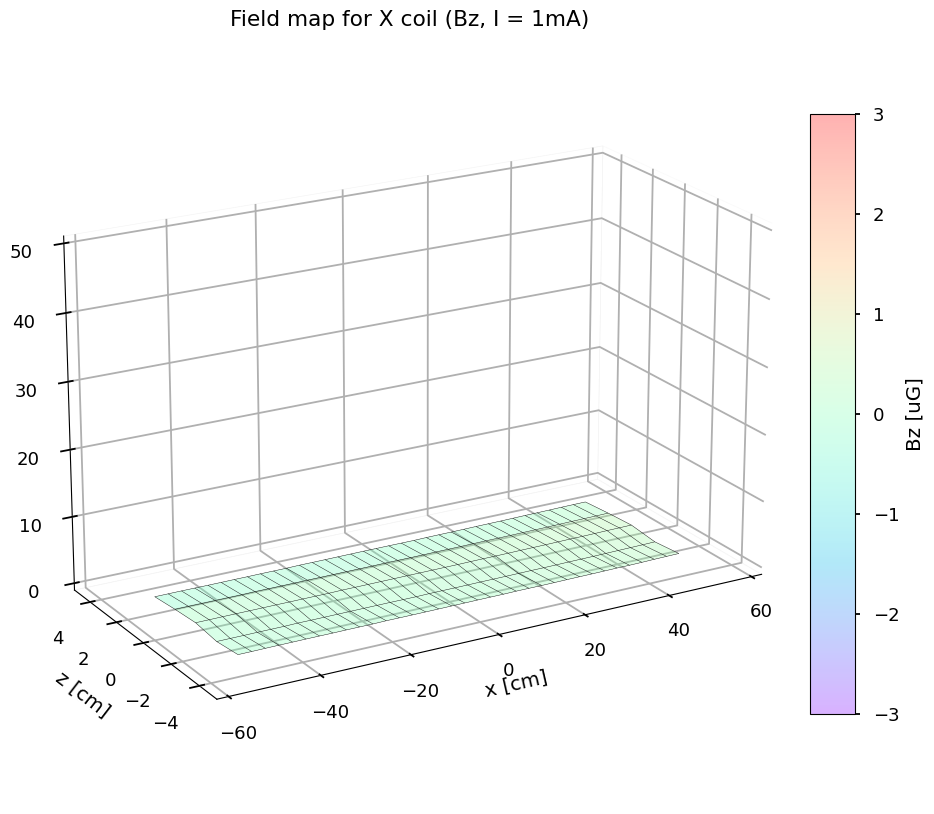

In [160]:
# Make a 3D field map on the x-z plane, for Bz

x, z = np.meshgrid(df_Bx['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_Bx['Bz1'], df_Bx['Bz4'], df_Bx['Bz2'], df_Bx['Bz5'], df_Bx['Bz3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -3, vmax = 3, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(0, 50)
# ax.set_zlabel('Bz [uG]', labelpad=10)
ax.set_title('Field map for X coil (Bz, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'Bz [uG]')

# Save figure
plt.savefig('Graphs/Xcoil_FieldMap_Bz.pdf', dpi=1000, transparent=True, bbox_inches='tight')

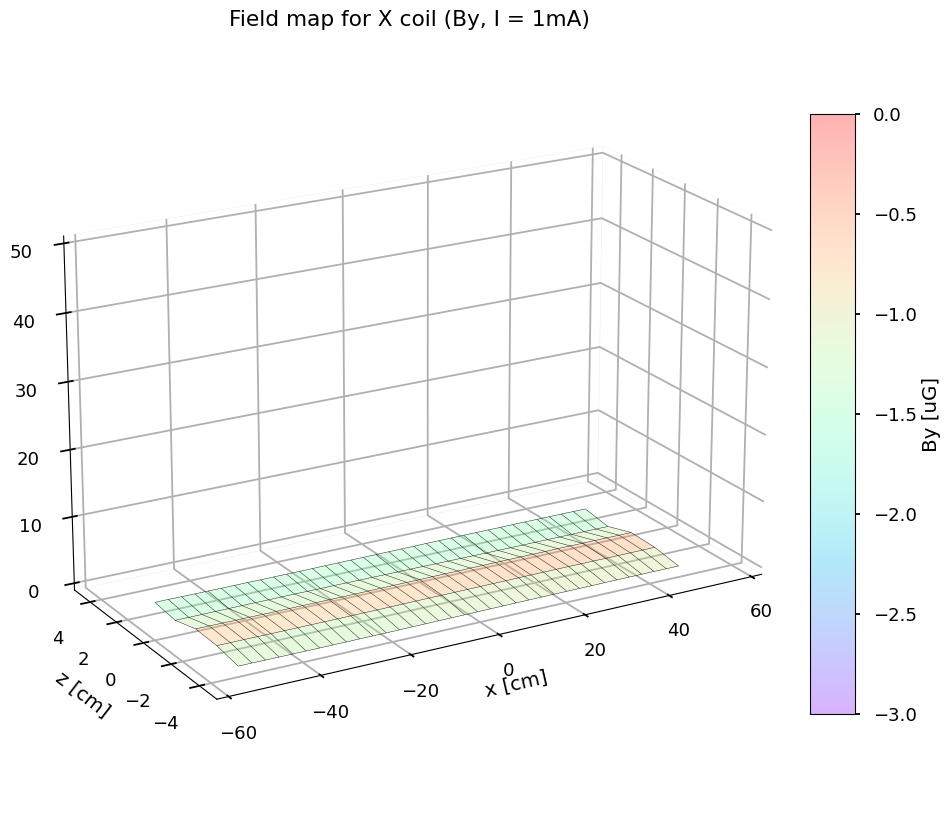

In [161]:
# Make a 3D field map on the x-z plane, for By

x, z = np.meshgrid(df_Bx['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_Bx['By1'], df_Bx['By4'], df_Bx['By2'], df_Bx['By5'], df_Bx['By3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -3, vmax = 0, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(0, 50)
# ax.set_zlabel('Bz [uG]', labelpad=10)
ax.set_title('Field map for X coil (By, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'By [uG]')

# Save figure
plt.savefig('Graphs/Xcoil_FieldMap_By.pdf', dpi=1000, transparent=True, bbox_inches='tight')

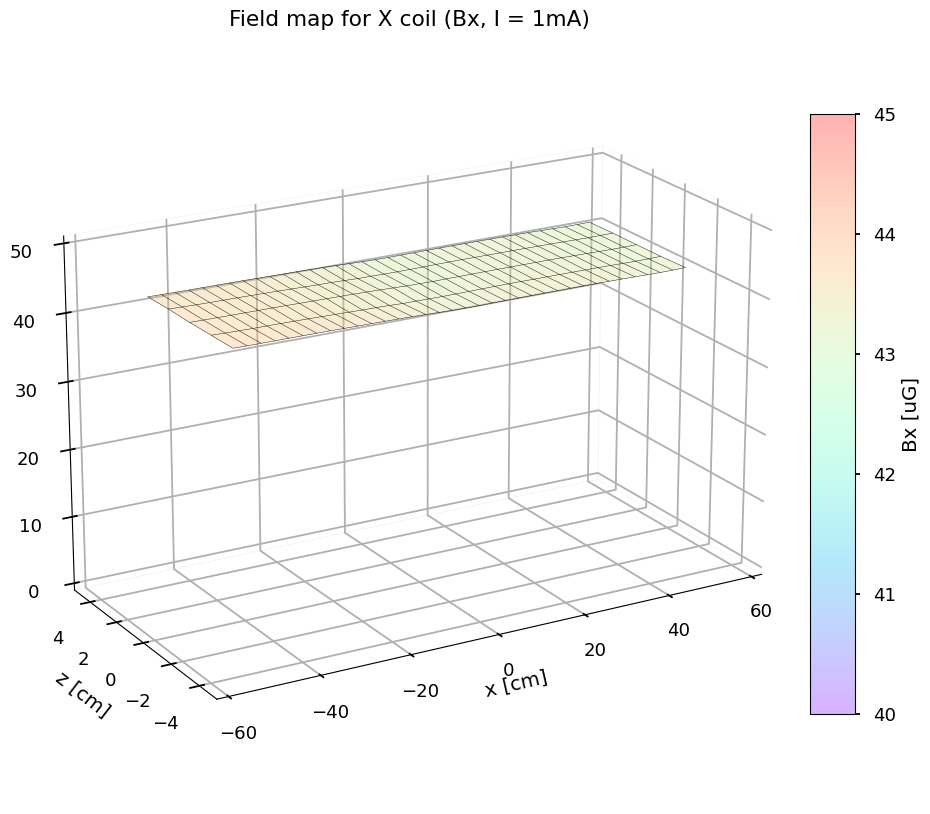

In [162]:
# Make a 3D field map on the x-z plane, for Bx

x, z = np.meshgrid(df_Bx['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_Bx['Bx1'], df_Bx['Bx4'], df_Bx['Bx2'], df_Bx['Bx5'], df_Bx['Bx3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = 40, vmax = 45, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(0, 50)
ax.set_title('Field map for X coil (Bx, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'Bx [uG]')

# Save figure
plt.savefig('Graphs/Xcoil_FieldMap_Bx.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the field on the beamline and compare with simulations

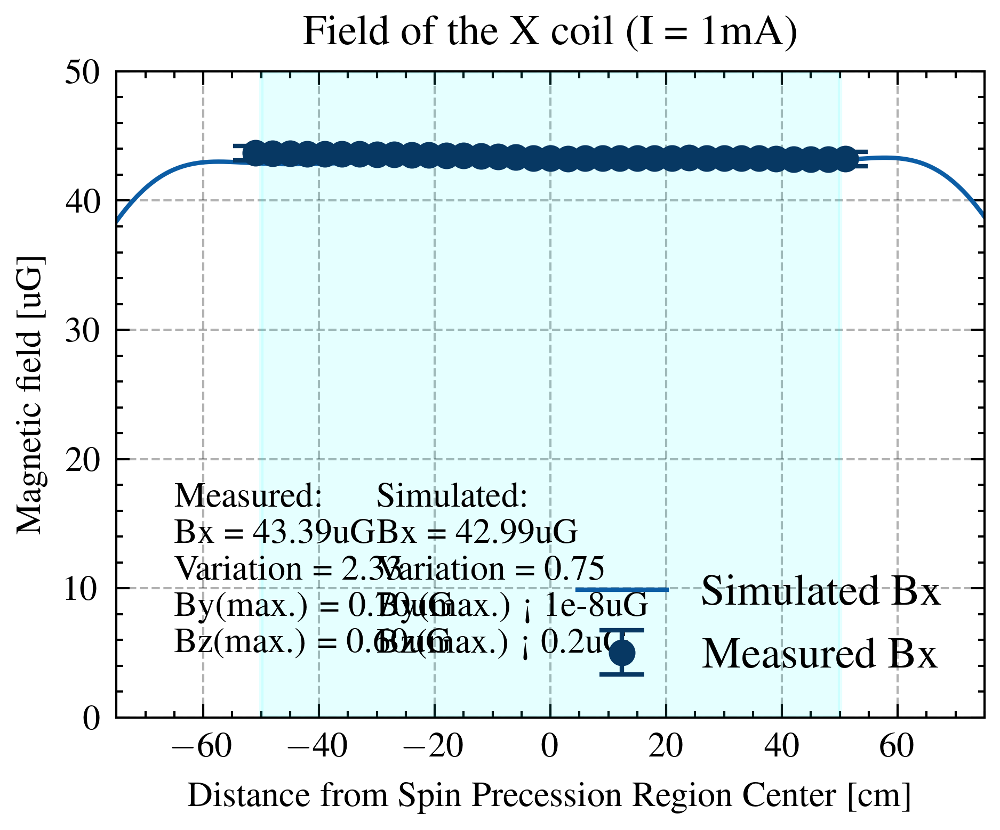

In [170]:
# Plot fields on the beamline
z_probe = 0 
z_index = 10 * z_probe - 50
Bx_error = B_field_error(df_Bx)
plt.figure(facecolor='none')

plt.plot(x_sim[0], Bx_coil_X[z_index], '-', label = 'Simulated Bx', color = 'C0')
plt.errorbar(df_Bx['dist'], df_Bx['Bx2'], yerr=2*Bx_error['Bx2'], fmt='o', ms=5, capsize=5, capthick=1, label = 'Measured Bx', color = darken_color(0))

plt.legend(loc = 'lower right', fontsize = 10)
plt.xlabel('Distance from Spin Precession Region Center [cm]')
plt.ylabel('Magnetic field [uG]')
plt.title('Field of the X coil (I = 1mA)')
plt.xlim(-75, 75)
plt.ylim(0, 50)

plot_text = 'Measured:\nBx = {:.2f}uG\nVariation = {:.2f}%\nBy(max.) = {:.2f}uG\nBz(max.) = {:.2f}uG'.format(np.mean(df_Bx['Bx2']), 
                                                                                                            delta_Bx/np.mean(df_Bx['Bx2'])*100,
                                                                                                            np.max(np.abs(df_Bx['By2'])), 
                                                                                                            np.max(np.abs(df_Bx['Bz2'])))
sim_text = 'Simulated:\nBx = {:.2f}uG\nVariation = {:.2f}%\nBy(max.) < 1e-8uG\nBz(max.) < 0.2uG'.format(42.99, 
                                                                                               (np.max(np.max(Bx_coil_X[20:80, 250:1250])) - np.min(np.min(Bx_coil_X[20:80, 250:1250])))*100/41.85)
plt.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
plt.text(-65, 5, plot_text)
plt.text(-30, 5, sim_text)
plt.grid(alpha = 0.3)

# Save Figure. Check each time!
# plt.savefig('Graphs/Xcoil_Beamline.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the gradients

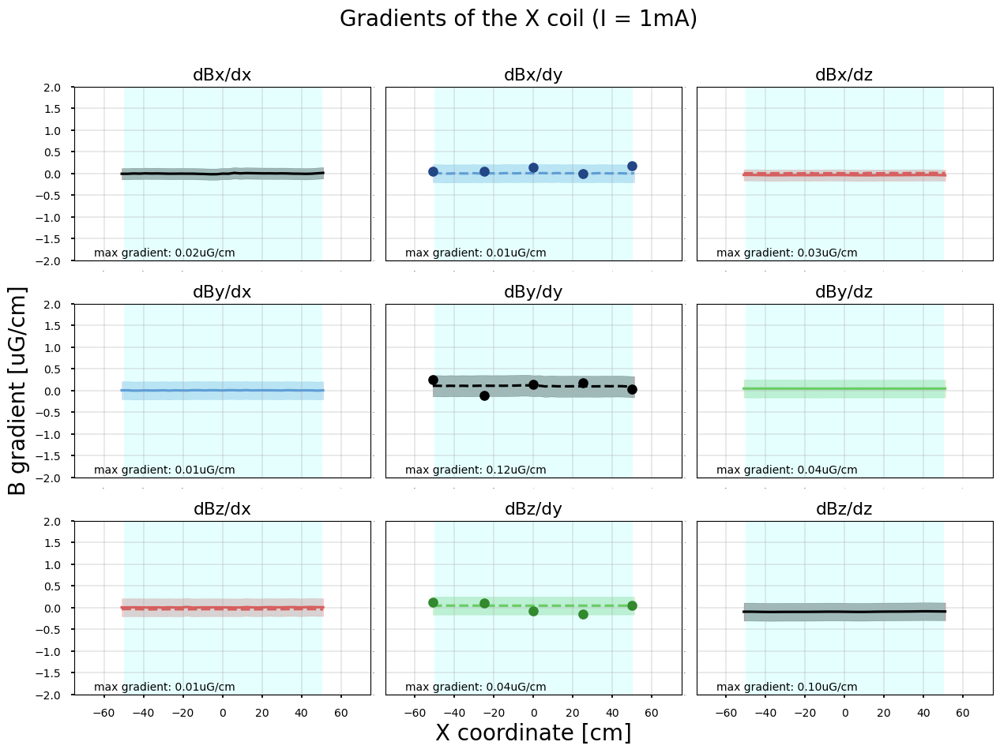

In [166]:
# Plot gradients
fig, axs = plt.subplots(3, 3, figsize=(15, 10), facecolor='none')
plt.subplots_adjust(wspace=0.05, hspace=0.25)

x = df_Bx['dist']
ys = [df_Bx['dBxdx'], df_Bx['dBydx'], df_Bx['dBxdz'],
    df_Bx['dBydx'], df_Bx['dBydy'], df_Bx['dBydz'],
    df_Bx['dBzdx'], df_Bx['dBydz'], df_Bx['dBzdz']]

axs[0, 0].plot(df_Bx['dist'], df_Bx['dBxdx'], label = 'dBxdx', color = 'black')
axs[0,0].fill_between(df_Bx['dist'], df_Bx['dBxdx'] - Bx_error['dBxdx2'], df_Bx['dBxdx'] + Bx_error['dBxdx2'], alpha = 0.3, color = 'black')
axs[0, 1].plot(df_Bx['dist'], df_Bx['dBydx'], '--', label = 'dBxdy', color = '#5F9ED6')
axs[0, 1].fill_between(df_Bx['dist'], df_Bx['dBydx'] - Bx_error['dBydx2'], df_Bx['dBydx'] + Bx_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[0, 2].plot(df_Bx['dist'], df_Bx['dBxdz23'], label = 'dBxdz', color = '#D65F5F')
axs[0, 2].fill_between(df_Bx['dist'], df_Bx['dBxdz23'] - Bx_error['dBxdz'], df_Bx['dBxdz23'] + Bx_error['dBxdz'], alpha = 0.3, color = '#D65F5F')
axs[0, 2].plot(df_Bx['dist'], df_Bx['dBzdx'], '--', label = 'dBzdx', color = '#D65F5F')
axs[1, 0].plot(df_Bx['dist'], df_Bx['dBydx'], label = 'dBxdy', color = '#5F9ED6')
axs[1, 0].fill_between(df_Bx['dist'], df_Bx['dBydx'] - Bx_error['dBydx2'], df_Bx['dBydx'] + Bx_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[1, 1].plot(df_Bx['dist'], df_Bx['dBydy'], '--', label = 'dBydy', color = 'black')
axs[1, 1].fill_between(df_Bx['dist'], df_Bx['dBydy'] - Bx_error['dBydy'], df_Bx['dBydy'] + Bx_error['dBydy'], alpha = 0.3, color = 'black')
axs[1, 2].plot(df_Bx['dist'], df_Bx['dBydz'], label = 'dBydz', color = '#6ACC65')
axs[1, 2].fill_between(df_Bx['dist'], df_Bx['dBydz'] - Bx_error['dBydz'], df_Bx['dBydz'] + Bx_error['dBydz'], alpha = 0.3, color = '#6ACC65')
axs[2, 0].plot(df_Bx['dist'], df_Bx['dBzdx'], label = 'dBzdx', color = '#D65F5F')
axs[2, 0].fill_between(df_Bx['dist'], df_Bx['dBzdx'] - Bx_error['dBzdx2'], df_Bx['dBzdx'] + Bx_error['dBzdx2'], alpha = 0.3, color = '#D65F5F')
axs[2, 0].plot(df_Bx['dist'], df_Bx['dBxdz23'], '--', label = 'dBxdz', color = '#D65F5F')
axs[2, 1].plot(df_Bx['dist'], df_Bx['dBydz'], '--', label = 'dBydz', color = '#6ACC65')
axs[2, 1].fill_between(df_Bx['dist'], df_Bx['dBydz'] - Bx_error['dBydz'], df_Bx['dBydz'] + Bx_error['dBydz'], alpha = 0.3, color = '#6ACC65')
axs[2, 2].plot(df_Bx['dist'], df_Bx['dBzdz'], label = 'dBzdz', color = 'black')
axs[2, 2].fill_between(df_Bx['dist'], df_Bx['dBzdz'] - Bx_error['dBzdz'], df_Bx['dBzdz'] + Bx_error['dBzdz'], alpha = 0.3, color = 'black')

for ax, y in zip(axs.flat, ys):
    ax.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
    ax.set_ylim(-2, 2);
    ax.set_xlim(-75, 75);
    ax.set_yticks([-2,-1.5,-1,-0.5,0,0.50,1,1.50,2]);
    ax.set_xticks([-60,-40,-20,0,20,40,60]);
    ax.tick_params(axis='both', which='both', length=0, labelsize=0);
    ax.grid(alpha=0.3)
    max_value = np.max(np.abs(y))
    ax.text(-65, -1.9, f'max gradient: {max_value:.2f}uG/cm')

dBdy_x_coor = [-51, -25, 0, 25, 50]
dBxdy_add_Bx = [ 0.05066801,  0.04571385,  0.141605  , -0.01561824,  0.17811981]
dBydy_add_Bx = [ 0.24944845, -0.1069985 ,  0.14262587,  0.1676908 ,  0.0362563 ]
dBzdy_add_Bx = [ 0.11523316,  0.10796186, -0.08133643, -0.14664243,  0.05210649]
axs[0, 1].plot(dBdy_x_coor, dBxdy_add_Bx, 'o', color = darken_color(0))
axs[1, 1].plot(dBdy_x_coor, dBydy_add_Bx, 'o', color = 'black')
axs[2, 1].plot(dBdy_x_coor, dBzdy_add_Bx, 'o', color = darken_color(1))

axs[0, 0].set_title('dBx/dx')
axs[0, 1].set_title('dBx/dy')
axs[0, 2].set_title('dBx/dz')
axs[1, 0].set_title('dBy/dx')
axs[1, 1].set_title('dBy/dy')
axs[1, 2].set_title('dBy/dz')
axs[2, 0].set_title('dBz/dx')
axs[2, 1].set_title('dBz/dy')
axs[2, 2].set_title('dBz/dz')

axs[0,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[2,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].set_ylabel('B gradient [uG/cm]', fontsize=20);
axs[2,0].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,2].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].set_xlabel('X coordinate [cm]', fontsize=20);


fig.suptitle('Gradients of the X coil (I = 1mA)', fontsize=20)

# Save Figure. Check each time!
plt.savefig('Graphs/Xcoil_Gradients.pdf', dpi=1000, transparent=True, bbox_inches='tight')

# dBx/dx

## Import and process the data

In [48]:
# Import the data
df = pd.read_csv('Field Data/dBxdx_field.csv', sep=',', header=None)

df.columns = ['dist', 'current', 
         'Mag1Bx', 'Mag1By', 'Mag1Bz', 
         'Mag2Bx', 'Mag2By', 'Mag2Bz', 
         'Mag3Bx', 'Mag3By', 'Mag3Bz', 
         'Mag4Bx', 'Mag4By', 'Mag4Bz', 
         'Mag5Bx', 'Mag5By', 'Mag5Bz']
# df = df.sort_values(by=['dist']).reset_index(drop=True)

# Figure out the current we actually need to apply
dBxdx_target = 200 # uG/cm
dBxdx_measured = (df['Mag2Bz'][18] - df['Mag2Bz'][16]) / 6
dBxdx_current_measured = df['current'][17]
dBxdx_current_target = dBxdx_target * dBxdx_current_measured / dBxdx_measured

# Normalize the fields to unit current values
# Redo calibration
# Bx -> 0.9548 * Bx
# By -> 1 * By
# Bz -> [0.9732, 0.9732, 0.9732, 0.9872, 0.9872] * Bz 
# Transform to ACME coordinates
# sensor -> ACME
# x -> z
# y -> -y
# z -> x
df['Bz1'] = df['Mag1Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By1'] = -df['Mag1By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx1'] = df['Mag1Bz']/np.mean(df['current']) * 973.2 * 43.36 / 41.84
df['Bz2'] = df['Mag2Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By2'] = -df['Mag2By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx2'] = df['Mag2Bz']/np.mean(df['current']) * 973.2 * 43.36 / 41.84
df['Bz3'] = df['Mag3Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By3'] = -df['Mag3By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx3'] = df['Mag3Bz']/np.mean(df['current']) * 973.2 * 43.36 / 41.84
df['Bz4'] = df['Mag4Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By4'] = df['Mag4By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx4'] = df['Mag4Bz']/np.mean(df['current']) * 987.2 * 43.36 / 41.84
df['Bz5'] = df['Mag5Bx']/np.mean(df['current']) * 954.8 * 256.641 / 248.253
df['By5'] = -df['Mag5By']/np.mean(df['current']) * 1000 * 77.1887 / 78.46
df['Bx5'] = df['Mag5Bz']/np.mean(df['current']) * 987.2 * 43.36 / 41.84

# Align measurements on mag4 and Mag5 to same x location.
df['Bx4'][0:35] = df['Bx4'][5:]
df['By4'][0:35] = df['By4'][5:]
df['Bz4'][0:35] = df['Bz4'][5:]
df['Bx5'][0:35] = df['Bx5'][5:]
df['By5'][0:35] = df['By5'][5:]
df['Bz5'][0:35] = df['Bz5'][5:]
df_dBxdx = df.iloc[0:35,:]

print(dBxdx_current_target)

367997.56986634264


In [49]:
# Process the data 

# Calculate the gradients
# dBdz gradients
df_dBxdx['dBzdz12'] = (df_dBxdx['Bz1'] - df_dBxdx['Bz2']) / 3
df_dBxdx['dBydz12'] = (df_dBxdx['By1'] - df_dBxdx['By2']) / 3
df_dBxdx['dBxdz12'] = (df_dBxdx['Bx1'] - df_dBxdx['Bx2']) / 3
df_dBxdx['dBzdz23'] = (df_dBxdx['Bz2'] - df_dBxdx['Bz3']) / 3
df_dBxdx['dBydz23'] = (df_dBxdx['By2'] - df_dBxdx['By3']) / 3
df_dBxdx['dBxdz23'] = (df_dBxdx['Bx2'] - df_dBxdx['Bx3']) / 3
df_dBxdx['dBzdz'] = (df_dBxdx['dBzdz12'] + df_dBxdx['dBzdz23']) / 2
df_dBxdx['dBydz'] = (df_dBxdx['dBydz12'] + df_dBxdx['dBydz23']) / 2
df_dBxdx['dBxdz'] = (df_dBxdx['dBxdz12'] + df_dBxdx['dBxdz23']) / 2
# dBdx gradients
df_dBxdx['dBzdx1'] = df_dBxdx['Bz1'].diff() / 3
df_dBxdx['dBydx1'] = df_dBxdx['By1'].diff() / 3
df_dBxdx['dBxdx1'] = df_dBxdx['Bx1'].diff() / 3
df_dBxdx['dBzdx1'][0] = df_dBxdx['dBzdx1'][1]
df_dBxdx['dBydx1'][0] = df_dBxdx['dBydx1'][1]
df_dBxdx['dBxdx1'][0] = df_dBxdx['dBxdx1'][1]
df_dBxdx['dBzdx2'] = df_dBxdx['Bz2'].diff() / 3
df_dBxdx['dBydx2'] = df_dBxdx['By2'].diff() / 3
df_dBxdx['dBxdx2'] = df_dBxdx['Bx2'].diff() / 3
df_dBxdx['dBzdx2'][0] = df_dBxdx['dBzdx2'][1]
df_dBxdx['dBydx2'][0] = df_dBxdx['dBydx2'][1]
df_dBxdx['dBxdx2'][0] = df_dBxdx['dBxdx2'][1]
df_dBxdx['dBzdx3'] = df_dBxdx['Bz3'].diff() / 3
df_dBxdx['dBydx3'] = df_dBxdx['By3'].diff() / 3
df_dBxdx['dBxdx3'] = df_dBxdx['Bx3'].diff() / 3
df_dBxdx['dBzdx3'][0] = df_dBxdx['dBzdx3'][1]
df_dBxdx['dBydx3'][0] = df_dBxdx['dBydx3'][1]
df_dBxdx['dBxdx3'][0] = df_dBxdx['dBxdx3'][1]
df_dBxdx['dBzdx'] = (df_dBxdx['dBzdx1'] + df_dBxdx['dBzdx2'] + df_dBxdx['dBzdx3']) / 3
df_dBxdx['dBydx'] = (df_dBxdx['dBydx1'] + df_dBxdx['dBydx2'] + df_dBxdx['dBydx3']) / 3
df_dBxdx['dBxdx'] = (df_dBxdx['dBxdx1'] + df_dBxdx['dBxdx2'] + df_dBxdx['dBxdx3']) / 3
#dBydy gradient
df_dBxdx['dBydy1'] = - (df_dBxdx['dBxdx1'] + df_dBxdx['dBzdz12'])
df_dBxdx['dBydy2'] = - (df_dBxdx['dBxdx2'] + df_dBxdx['dBzdz12'])
df_dBxdx['dBydy3'] = - (df_dBxdx['dBxdx2'] + df_dBxdx['dBzdz23'])
df_dBxdx['dBydy4'] = - (df_dBxdx['dBxdx3'] + df_dBxdx['dBzdz23'])
df_dBxdx['dBydy'] = (df_dBxdx['dBydy1'] + df_dBxdx['dBydy2'] + df_dBxdx['dBydy3'] + df_dBxdx['dBydy4']) / 4

/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/705805178.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dBxdx['dBzdz12'] = (df_dBxdx['Bz1'] - df_dBxdx['Bz2']) / 3
/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/705805178.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dBxdx['dBydz12'] = (df_dBxdx['By1'] - df_dBxdx['By2']) / 3
/var/folders/fh/2n847f155kb9wy8x8ttw595m0000gn/T/ipykernel_52941/705805178.py:7: SettingWithCopyWarning: 
A value is trying to be set 

## Plot the field maps

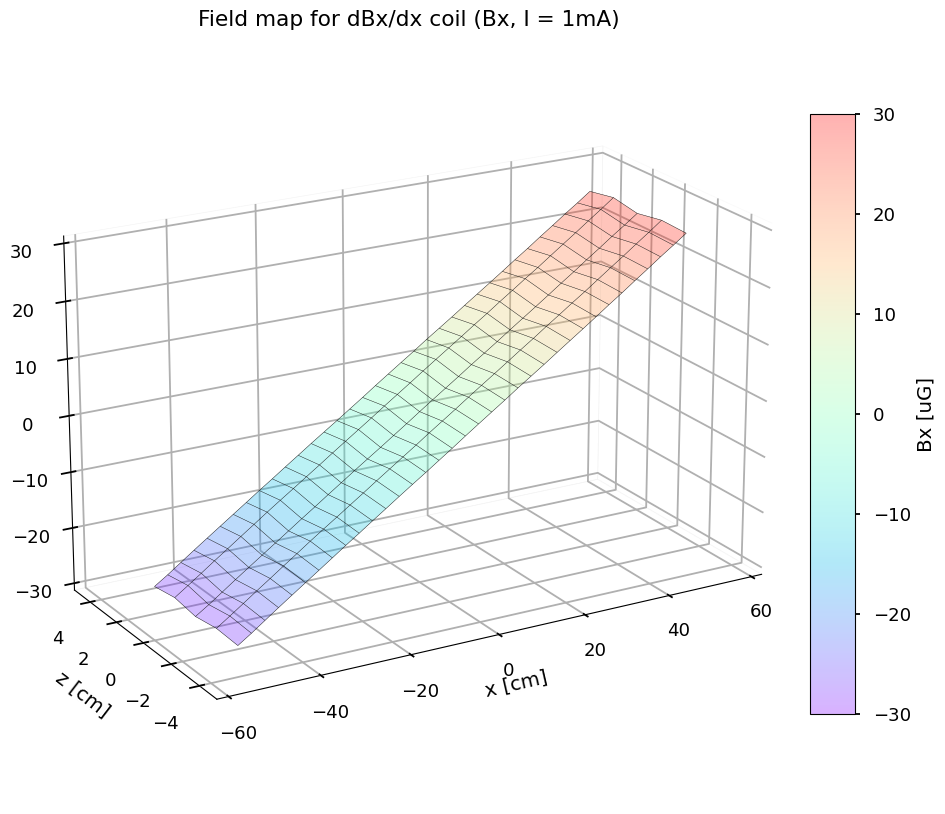

In [170]:
# Make a 3D field map on the x-z plane, for Bx

x, z = np.meshgrid(df_dBxdx['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBxdx['Bx1'], df_dBxdx['Bx4'], df_dBxdx['Bx2'], df_dBxdx['Bx5'], df_dBxdx['Bx3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -30, vmax = 30, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-30, 30)
# ax.set_zlabel('Bz [uG]', labelpad=10)
ax.set_title('Field map for dBx/dx coil (Bx, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'Bx [uG]')

# Save figure
plt.savefig('Graphs/dBxdx_FieldMap_Bx.pdf', dpi=1000, transparent=True, bbox_inches='tight')

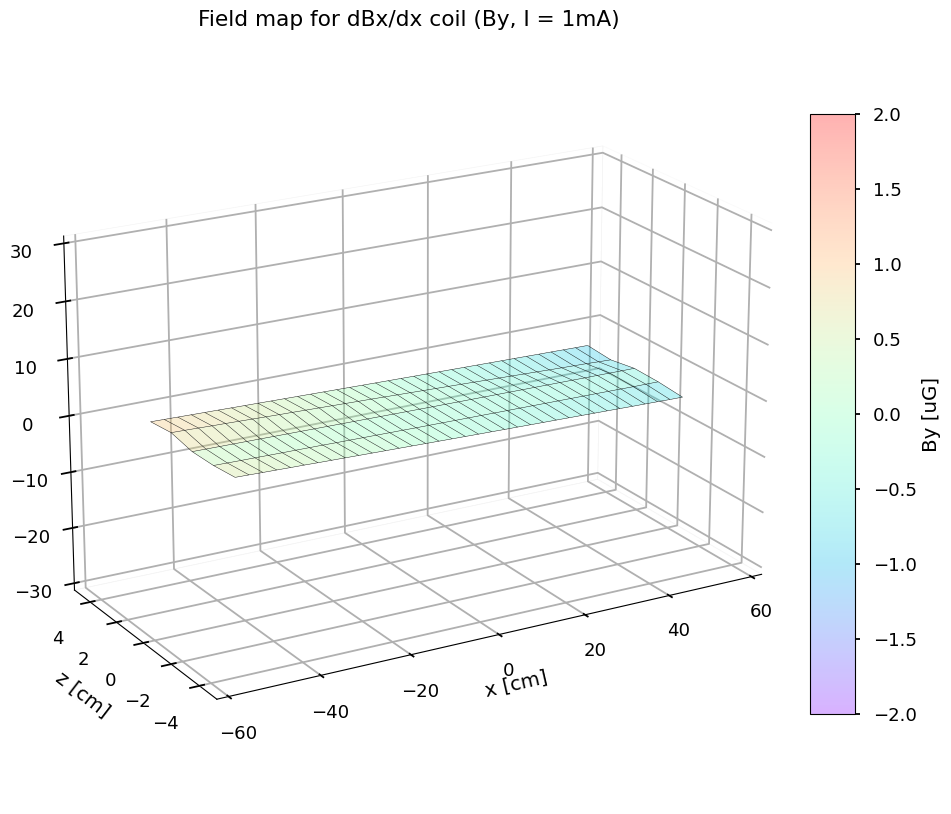

In [171]:
# Make a 3D field map on the x-z plane, for By

x, z = np.meshgrid(df_dBxdx['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBxdx['By1'], df_dBxdx['By4'], df_dBxdx['By2'], df_dBxdx['By5'], df_dBxdx['By3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -2, vmax = 2, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-30, 30)
# ax.set_zlabel('Bz [uG]', labelpad=10)
ax.set_title('Field map for dBx/dx coil (By, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'By [uG]')

# Save figure
plt.savefig('Graphs/dBxdx_FieldMap_By.pdf', dpi=1000, transparent=True, bbox_inches='tight')

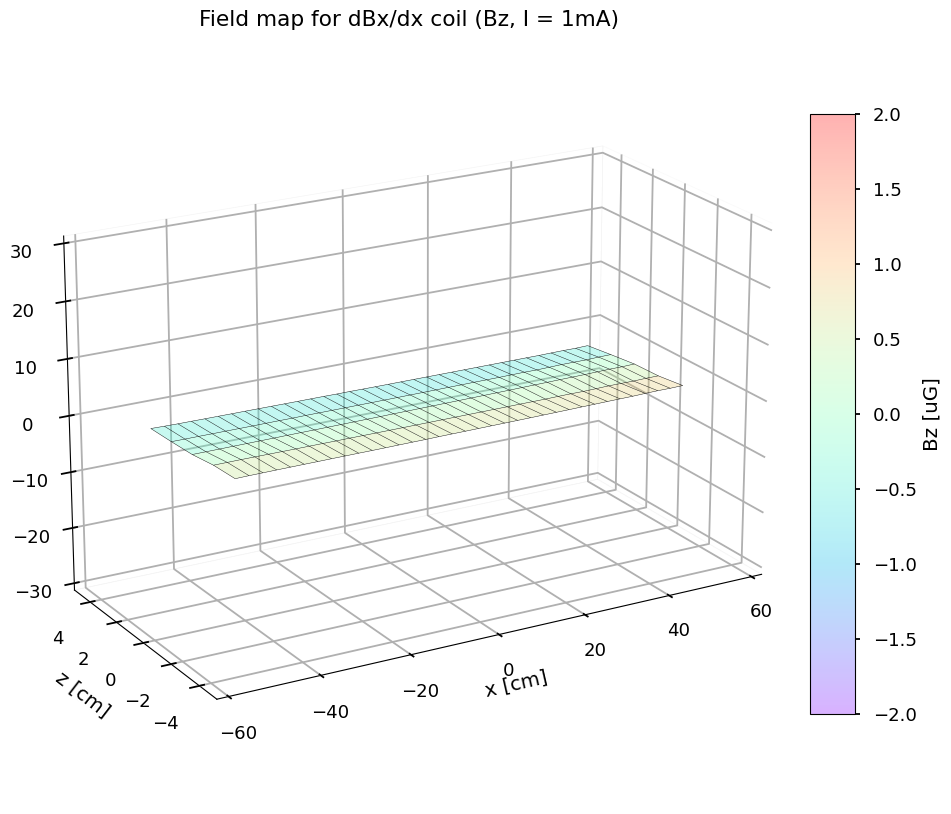

In [172]:
# Make a 3D field map on the x-z plane, for Bz

x, z = np.meshgrid(df_dBxdx['dist'], [3, 1.5, 0, -1.5, -3])
B = np.array([df_dBxdx['Bz1'], df_dBxdx['Bz4'], df_dBxdx['Bz2'], df_dBxdx['Bz5'], df_dBxdx['Bz3']])

# Create a new matplotlib figure and axes
fig = plt.figure(figsize=(15,10), facecolor='none')
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=20, azim=240)
ax.set_facecolor('none')
ax.xaxis.pane.set_facecolor('white')
ax.yaxis.pane.set_facecolor('white')
ax.zaxis.pane.set_facecolor('white')

# Plot a 3D surface plot on the axes with transparency
surf = ax.plot_surface(x, z, B, cmap='rainbow', vmin = -2, vmax = 2, alpha=0.3)

# Add a mesh grid to the plot
ax.plot_wireframe(x, z, B, color='k', linewidth=0.3)
ax.grid()

# Set plot limits
ax.set_xlim(-60, 60)
ax.set_xlabel('x [cm]', labelpad=10)
ax.set_ylabel('z [cm]', labelpad=10)
ax.set_ylim(-5, 5)
ax.set_zlim(-30, 30)
# ax.set_zlabel('Bz [uG]', labelpad=10)
ax.set_title('Field map for dBx/dx coil (Bz, I = 1mA)')
ax.set_box_aspect([2,1,1.2])

# Add a color bar which maps values to colors.
cax = fig.add_axes([0.78, 0.2, 0.03, 0.6]) 
fig.colorbar(surf, cax=cax, shrink=0.7, aspect=20, label = 'Bz [uG]')

# Save figure
plt.savefig('Graphs/dBxdx_FieldMap_Bz.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the field on the beamline and compare with simulations

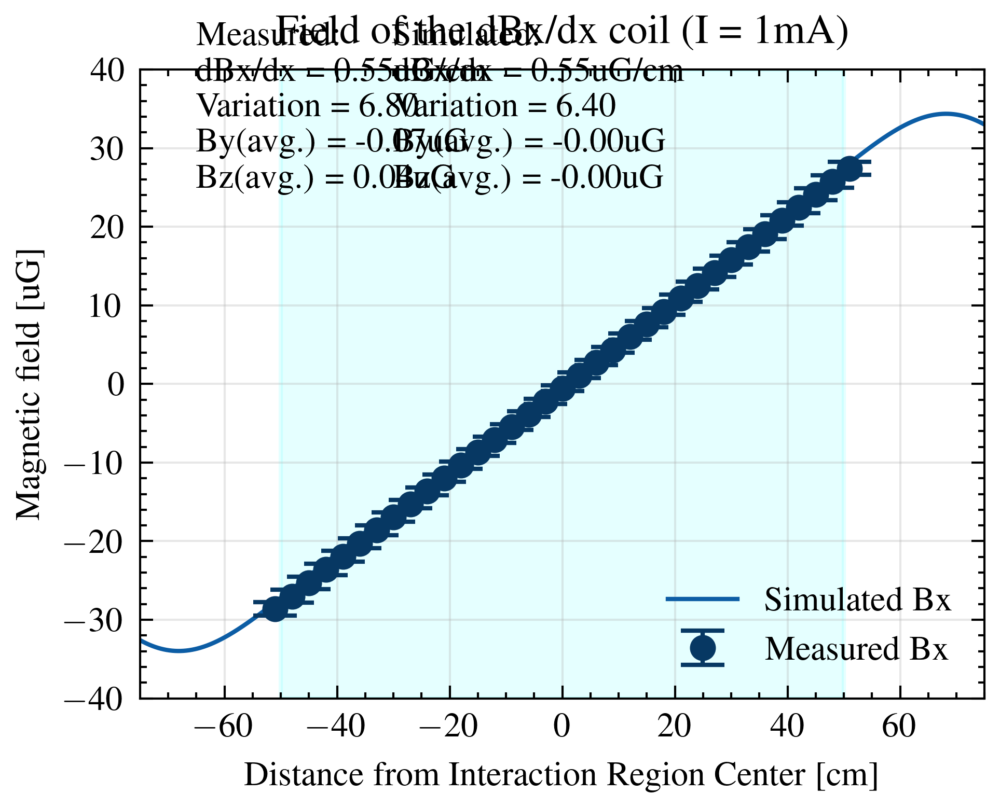

In [50]:
# Plot fields on the beamline
z_probe = 0 
z_index = 10 * z_probe - 50
dBxdx_error = B_field_error(df_dBxdx)
dBxdx_sim = np.gradient(dBxdx_coil_X[z_index,250:1250])/0.1

plt.plot(x_sim[0], dBxdx_coil_X[z_index], '-', label = 'Simulated Bx')
plt.errorbar(df_dBxdx['dist'], df_dBxdx['Bx2'], fmt='o', yerr = 4*dBxdx_error['Bx2'], ms=5, capthick=1, capsize=5, label = 'Measured Bx', color = darken_color(0))

plt.legend(loc = 'lower right')
plt.xlabel('Distance from Interaction Region Center [cm]')
plt.ylabel('Magnetic field [uG]')
plt.title('Field of the dBx/dx coil (I = 1mA)')
plt.xlim(-75, 75)
plt.ylim(-40, 40)

plot_text = 'Measured:\ndBx/dx = {:.2f}uG/cm\nVariation = {:.2f}%\nBy(avg.) = {:.2f}uG\nBz(avg.) = {:.2f}uG'.format(np.mean(df_dBxdx['dBxdx']), 
                                                                                                          (np.max(df_dBxdx['dBxdx'])-np.min(df_dBxdx['dBxdx']))/np.mean(df_dBxdx['dBxdx'])*100,
                                                                                                          np.mean(df_dBxdx['By2']),
                                                                                                          np.mean(df_dBxdx['Bz2']))
sim_text = 'Simulated:\ndBx/dx = {:.2f}uG/cm\nVariation = {:.2f}%\nBy(avg.) = {:.2f}uG\nBz(avg.) = {:.2f}uG'.format(np.mean(dBxdx_sim), 
                                                                                                          (np.max(dBxdx_sim)-np.min(dBxdx_sim))/np.mean(dBxdx_sim)*100,
                                                                                                          np.mean(dBxdx_coil_Y[50]),
                                                                                                          np.mean(dBxdx_coil_Z[50]))
plt.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
plt.text(-65, 25, plot_text)
plt.text(-30, 25, sim_text)
plt.grid(alpha = 0.3)

# Save Figure. Check each time!
# plt.savefig('Graphs/dBxdx_Beamline.pdf', dpi=1000, transparent=True, bbox_inches='tight')

## Plot the gradients

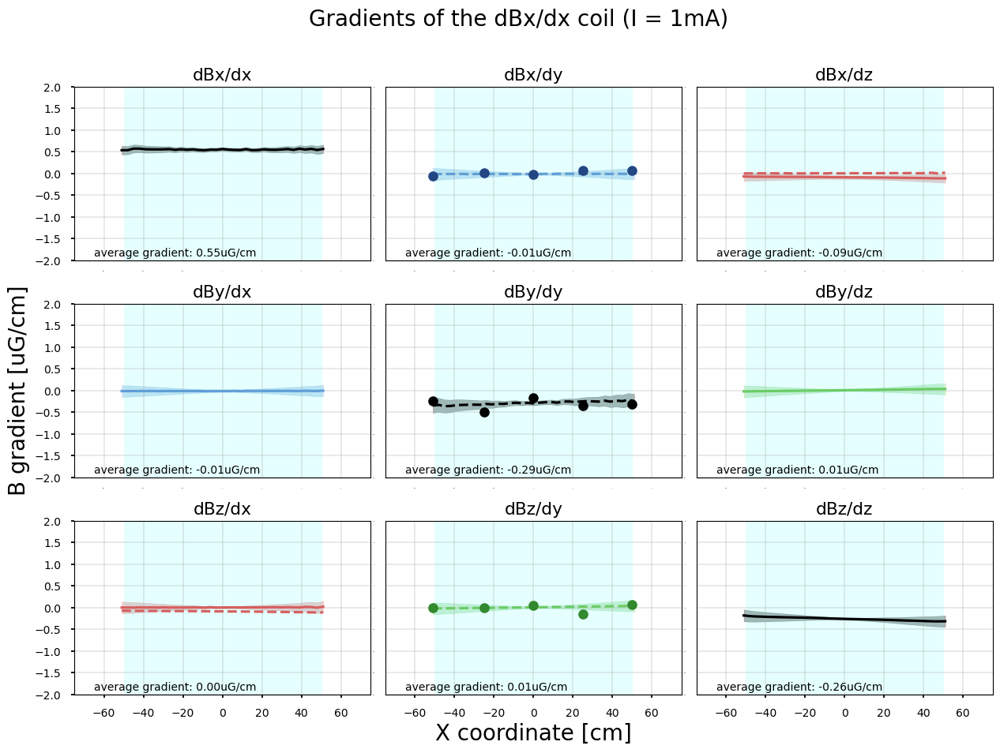

In [174]:
# Plot gradients
fig, axs = plt.subplots(3, 3, figsize=(15, 10), facecolor='none')
plt.subplots_adjust(wspace=0.05, hspace=0.25)

x = df_dBxdx['dist']
ys = [df_dBxdx['dBxdx'], df_dBxdx['dBydx'], df_dBxdx['dBxdz'],
    df_dBxdx['dBydx'], df_dBxdx['dBydy'], df_dBxdx['dBydz'],
    df_dBxdx['dBzdx'], df_dBxdx['dBydz'], df_dBxdx['dBzdz']]

axs[0, 0].plot(df_dBxdx['dist'], df_dBxdx['dBxdx'], label = 'dBxdx', color = 'black')
axs[0,0].fill_between(df_dBxdx['dist'], df_dBxdx['dBxdx'] - dBxdx_error['dBxdx2'], df_dBxdx['dBxdx'] + dBxdx_error['dBxdx2'], alpha = 0.3, color = 'black')
axs[0, 1].plot(df_dBxdx['dist'], df_dBxdx['dBydx'], '--', label = 'dBxdy', color = '#5F9ED6')
axs[0, 1].fill_between(df_dBxdx['dist'], df_dBxdx['dBydx'] - dBxdx_error['dBydx2'], df_dBxdx['dBydx'] + dBxdx_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[0, 2].plot(df_dBxdx['dist'], df_dBxdx['dBxdz'], label = 'dBxdz', color = '#D65F5F')
axs[0, 2].fill_between(df_dBxdx['dist'], df_dBxdx['dBxdz'] - dBxdx_error['dBxdz'], df_dBxdx['dBxdz'] + dBxdx_error['dBxdz'], alpha = 0.3, color = '#D65F5F')
axs[0, 2].plot(df_dBxdx['dist'], df_dBxdx['dBzdx'], '--', label = 'dBzdx', color = '#D65F5F')
axs[1, 0].plot(df_dBxdx['dist'], df_dBxdx['dBydx'], label = 'dBxdy', color = '#5F9ED6')
axs[1, 0].fill_between(df_dBxdx['dist'], df_dBxdx['dBydx'] - dBxdx_error['dBydx2'], df_dBxdx['dBydx'] + dBxdx_error['dBydx2'], alpha = 0.3, color = '#5F9ED6')
axs[1, 1].plot(df_dBxdx['dist'], df_dBxdx['dBydy'], '--', label = 'dBydy', color = 'black')
axs[1, 1].fill_between(df_dBxdx['dist'], df_dBxdx['dBydy'] - dBxdx_error['dBydy'], df_dBxdx['dBydy'] + dBxdx_error['dBydy'], alpha = 0.3, color = 'black')
axs[1, 2].plot(df_dBxdx['dist'], df_dBxdx['dBydz'], label = 'dBydz', color = '#6ACC65')
axs[1, 2].fill_between(df_dBxdx['dist'], df_dBxdx['dBydz'] - dBxdx_error['dBydz'], df_dBxdx['dBydz'] + dBxdx_error['dBydz'], alpha = 0.3, color = '#6ACC65')
axs[2, 0].plot(df_dBxdx['dist'], df_dBxdx['dBzdx'], label = 'dBzdx', color = '#D65F5F')
axs[2, 0].fill_between(df_dBxdx['dist'], df_dBxdx['dBzdx'] - dBxdx_error['dBzdx2'], df_dBxdx['dBzdx'] + dBxdx_error['dBzdx2'], alpha = 0.3, color = '#D65F5F')
axs[2, 0].plot(df_dBxdx['dist'], df_dBxdx['dBxdz'], '--', label = 'dBxdz', color = '#D65F5F')
axs[2, 1].plot(df_dBxdx['dist'], df_dBxdx['dBydz'], '--', label = 'dBydz', color = '#6ACC65')
axs[2, 1].fill_between(df_dBxdx['dist'], df_dBxdx['dBydz'] - dBxdx_error['dBydz'], df_dBxdx['dBydz'] + dBxdx_error['dBydz'], alpha = 0.3, color = '#6ACC65')
axs[2, 2].plot(df_dBxdx['dist'], df_dBxdx['dBzdz'], label = 'dBzdz', color = 'black')
axs[2, 2].fill_between(df_dBxdx['dist'], df_dBxdx['dBzdz'] - dBxdx_error['dBzdz'], df_dBxdx['dBzdz'] + dBxdx_error['dBzdz'], alpha = 0.3, color = 'black')

for ax, y in zip(axs.flat, ys):
    ax.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
    ax.set_ylim(-2, 2);
    ax.set_xlim(-75, 75);
    ax.set_yticks([-2,-1.5,-1,-0.5,0,0.50,1,1.50,2]);
    ax.set_xticks([-60,-40,-20,0,20,40,60]);
    ax.tick_params(axis='both', which='both', length=0, labelsize=0);
    ax.grid(alpha=0.3)
    max_value = np.max(np.abs(y))
    mean_value = np.mean(y)
    ax.text(-65, -1.9, f'average gradient: {mean_value:.2f}uG/cm')

dBdy_x_coor = [-51, -25, 0, 25, 50]
dBxdy_add_Bx = [-0.0575788 ,  0.01419532, -0.03193284,  0.06915388,  0.06947491]
dBydy_add_Bx = [-0.24697409, -0.50380748, -0.16954344, -0.35704845, -0.30867342]
dBzdy_add_Bx = [-0.00068164, -0.0096314 ,  0.04474327, -0.14362798,  0.06887786]
axs[0, 1].plot(dBdy_x_coor, dBxdy_add_Bx, 'o', color = darken_color(0))
axs[1, 1].plot(dBdy_x_coor, dBydy_add_Bx, 'o', color = 'black')
axs[2, 1].plot(dBdy_x_coor, dBzdy_add_Bx, 'o', color = darken_color(1))

axs[0, 0].set_title('dBx/dx')
axs[0, 1].set_title('dBx/dy')
axs[0, 2].set_title('dBx/dz')
axs[1, 0].set_title('dBy/dx')
axs[1, 1].set_title('dBy/dy')
axs[1, 2].set_title('dBy/dz')
axs[2, 0].set_title('dBz/dx')
axs[2, 1].set_title('dBz/dy')
axs[2, 2].set_title('dBz/dz')

axs[0,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[2,0].tick_params(axis='y', which='both', length=3, labelsize=10)
axs[1,0].set_ylabel('B gradient [uG/cm]', fontsize=20);
axs[2,0].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,2].tick_params(axis='x', which='both', length=3, labelsize=10)
axs[2,1].set_xlabel('X coordinate [cm]', fontsize=20);


fig.suptitle('Gradients of the dBx/dx coil (I = 1mA)', fontsize=20)

# Save Figure. Check each time!
plt.savefig('Graphs/dBxdx_Gradients.pdf', dpi=1000, transparent=True, bbox_inches='tight')

# Plot Auxiliary Coil together

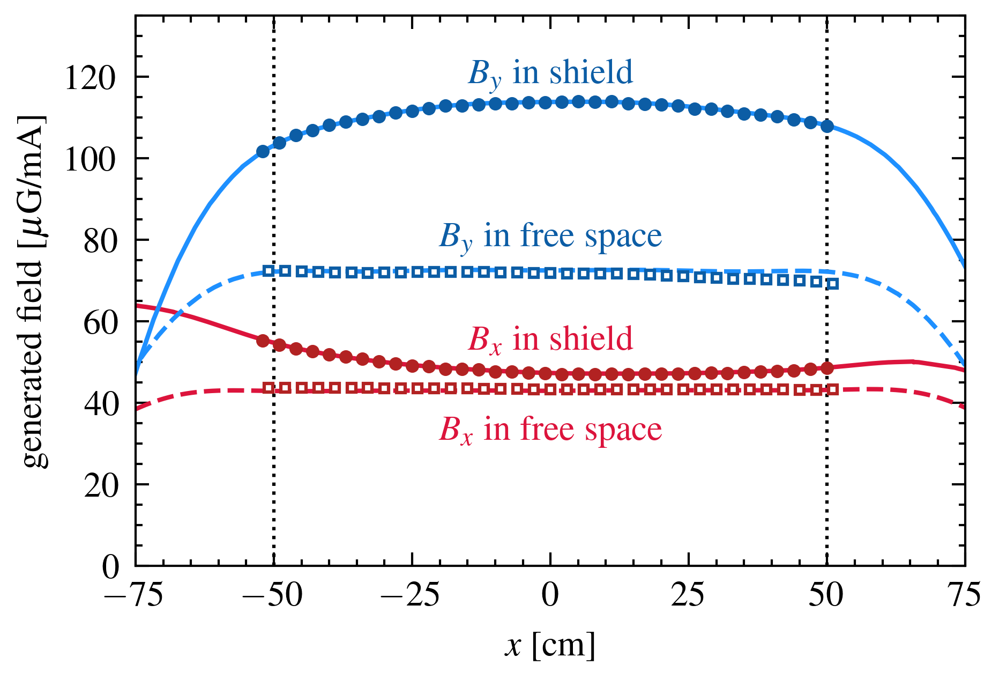

In [360]:
z_probe = 0 
z_index = 10 * z_probe - 50
By_error = B_field_error(df_By)
plt.figure(figsize=(3.33,2.22))

#reference lines for spin-precession volume
plt.axvline(-50, color = 'k', linestyle = ':', linewidth = 0.75)
plt.axvline(50, color = 'k', linestyle = ':', linewidth = 0.75)

# freespace Bx
plt.plot(x_sim[0], Bx_coil_X[z_index], '--', color = 'crimson')
plt.plot(df_By['dist'], df_Bx['Bx2'], 's', ms=2, markeredgewidth=0.75, markerfacecolor='w', markeredgecolor='firebrick')
# plt.errorbar(df_Bx['dist'], df_Bx['Bx2'], yerr=2*Bx_error['Bx2'], fmt='o', ms=5, capsize=5, capthick=1, label = 'Measured Bx', color = darken_color(2))

# shielded Bx
plt.plot(sim_Bx_Shield['x']/10, sim_Bx_Shield['B'], '-', color = 'crimson')
plt.plot(-df_By_Shield['dist']+164, df_Bx_Shield['B'],'o', ms=2, color='firebrick')

# freespace By
plt.plot(sim_By_FreeSpace['x']/10, sim_By_FreeSpace['B'], '--', color = 'dodgerblue')
plt.plot(df_By['dist'], df_By['By2']*72.4488/77.1887, 's', ms=2, markeredgewidth=0.75, markerfacecolor='w', markeredgecolor='C0')
# plt.errorbar(df_By['dist'], df_By['By2'], fmt='o', yerr = By_error['By2'], ms=5, capsize=5, capthick=1, label = 'Measured By', color = darken_color(1))

# shielded By
plt.plot(sim_By_Shield['x']/10, sim_By_Shield['B'] * 113.8 / 115.86, '-', color = 'dodgerblue')
plt.plot(-df_By_Shield['dist']+164, df_By_Shield['B'], 'o', ms=2, color='C0')

# add labels
plt.text(0,120, '$B_y$ in shield', color = 'C0', ha='center', va='center')
plt.text(0,80, '$B_y$ in free space', color = 'C0', ha='center', va='center')
plt.text(0,55, '$B_x$ in shield', color = 'crimson', ha='center', va='center')
plt.text(0,33, '$B_x$ in free space', color = 'crimson', ha='center', va='center')

plt.xlabel('$x$ [cm]')
plt.ylabel('generated field [$\mu$G/mA]')
# plt.title('Fields of the Auxiliary (Y and Z) coils (I = 1mA)')
plt.xlim(-75, 75)
plt.ylim(0, 135)

plt.grid(False)

# Save Figure. Check each time!
plt.savefig('Graphs/AuxCoil_Beamline.pdf', dpi=1200, transparent=True, bbox_inches='tight')

# An overall graph for all gradients

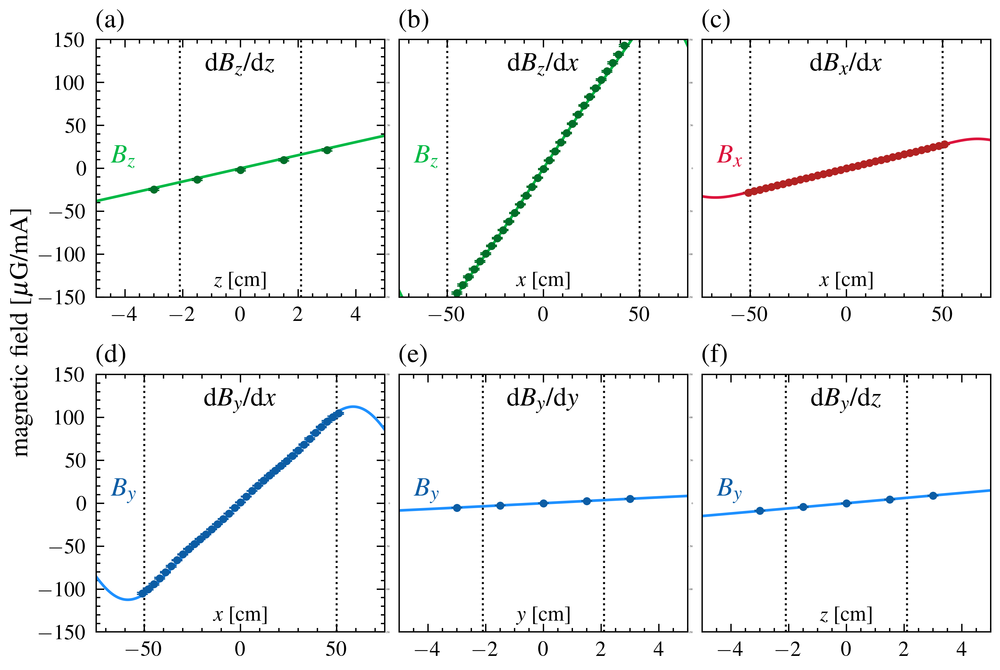

In [62]:
# Plot all gradients
fig, axs = plt.subplots(2, 3, figsize=(6, 4), facecolor='none')
plt.subplots_adjust(wspace=0.05, hspace=0.3)

#dBz/dz
axs[0,0].axvline(-2.1, color = 'black', linestyle = ':', linewidth = 0.75)
axs[0,0].axvline(2.1, color = 'black', linestyle = ':', linewidth = 0.75)

axs[0,0].plot(np.linspace(-5,5,101), dBzdz_coil_Z[:,600], color='C1', label = 'Simulated Bz')
data_dBzdz = [df_dBzdz['Bz3'][17], df_dBzdz['Bz5'][17], df_dBzdz['Bz2'][17], df_dBzdz['Bz4'][17], df_dBzdz['Bz1'][17]]
yerr_dBzdz = [dBzdz_error['Bz3'][17], dBzdz_error['Bz5'][17], dBzdz_error['Bz2'][17], dBzdz_error['Bz4'][17], dBzdz_error['Bz1'][17]]
axs[0,0].errorbar([-3,-1.5,0,1.5,3], data_dBzdz, yerr=yerr_dBzdz, fmt='o', ms=2, capsize=2, capthick=0.5, elinewidth=0.5, color = darken_color(1), label = 'Measured Bz')

axs[0,0].text(0, 135, 'd$B_z$/d$z$', color = 'k', ha='center', va='top', fontsize=10)
axs[0,0].text(-5, 185, '(a)', color = 'k', ha='left', va='top', fontsize=10)
axs[0,0].text(-4.5, 0, '$B_z$', color = 'C1', ha='left', va='bottom', fontsize=10)
axs[0,0].grid(False)
axs[0,0].set_xlim(-5,5)
axs[0,0].set_xticks([-4,-2,0,2,4])
axs[0,0].set_ylim(-150,150)
axs[0,0].set_xlabel('$z$ [cm]')
axs[0,0].xaxis.set_label_coords(0.5, 0.1)
# axs[0,0].spines['bottom'].set_color('crimson')
# axs[0,0].tick_params(axis='x', which='both', colors='crimson')

#dBz/dx
axs[0,1].axvline(-50, color = 'black', linestyle = ':', linewidth = 0.75)
axs[0,1].axvline(50, color = 'black', linestyle = ':', linewidth = 0.75)

axs[0,1].plot(x_sim[0], dBzdx_coil_Z[50], color='C1', label = 'Simulated Bz')
data_dBzdx = df_dBzdx['Bz3']
yerr_dBzdx = dBzdx_error['Bz3']
axs[0,1].errorbar(df_dBzdx['dist'], data_dBzdx, yerr=yerr_dBzdx, fmt='o', ms=2, capsize=2, capthick=0.5, elinewidth=0.5, color = darken_color(1), label = 'Measured Bz')

axs[0,1].text(0, 135, 'd$B_z$/d$x$', color = 'k', ha='center', va='top', fontsize=10)
axs[0,1].text(-75, 185, '(b)', color = 'k', ha='left', va='top', fontsize=10)
axs[0,1].text(-67.5, 0, '$B_z$', color = 'C1', ha='left', va='bottom', fontsize=10)
axs[0,1].grid(False)
axs[0,1].set_ylim(-150,150)
axs[0,1].tick_params(axis='y', which='both', length=0, labelsize=0);
axs[0,1].set_xlim(-75,75)
axs[0,1].tick_params(axis='y', which='both', length=0, labelsize=0);
axs[0,1].set_xlabel('$x$ [cm]')
axs[0,1].xaxis.set_label_coords(0.5, 0.1)
# axs[0,1].spines['bottom'].set_color('C1')
# axs[0,1].tick_params(axis='x', which='both', colors='C1')


#dBx/dx
axs[0,2].axvline(-50, color = 'black', linestyle = ':', linewidth = 0.75)
axs[0,2].axvline(50, color = 'black', linestyle = ':', linewidth = 0.75)

axs[0,2].plot(x_sim[0], dBxdx_coil_X[50], color = 'crimson', label = 'Simulated Bx')
data_dBxdx = df_dBxdx['Bx3']
yerr_dBxdx = dBxdx_error['Bx3']
axs[0,2].errorbar(df_dBxdx['dist'], data_dBxdx, yerr=yerr_dBxdx, fmt='o', ms=2, capsize=2, capthick=0.5, elinewidth=0.5, color = 'firebrick', label = 'Measured Bx')

axs[0,2].text(0, 135, 'd$B_x$/d$x$', color = 'k', ha='center', va='top', fontsize=10)
axs[0,2].text(-75, 185, '(c)', color = 'k', ha='left', va='top', fontsize=10)
axs[0,2].text(-67.5, 0, '$B_x$', color = 'crimson', ha='left', va='bottom', fontsize=10)
axs[0,2].grid(False)
axs[0,2].set_ylim(-150,150)
axs[0,2].tick_params(axis='y', which='both', length=0, labelsize=0);
axs[0,2].set_xlim(-75,75)
axs[0,2].tick_params(axis='y', which='both', length=0, labelsize=0);
axs[0,2].set_xlabel('$x$ [cm]')
axs[0,2].xaxis.set_label_coords(0.5, 0.1)
# axs[0,2].spines['bottom'].set_color('C1')
# axs[0,2].tick_params(axis='x', which='both', colors='C1')

#dBy/dx
axs[1,0].axvline(-50, color = 'black', linestyle = ':', linewidth = 0.75)
axs[1,0].axvline(50, color = 'black', linestyle = ':', linewidth = 0.75)

axs[1,0].plot(x_sim[0], dBydx_coil_Y[50], color = 'dodgerblue', label = 'Simulated By')
data_dBydx = df_dBydx['By3']
yerr_dBydx = dBydx_error['By3']
axs[1,0].errorbar(df_dBydx['dist'], data_dBydx, yerr=yerr_dBydx, fmt='o', ms=2, capsize=2, capthick=0.5, elinewidth=0.5, color = 'C0', label = 'Measured By')

axs[1,0].text(0, 135, 'd$B_y$/d$x$', color = 'k', ha='center', va='top', fontsize=10)
axs[1,0].text(-75, 185, '(d)', color = 'k', ha='left', va='top', fontsize=10)
axs[1,0].text(-67.5, 0, '$B_y$', color = 'C0', ha='left', va='bottom', fontsize=10)
axs[1,0].grid(False)
axs[1,0].set_ylim(-150,150)
axs[1,0].set_xlim(-75,75)
axs[1,0].set_xlabel('$x$ [cm]')
axs[1,0].xaxis.set_label_coords(0.5, 0.1)

# dBy/dy
axs[1,1].axvline(-2.1, color = 'black', linestyle = ':', linewidth = 0.75)
axs[1,1].axvline(2.1, color = 'black', linestyle = ':', linewidth = 0.75)

axs[1,1].plot(np.linspace(-5,5,101), dBydy_coil_Y_[:,600], color='dodgerblue', label = 'Simulated By')
data_dBydy = df_dBydy['dBydy'][17] * np.array([-3,-1.5,0,1.5,3])
yerr_dBydy = dBydy_error['By3'][17] * np.ones(5)
axs[1,1].errorbar([-3,-1.5,0,1.5,3], data_dBydy, yerr=yerr_dBydy, fmt='o', ms=2, capsize=2, capthick=0.5, elinewidth=0.5, color = 'C0', label = 'Measured By')

axs[1,1].text(0, 135, 'd$B_y$/d$y$', color = 'k', ha='center', va='top', fontsize=10)
axs[1,1].text(-5, 185, '(e)', color = 'k', ha='left', va='top', fontsize=10)
axs[1,1].text(-4.5, 0, '$B_y$', color = 'C0', ha='left', va='bottom', fontsize=10)
axs[1,1].grid(False)
axs[1,1].set_xlim(-5,5)
axs[1,1].set_xticks([-4,-2,0,2,4])
axs[1,1].set_ylim(-150,150)
axs[1,1].tick_params(axis='y', which='both', length=0, labelsize=0);
axs[1,1].set_xlabel('$y$ [cm]')
axs[1,1].xaxis.set_label_coords(0.5, 0.1)

# dBy/dz
axs[1,2].axvline(-2.1, color = 'black', linestyle = ':', linewidth = 0.75)
axs[1,2].axvline(2.1, color = 'black', linestyle = ':', linewidth = 0.75)

axs[1,2].plot(np.linspace(-5,5,101), dBydz_coil_Y[:,600], color='dodgerblue', label = 'Simulated By')
data_dBydz = [df_dBydz['By3'][17], df_dBydz['By5'][17], df_dBydz['By2'][17], df_dBydz['By4'][17], df_dBydz['By1'][17]]
yerr_dBydz = [dBydz_error['By3'][17], dBydz_error['By5'][17], dBydz_error['By2'][17], dBydz_error['By4'][17], dBydz_error['By1'][17]]
axs[1,2].errorbar([-3,-1.5,0,1.5,3], data_dBydz, yerr=yerr_dBydz, fmt='o', ms=2, capsize=2, capthick=0.5, elinewidth=0.5, color = 'C0', label = 'Measured By')

axs[1,2].text(0, 135, 'd$B_y$/d$z$', color = 'k', ha='center', va='top', fontsize=10)
axs[1,2].text(-5, 185, '(f)', color = 'k', ha='left', va='top', fontsize=10)
axs[1,2].text(-4.5, 0, '$B_y$', color = 'C0', ha='left', va='bottom', fontsize=10)
axs[1,2].grid(False)
axs[1,2].set_xlim(-5,5)
axs[1,2].set_xticks([-4,-2,0,2,4])
axs[1,2].set_ylim(-150,150)
axs[1,2].tick_params(axis='y', which='both', length=0, labelsize=0);
axs[1,2].set_xlabel('$z$ [cm]')
axs[1,2].xaxis.set_label_coords(0.5, 0.1)

# fig.suptitle('Gradient modes for the ACME coils (I = 1mA)', fontsize=20)
fig.supylabel('magnetic field [$\mu$G/mA]', x = 0.05)

# Save Figure. Check each time!
plt.savefig('Graphs/All_Gradients_new.pdf', dpi=1000, transparent=True, bbox_inches='tight')

# Get the simulated field over extended region ($\pm100\text{cm}$)

In [155]:
def ImportCoilSim2(data_filename):
    x_sim2 = np.linspace(-100,100,2001)
    z_sim2 = np.linspace(-5,5,101)
    x_sim2, z_sim2 = np.meshgrid(x_sim2, z_sim2)
    data_name = data_filename[20:-10] + '2'      # Get rid of the .csv suffix from data_filename
    Coil_sim_fields = pd.read_csv(data_filename, header=None)
    field_data = Coil_sim_fields.iloc[:,2].values.reshape(x_sim2.shape[1],x_sim2.shape[0])
    field_data = field_data.T
    globals()[data_name] = field_data

    print(data_name + ' have been imported')
    
data_list = ['Extended Simulation/Bx_coil_X_field.csv',
'Extended Simulation/Bz_coil_Z_field.csv',
'Extended Simulation/Bz_innercoil_Z_field.csv',
'Extended Simulation/Bz_outercoil_Z_field.csv',
'Extended Simulation/By_coil_Y_field.csv']

for i in data_list:
    ImportCoilSim2(i)

Bx_coil_X2 have been imported
Bz_coil_Z2 have been imported
Bz_innercoil_Z2 have been imported
Bz_outercoil_Z2 have been imported
By_coil_Y2 have been imported


In [158]:
# write Bx_coil_X2 to a .csv file
np.savetxt('Extended Simulation/Bx_coil_X_field2.csv', Bx_coil_X2[50], delimiter=',')
np.savetxt('Extended Simulation/Bz_coil_Z_field2.csv', Bz_coil_Z2[50], delimiter=',')
np.savetxt('Extended Simulation/Bz_innercoil_Z_field2.csv', Bz_innercoil_Z2[50], delimiter=',')
np.savetxt('Extended Simulation/Bz_outercoil_Z_field2.csv', Bz_outercoil_Z2[50], delimiter=',')
np.savetxt('Extended Simulation/By_coil_Y_field2.csv', By_coil_Y2[50], delimiter=',')

# Plot the field data with Shield

In [15]:
# Read the measurement data
def read_Bartington_scan(filename):
    header_names = ['dist', 'current', 'Bx', 'By', 'Bz', 'magB', 'd_current', 'd_Bx', 'd_By', 'd_Bz', 'd_magB']
    data = pd.read_csv(filename, names=header_names)
    data['B'] = data['magB'] / np.mean(data['current'])
    data['B_err'] = data['B'] * np.sqrt((data['d_magB']/data['magB'])**2 + (data['d_current']/data['current'])**2 + 0.005**2)
    return data

df_Bz_Shield = read_Bartington_scan('Field Data/Bz_coil_withShield.csv')
df_By_Shield = read_Bartington_scan('Field Data/By_coil_withShield.csv')
df_Bx_Shield = read_Bartington_scan('Field Data/Bx_coil_withShield.csv')
df_Bz_NoShield = read_Bartington_scan('Field Data/Bz_NoShield.csv')
df_Bz_NoShield['B'] = df_Bz_NoShield['magB']/98.084
df_Bz_NoShield['B_err'] = np.sqrt(df_Bz_NoShield['d_magB']/df_Bz_NoShield['magB']**2 + 0.005**2)*df_Bz_NoShield['B']

In [16]:
# Read the simulation data
sim_Bx_Shield = pd.read_csv('COMSOL_Simulation/Bx_FieldOnBeamline_withShield.txt', delim_whitespace=True, header=7, names=['x', 'B'])
sim_Bx_FreeSpace = pd.read_csv('COMSOL_Simulation/Bx_FieldOnBeamline_FreeSpace.txt', delim_whitespace=True, header=7, names=['x', 'B'])
sim_By_Shield = pd.read_csv('COMSOL_Simulation/By_FieldOnBeamline_withShield.txt', delim_whitespace=True, header=7, names=['x', 'B'])
sim_By_FreeSpace = pd.read_csv('COMSOL_Simulation/By_FieldOnBeamline_FreeSpace.txt', delim_whitespace=True, header=7, names=['x', 'B'])
sim_Bz_Shield = pd.read_csv('COMSOL_Simulation/Bz_FieldOnBeamline_withShield.txt', delim_whitespace=True, header=7, names=['x', 'B'])
sim_Bz_FreeSpace = pd.read_csv('COMSOL_Simulation/Bz_FieldOnBeamline_FreeSpace.txt', delim_whitespace=True, header=7, names=['x', 'B'])

## Z coil

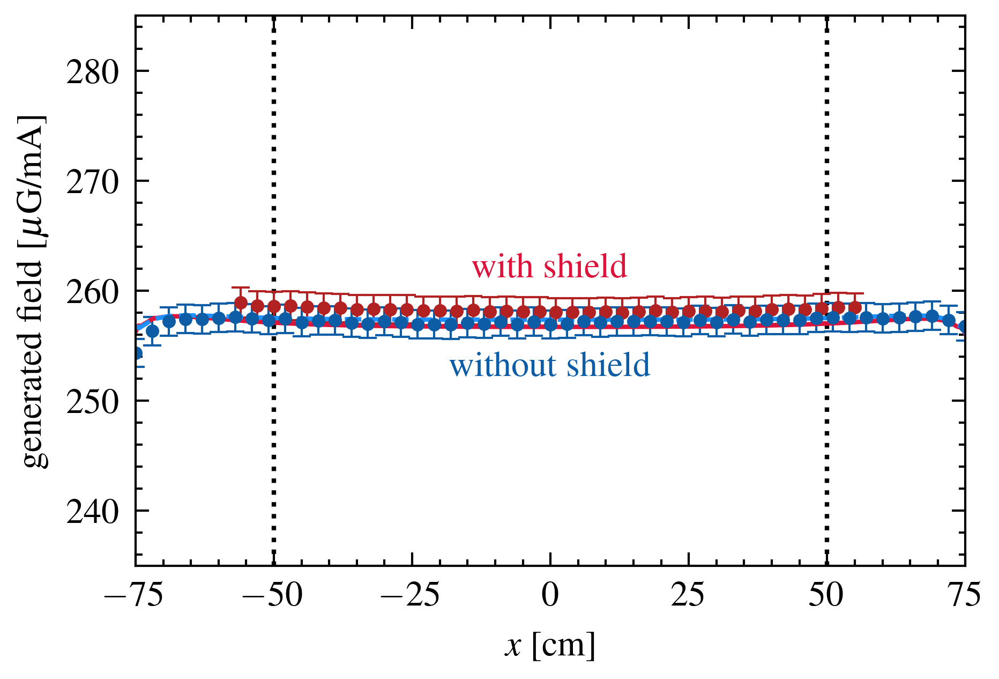

In [64]:
plt.figure(figsize=(3.33,2.22))
plt.axvline(-50, linestyle=':', color = 'k')
plt.axvline(50, linestyle=':', color = 'k')

plt.errorbar(df_Bz_Shield['dist'], df_Bz_Shield['B'], yerr=df_Bz_Shield['B_err'], fmt='o', ms=2, capsize=2, capthick=0.5, elinewidth=0.5, color = 'firebrick')
plt.errorbar(df_Bz_NoShield['dist']-105, df_Bz_NoShield['B'], yerr=df_Bz_NoShield['B_err'], fmt='o', ms=2, capsize=2, capthick=0.5, elinewidth=0.5, color='C0')
plt.plot(sim_Bz_Shield['x']/10, sim_Bz_Shield['B'], '-', color = 'crimson')
plt.plot(sim_Bz_FreeSpace['x']/10, sim_Bz_FreeSpace['B'], '--', color = 'dodgerblue')

plt.xlabel('$x$ [cm]')
plt.ylabel('generated field [$\mu$G/mA]')
plt.xlim(-75, 75)
plt.ylim(235, 285)

plt.text(0, 262, 'with shield', color='crimson', ha='center', va='center')
plt.text(0, 253, 'without shield', color='C0', ha='center', va='center')
plt.grid(False)

# Save Figure. Check each time!
plt.savefig('Graphs/Zcoil_Comparison.pdf', dpi=1200, transparent=True, bbox_inches='tight')

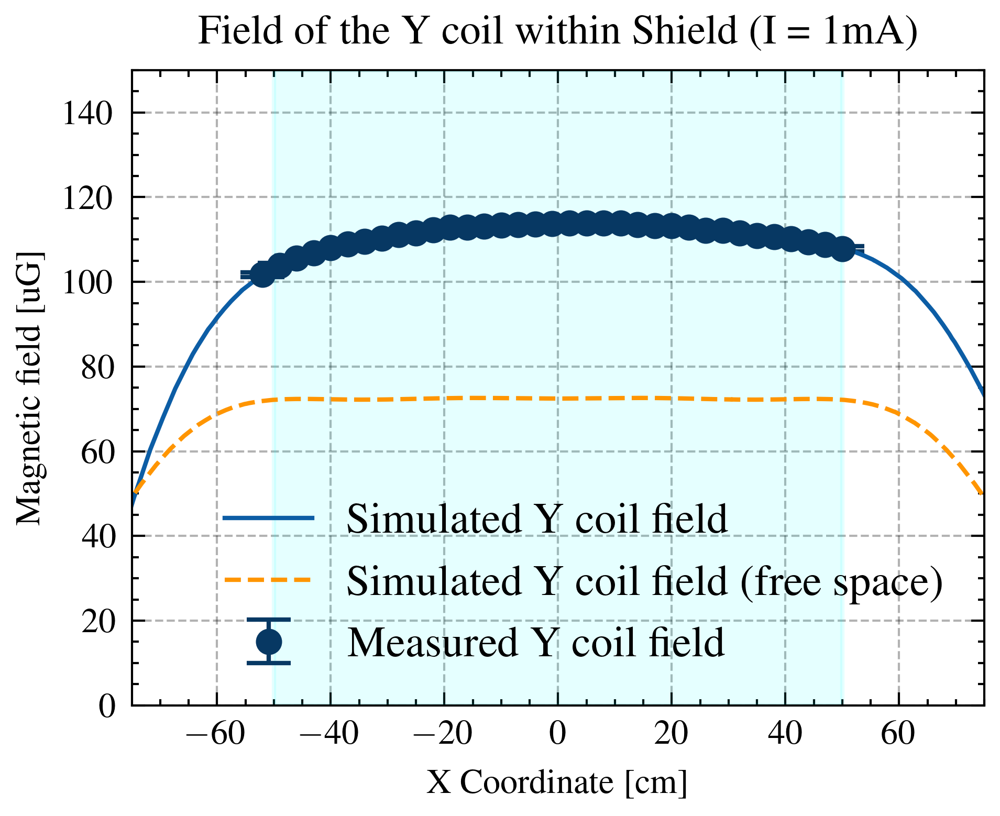

In [199]:
plt.errorbar(-df_By_Shield['dist']+164, df_By_Shield['B'], yerr=df_By_Shield['B_err'], fmt='o', ms=5, capsize=5, capthick=1, label = 'Measured Y coil field', color = darken_color(0))
plt.plot(sim_By_Shield['x']/10, sim_By_Shield['B'] * 113.8 / 115.86, '-', label = 'Simulated Y coil field', color = 'C0')
plt.plot(sim_By_FreeSpace['x']/10, sim_By_FreeSpace['B'], '--', label = 'Simulated Y coil field (free space)', color = 'C2')

plt.legend(loc = 'lower right', fontsize = 10)
plt.xlabel('X Coordinate [cm]')
plt.ylabel('Magnetic field [uG]')
plt.title('Field of the Y coil within Shield (I = 1mA)')
plt.xlim(-75, 75)
plt.ylim(0,150)

# plot_text = 'Measured:\nBz = {:.2f}uG\nVariation = {:.2f}%\nBx(max.) = {:.2f}uG\nBy(max.) = {:.2f}uG'.format(np.mean(df_Bz['Bz2']),
#                                                                                                 delta_Bz/np.mean(df_Bz['Bz2'])*100,
#                                                                                                 np.max(np.abs(df_Bz['Bx2'])), 
#                                                                                                 np.mean(df_Bz['By2']))

# sim_text = 'Simulated:\nBz = {:.2f}uG\nVariation = {:.2f}%\nBx(max.) < 0.30uG\nBy(max.) < 1e-6uG'.format(256.641, 
#                                                                                                (np.max(np.max(Bz_coil_Z[20:80, 250:1250])) - np.min(np.min(Bz_coil_Z[20:80, 250:1250])))*100/256.641)
plt.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
# plt.text(-65, 20, plot_text)
# plt.text(-30, 20, sim_text)
plt.grid(alpha = 0.3)

# Save Figure. Check each time!
# plt.savefig('Graphs/Ycoil_withShield_Beamline.pdf', dpi=1000, transparent=True, bbox_inches='tight')

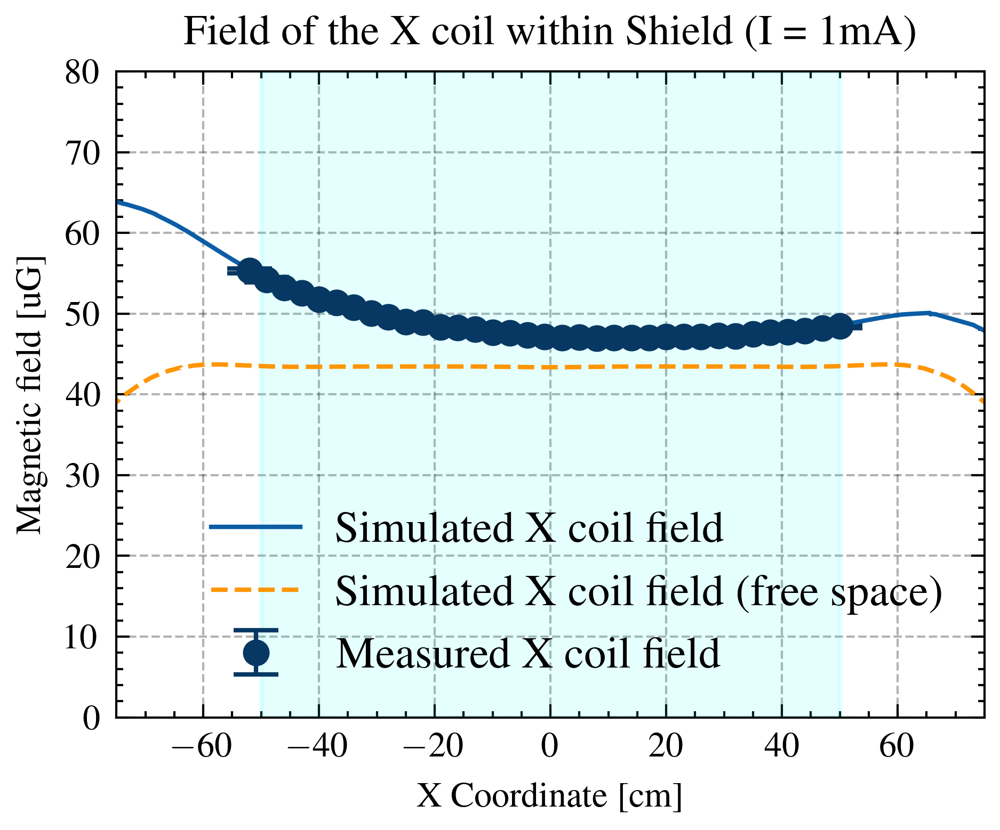

In [200]:
plt.errorbar(-df_Bx_Shield['dist']+164, df_Bx_Shield['B'], yerr=df_Bx_Shield['B_err'], fmt='o', ms=5, capsize=5, capthick=1, label = 'Measured X coil field', color = darken_color(0))
plt.plot(sim_Bx_Shield['x']/10, sim_Bx_Shield['B'], '-', label = 'Simulated X coil field', color = 'C0')
plt.plot(sim_Bx_FreeSpace['x']/10, sim_Bx_FreeSpace['B'], '--', label = 'Simulated X coil field (free space)', color = 'C2')

plt.legend(loc = 'lower right', fontsize = 10)
plt.xlabel('X Coordinate [cm]')
plt.ylabel('Magnetic field [uG]')
plt.title('Field of the X coil within Shield (I = 1mA)')
plt.xlim(-75, 75)
plt.ylim(0,80)

# plot_text = 'Measured:\nBz = {:.2f}uG\nVariation = {:.2f}%\nBx(max.) = {:.2f}uG\nBy(max.) = {:.2f}uG'.format(np.mean(df_Bz['Bz2']),
#                                                                                                 delta_Bz/np.mean(df_Bz['Bz2'])*100,
#                                                                                                 np.max(np.abs(df_Bz['Bx2'])), 
#                                                                                                 np.mean(df_Bz['By2']))

# sim_text = 'Simulated:\nBz = {:.2f}uG\nVariation = {:.2f}%\nBx(max.) < 0.30uG\nBy(max.) < 1e-6uG'.format(256.641, 
#                                                                                                (np.max(np.max(Bz_coil_Z[20:80, 250:1250])) - np.min(np.min(Bz_coil_Z[20:80, 250:1250])))*100/256.641)
plt.axvspan(-50, 50, alpha = 0.1, color = 'cyan')
# plt.text(-65, 20, plot_text)
# plt.text(-30, 20, sim_text)
plt.grid(alpha = 0.3)

# Save Figure. Check each time!
# plt.savefig('Graphs/Xcoil_withShield_Beamline.pdf', dpi=1000, transparent=True, bbox_inches='tight')

In [18]:
(np.max(df_Bx_Shield['B']) - np.min(df_Bx_Shield['B']))/np.mean(df_Bx_Shield['B'])

0.170720054116122

In [22]:
(np.mean(df_Bx_Shield['B']) - np.mean(df_Bx['Bx2'])) / np.mean(df_Bx['Bx2'])

0.12374211345898652